# <font style="color:blue">Compile DarkNet</font>

In [ ]:
!sed -i 's/OPENCV=0/OPENCV=1/' Makefile
!sed -i 's/GPU=0/GPU=1/' Makefile
!sed -i 's/CUDNN=0/CUDNN=1/' Makefile

print("Building. . . It might take 2-3 minutes")

!make &> build_log.txt

# <font style="color:blue">Prepare dataset files</font>

In [ ]:
import random
import os
import subprocess
import sys

image_dir = "./kaggle_and_no-mask_dataset"
f_val = open("data_test_mask.txt", 'w')
f_train = open("data_train_mask.txt", 'w')

path, dirs, files = next(os.walk(image_dir))

#path = "./OID-data"
#dirs = []
#files = 
data_size = len(files)

ind = 0
data_test_size = int(0.2 * data_size)
test_array = random.sample(range(data_size), k=data_test_size)

for f in os.listdir(image_dir):
    if(f.split(".")[-1] == "jpg"):
        ind += 1
        
        if ind in test_array:
            f_val.write(image_dir+'/'+f+'\n')
        else:
            f_train.write(image_dir+'/'+f+'\n')

f_train.close()
f_val.close()

# <font style="color:blue">Training Configuration for YOLO3</font>
Training had been on my local machine
GPU : RTX 2070 Super (8GB)


File 1: yolov3-mask-setup.data

The contents of the file are as follows:
```
classes = 1
train  = data_train_mask.txt
valid  = data_test_mask.txt
names = class.names
backup = backup/
```

File 2: yolov3-mask-train.cfg

Values changed from default values are mentioned below
```
batch = 64
subdivision = 64     //To accommodate memory for large network size

width= 608
height= 608

burn_in= 400
max_batches = 4000

steps = 3200, 3600
scales = .1, .1

classes = 2 in all 3 [yolo] layers

filter = 21 in [convolution] layers before 3 [yolo] layers | (2 + 5) * 3 =====> (classes + 5) * no of masks

```




In [ ]:
!./darknet detector train yolov3-mask-setup.data yolov3-mask-train.cfg ./darknet53.conv.74 -dont_show -map 2> train_log_yolov3.txt

 CUDNN_HALF=1 
 Prepare additional network for mAP calculation...
net.optimized_memory = 0 
mini_batch = 1, batch = 64, time_steps = 1, train = 0 
yolov3-mask-train
net.optimized_memory = 0 
mini_batch = 1, batch = 64, time_steps = 1, train = 1 

 seen 64, trained: 0 K-images (0 Kilo-batches_64) 
Learning Rate: 0.001, Momentum: 0.9, Decay: 0.0005
 Detection layer: 82 - type = 27 
 Detection layer: 94 - type = 27 
 Detection layer: 106 - type = 27 
Resizing, random_coef = 1.40 

 896 x 896 
 try to allocate additional workspace_size = 81.93 MB 
 CUDA allocate done! 
Loaded: 0.000024 seconds

 (next mAP calculation at 400 iterations) 
 1: 14960.949219, 14960.949219 avg loss, 0.000000 rate, 16.354039 seconds, 64 images, -1.000000 hours left
Loaded: 0.000024 seconds

 (next mAP calculation at 400 iterations) 
 2: 14961.255859, 14960.979492 avg loss, 0.000000 rate, 17.630455 seconds, 128 images, 18.166645 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 400 iterations) 
 3: 14


 (next mAP calculation at 400 iterations) 
 41: 572.354919, 3403.438232 avg loss, 0.000000 rate, 12.561775 seconds, 2624 images, 16.943102 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 400 iterations) 
 42: 514.791870, 3114.573486 avg loss, 0.000000 rate, 12.396936 seconds, 2688 images, 16.911816 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 400 iterations) 
 43: 467.501801, 2849.866211 avg loss, 0.000000 rate, 12.157027 seconds, 2752 images, 16.878996 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 400 iterations) 
 44: 426.065613, 2607.486084 avg loss, 0.000000 rate, 12.222233 seconds, 2816 images, 16.843832 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 400 iterations) 
 45: 388.833496, 2385.620850 avg loss, 0.000000 rate, 12.257925 seconds, 2880 images, 16.809703 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 400 iterations) 
 46: 354.355621, 2182.494385 avg loss, 0.000000 rate, 12.215549 seconds, 294


 (next mAP calculation at 400 iterations) 
 86: 7.436896, 47.328598 avg loss, 0.000002 rate, 9.508801 seconds, 5504 images, 14.371904 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 400 iterations) 
 87: 8.185213, 43.414261 avg loss, 0.000002 rate, 9.720902 seconds, 5568 images, 14.331568 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 400 iterations) 
 88: 8.083030, 39.881138 avg loss, 0.000002 rate, 9.765262 seconds, 5632 images, 14.293913 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 400 iterations) 
 89: 7.812161, 36.674240 avg loss, 0.000002 rate, 9.787359 seconds, 5696 images, 14.257090 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 400 iterations) 
 90: 5.522337, 33.559052 avg loss, 0.000003 rate, 9.553228 seconds, 5760 images, 14.220848 hours left
Resizing, random_coef = 1.40 

 800 x 800 
 try to allocate additional workspace_size = 65.32 MB 
 CUDA allocate done! 
Loaded: 0.000022 seconds

 (next mAP calculation a

 try to allocate additional workspace_size = 76.18 MB 
 CUDA allocate done! 
Loaded: 0.000022 seconds

 (next mAP calculation at 400 iterations) 
 131: 6.871302, 7.032083 avg loss, 0.000012 rate, 15.652395 seconds, 8384 images, 13.252188 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 400 iterations) 
 132: 6.079947, 6.936869 avg loss, 0.000012 rate, 15.701895 seconds, 8448 images, 13.287886 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 400 iterations) 
 133: 5.496249, 6.792807 avg loss, 0.000012 rate, 15.608465 seconds, 8512 images, 13.323716 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 400 iterations) 
 134: 3.421857, 6.455712 avg loss, 0.000013 rate, 15.295363 seconds, 8576 images, 13.358140 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 400 iterations) 
 135: 8.396223, 6.649763 avg loss, 0.000013 rate, 16.095591 seconds, 8640 images, 13.388814 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 400 iterati


 (next mAP calculation at 400 iterations) 
 175: 5.869871, 5.822359 avg loss, 0.000037 rate, 8.252529 seconds, 11200 images, 12.615198 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 400 iterations) 
 176: 5.578319, 5.797955 avg loss, 0.000037 rate, 8.196465 seconds, 11264 images, 12.576729 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 400 iterations) 
 177: 7.265473, 5.944707 avg loss, 0.000038 rate, 8.402219 seconds, 11328 images, 12.538027 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 400 iterations) 
 178: 8.190590, 6.169295 avg loss, 0.000039 rate, 8.426254 seconds, 11392 images, 12.501874 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 400 iterations) 
 179: 6.441852, 6.196551 avg loss, 0.000040 rate, 8.327565 seconds, 11456 images, 12.466314 hours left
Loaded: 0.000030 seconds

 (next mAP calculation at 400 iterations) 
 180: 8.915954, 6.468491 avg loss, 0.000041 rate, 8.690715 seconds, 11520 images, 12.430039 hour


 (next mAP calculation at 400 iterations) 
 220: 4.733754, 5.172494 avg loss, 0.000092 rate, 13.830832 seconds, 14080 images, 11.556743 hours left
Resizing, random_coef = 1.40 

 480 x 480 
 try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 
Loaded: 0.157925 seconds - performance bottleneck on CPU or Disk HDD/SSD

 (next mAP calculation at 400 iterations) 
 221: 5.894520, 5.244697 avg loss, 0.000093 rate, 5.405030 seconds, 14144 images, 11.586399 hours left
Loaded: 0.000023 seconds

 (next mAP calculation at 400 iterations) 
 222: 3.842052, 5.104433 avg loss, 0.000095 rate, 5.284424 seconds, 14208 images, 11.528931 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 400 iterations) 
 223: 5.861693, 5.180159 avg loss, 0.000097 rate, 5.418017 seconds, 14272 images, 11.469099 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 400 iterations) 
 224: 3.877489, 5.049891 avg loss, 0.000098 rate, 5.287788 seconds, 14336 images, 11.411252 hours l


 (next mAP calculation at 400 iterations) 
 264: 3.161087, 4.082275 avg loss, 0.000190 rate, 10.483258 seconds, 16896 images, 10.478421 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 400 iterations) 
 265: 3.570819, 4.031129 avg loss, 0.000193 rate, 10.505620 seconds, 16960 images, 10.482430 hours left
Loaded: 0.000034 seconds

 (next mAP calculation at 400 iterations) 
 266: 4.311403, 4.059157 avg loss, 0.000196 rate, 10.667218 seconds, 17024 images, 10.486602 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 400 iterations) 
 267: 4.506998, 4.103941 avg loss, 0.000199 rate, 10.629492 seconds, 17088 images, 10.492379 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 400 iterations) 
 268: 4.173137, 4.110860 avg loss, 0.000202 rate, 10.615614 seconds, 17152 images, 10.497678 hours left
Loaded: 0.000038 seconds

 (next mAP calculation at 400 iterations) 
 269: 3.359887, 4.035763 avg loss, 0.000205 rate, 10.489228 seconds, 17216 images, 10.50275


 (next mAP calculation at 400 iterations) 
 309: 4.287205, 3.446644 avg loss, 0.000356 rate, 14.026386 seconds, 19776 images, 10.900792 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 400 iterations) 
 310: 2.066352, 3.308615 avg loss, 0.000361 rate, 13.512323 seconds, 19840 images, 10.935594 hours left
Resizing, random_coef = 1.40 

 672 x 672 
 try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 
Loaded: 0.034692 seconds

 (next mAP calculation at 400 iterations) 
 311: 2.914870, 3.269240 avg loss, 0.000365 rate, 9.843402 seconds, 19904 images, 10.964739 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 400 iterations) 
 312: 3.636658, 3.305982 avg loss, 0.000370 rate, 9.901796 seconds, 19968 images, 10.956315 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 400 iterations) 
 313: 2.839205, 3.259304 avg loss, 0.000375 rate, 9.753020 seconds, 20032 images, 10.948191 hours left
Loaded: 0.000029 seconds

 (next mAP calcul


 (next mAP calculation at 400 iterations) 
 353: 2.294620, 2.784059 avg loss, 0.000607 rate, 9.774983 seconds, 22592 images, 11.693951 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 400 iterations) 
 354: 1.937410, 2.699394 avg loss, 0.000613 rate, 9.647175 seconds, 22656 images, 11.676038 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 400 iterations) 
 355: 2.105118, 2.639966 avg loss, 0.000620 rate, 9.704118 seconds, 22720 images, 11.656982 hours left
Loaded: 0.000030 seconds

 (next mAP calculation at 400 iterations) 
 356: 2.507715, 2.626741 avg loss, 0.000627 rate, 9.798321 seconds, 22784 images, 11.638667 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 400 iterations) 
 357: 2.617904, 2.625858 avg loss, 0.000635 rate, 9.890751 seconds, 22848 images, 11.621461 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 400 iterations) 
 358: 1.897157, 2.552988 avg loss, 0.000642 rate, 9.635169 seconds, 22912 images, 11.605336 hour


 (next mAP calculation at 400 iterations) 
 398: 2.760956, 2.660848 avg loss, 0.000980 rate, 13.759929 seconds, 25472 images, 11.152399 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 400 iterations) 
 399: 3.607469, 2.755510 avg loss, 0.000990 rate, 14.011293 seconds, 25536 images, 11.178551 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 400 iterations) 
 400: 2.344055, 2.714365 avg loss, 0.001000 rate, 13.655137 seconds, 25600 images, 11.206917 hours left
Resizing to initial size: 608 x 608  try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 

 calculation mAP (mean average precision)...
 Detection layer: 82 - type = 27 
 Detection layer: 94 - type = 27 
 Detection layer: 106 - type = 27 

 detections_count = 3549, unique_truth_count = 1456  
class_id = 0, name = Mask, ap = 44.80%   	 (TP = 283, FP = 136) 
class_id = 1, name = No-mask, ap = 18.40%   	 (TP = 103, FP = 46) 

 for conf_thresh = 0.25, precision = 0.68, recall = 0.27


 (next mAP calculation at 500 iterations) 
 Last accuracy mAP@0.5 = 31.60 %, best = 31.60 % 
 430: 1.847919, 2.856820 avg loss, 0.001000 rate, 12.579961 seconds, 27520 images, 11.932286 hours left
Resizing, random_coef = 1.40 

 480 x 480 
 try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 
Loaded: 0.082520 seconds

 (next mAP calculation at 500 iterations) 
 Last accuracy mAP@0.5 = 31.60 %, best = 31.60 % 
 431: 3.723383, 2.943476 avg loss, 0.001000 rate, 5.407393 seconds, 27584 images, 11.937715 hours left
Loaded: 0.000034 seconds

 (next mAP calculation at 500 iterations) 
 Last accuracy mAP@0.5 = 31.60 %, best = 31.60 % 
 432: 2.455344, 2.894663 avg loss, 0.001000 rate, 5.323890 seconds, 27648 images, 11.872764 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 500 iterations) 
 Last accuracy mAP@0.5 = 31.60 %, best = 31.60 % 
 433: 2.371734, 2.842370 avg loss, 0.001000 rate, 5.322657 seconds, 27712 images, 11.806803 hours left
Loaded: 0.000022


 (next mAP calculation at 500 iterations) 
 Last accuracy mAP@0.5 = 31.60 %, best = 31.60 % 
 465: 1.908969, 2.514299 avg loss, 0.001000 rate, 6.888637 seconds, 29760 images, 11.267501 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 500 iterations) 
 Last accuracy mAP@0.5 = 31.60 %, best = 31.60 % 
 466: 2.055204, 2.468390 avg loss, 0.001000 rate, 6.890742 seconds, 29824 images, 11.222469 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 500 iterations) 
 Last accuracy mAP@0.5 = 31.60 %, best = 31.60 % 
 467: 3.065694, 2.528120 avg loss, 0.001000 rate, 7.030147 seconds, 29888 images, 11.177889 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 500 iterations) 
 Last accuracy mAP@0.5 = 31.60 %, best = 31.60 % 
 468: 2.035404, 2.478848 avg loss, 0.001000 rate, 6.913122 seconds, 29952 images, 11.135103 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 500 iterations) 
 Last accuracy mAP@0.5 = 31.60 %, best = 31.60 % 
 469: 2.356601, 2.

Resizing to initial size: 608 x 608  try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 

 calculation mAP (mean average precision)...
 Detection layer: 82 - type = 27 
 Detection layer: 94 - type = 27 
 Detection layer: 106 - type = 27 

 detections_count = 5688, unique_truth_count = 1456  
class_id = 0, name = Mask, ap = 80.87%   	 (TP = 494, FP = 99) 
class_id = 1, name = No-mask, ap = 61.02%   	 (TP = 425, FP = 160) 

 for conf_thresh = 0.25, precision = 0.78, recall = 0.63, F1-score = 0.70 
 for conf_thresh = 0.25, TP = 919, FP = 259, FN = 537, average IoU = 55.28 % 

 IoU threshold = 50 %, used Area-Under-Curve for each unique Recall 
 mean average precision (mAP@0.50) = 0.709423, or 70.94 % 

Set -points flag:
 `-points 101` for MS COCO 
 `-points 11` for PascalVOC 2007 (uncomment `difficult` in voc.data) 
 `-points 0` (AUC) for ImageNet, PascalVOC 2010-2012, your custom dataset

 mean_average_precision (mAP@0.5) = 0.709423 
New best mAP!
Resizing, random


 (next mAP calculation at 600 iterations) 
 Last accuracy mAP@0.5 = 70.94 %, best = 70.94 % 
 532: 1.178505, 1.840998 avg loss, 0.001000 rate, 13.819170 seconds, 34048 images, 11.065212 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 600 iterations) 
 Last accuracy mAP@0.5 = 70.94 %, best = 70.94 % 
 533: 1.651788, 1.822077 avg loss, 0.001000 rate, 13.758300 seconds, 34112 images, 11.087684 hours left
Loaded: 0.000030 seconds

 (next mAP calculation at 600 iterations) 
 Last accuracy mAP@0.5 = 70.94 %, best = 70.94 % 
 534: 1.747983, 1.814668 avg loss, 0.001000 rate, 13.716653 seconds, 34176 images, 11.109308 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 600 iterations) 
 Last accuracy mAP@0.5 = 70.94 %, best = 70.94 % 
 535: 1.678734, 1.801074 avg loss, 0.001000 rate, 13.815407 seconds, 34240 images, 11.130276 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 600 iterations) 
 Last accuracy mAP@0.5 = 70.94 %, best = 70.94 % 
 536: 1.567627


 (next mAP calculation at 600 iterations) 
 Last accuracy mAP@0.5 = 70.94 %, best = 70.94 % 
 568: 1.957900, 2.073269 avg loss, 0.001000 rate, 9.783488 seconds, 36352 images, 10.829199 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 600 iterations) 
 Last accuracy mAP@0.5 = 70.94 %, best = 70.94 % 
 569: 1.828572, 2.048800 avg loss, 0.001000 rate, 9.770248 seconds, 36416 images, 10.814176 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 600 iterations) 
 Last accuracy mAP@0.5 = 70.94 %, best = 70.94 % 
 570: 1.308208, 1.974740 avg loss, 0.001000 rate, 9.660061 seconds, 36480 images, 10.799151 hours left
Resizing, random_coef = 1.40 

 608 x 608 
 try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 
Loaded: 0.114308 seconds - performance bottleneck on CPU or Disk HDD/SSD

 (next mAP calculation at 600 iterations) 
 Last accuracy mAP@0.5 = 70.94 %, best = 70.94 % 
 571: 2.521532, 2.029420 avg loss, 0.001000 rate, 8.300116 seconds, 3654

Resizing, random_coef = 1.40 

 864 x 864 
 try to allocate additional workspace_size = 76.18 MB 
 CUDA allocate done! 
Loaded: 0.000038 seconds

 (next mAP calculation at 700 iterations) 
 Last accuracy mAP@0.5 = 73.87 %, best = 73.87 % 
 601: 1.927448, 1.910747 avg loss, 0.001000 rate, 15.720313 seconds, 38464 images, 10.517041 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 700 iterations) 
 Last accuracy mAP@0.5 = 73.87 %, best = 73.87 % 
 602: 1.457130, 1.865385 avg loss, 0.001000 rate, 15.640373 seconds, 38528 images, 10.560297 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 700 iterations) 
 Last accuracy mAP@0.5 = 73.87 %, best = 73.87 % 
 603: 2.421438, 1.920990 avg loss, 0.001000 rate, 16.084758 seconds, 38592 images, 10.602322 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 700 iterations) 
 Last accuracy mAP@0.5 = 73.87 %, best = 73.87 % 
 604: 1.033796, 1.832271 avg loss, 0.001000 rate, 15.343245 seconds, 38656 images, 10.648077


 (next mAP calculation at 700 iterations) 
 Last accuracy mAP@0.5 = 73.87 %, best = 73.87 % 
 636: 1.204702, 1.734315 avg loss, 0.001000 rate, 9.746779 seconds, 40704 images, 10.498685 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 700 iterations) 
 Last accuracy mAP@0.5 = 73.87 %, best = 73.87 % 
 637: 1.148025, 1.675686 avg loss, 0.001000 rate, 9.652557 seconds, 40768 images, 10.484777 hours left
Loaded: 0.000033 seconds

 (next mAP calculation at 700 iterations) 
 Last accuracy mAP@0.5 = 73.87 %, best = 73.87 % 
 638: 1.113450, 1.619462 avg loss, 0.001000 rate, 9.698882 seconds, 40832 images, 10.470100 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 700 iterations) 
 Last accuracy mAP@0.5 = 73.87 %, best = 73.87 % 
 639: 2.046999, 1.662216 avg loss, 0.001000 rate, 9.934430 seconds, 40896 images, 10.455977 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 700 iterations) 
 Last accuracy mAP@0.5 = 73.87 %, best = 73.87 % 
 640: 2.683356, 1.


 (next mAP calculation at 700 iterations) 
 Last accuracy mAP@0.5 = 73.87 %, best = 73.87 % 
 671: 2.191602, 1.700452 avg loss, 0.001000 rate, 15.066639 seconds, 42944 images, 10.192033 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 700 iterations) 
 Last accuracy mAP@0.5 = 73.87 %, best = 73.87 % 
 672: 1.754300, 1.705837 avg loss, 0.001000 rate, 15.030831 seconds, 43008 images, 10.229438 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 700 iterations) 
 Last accuracy mAP@0.5 = 73.87 %, best = 73.87 % 
 673: 1.931931, 1.728446 avg loss, 0.001000 rate, 15.005979 seconds, 43072 images, 10.266095 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 700 iterations) 
 Last accuracy mAP@0.5 = 73.87 %, best = 73.87 % 
 674: 1.267965, 1.682398 avg loss, 0.001000 rate, 14.721062 seconds, 43136 images, 10.302115 hours left
Loaded: 0.000019 seconds

 (next mAP calculation at 700 iterations) 
 Last accuracy mAP@0.5 = 73.87 %, best = 73.87 % 
 675: 1.479605


 (next mAP calculation at 800 iterations) 
 Last accuracy mAP@0.5 = 67.33 %, best = 73.87 % 
 702: 1.482421, 2.109102 avg loss, 0.001000 rate, 9.748784 seconds, 44928 images, 10.659733 hours left
Loaded: 0.000034 seconds

 (next mAP calculation at 800 iterations) 
 Last accuracy mAP@0.5 = 67.33 %, best = 73.87 % 
 703: 1.423909, 2.040583 avg loss, 0.001000 rate, 9.762211 seconds, 44992 images, 10.642446 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 800 iterations) 
 Last accuracy mAP@0.5 = 67.33 %, best = 73.87 % 
 704: 3.283189, 2.164843 avg loss, 0.001000 rate, 10.135054 seconds, 45056 images, 10.625427 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 800 iterations) 
 Last accuracy mAP@0.5 = 67.33 %, best = 73.87 % 
 705: 2.477350, 2.196094 avg loss, 0.001000 rate, 10.082871 seconds, 45120 images, 10.611965 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 800 iterations) 
 Last accuracy mAP@0.5 = 67.33 %, best = 73.87 % 
 706: 1.975867, 


 (next mAP calculation at 800 iterations) 
 Last accuracy mAP@0.5 = 67.33 %, best = 73.87 % 
 738: 1.013028, 1.430209 avg loss, 0.001000 rate, 12.420995 seconds, 47232 images, 9.761739 hours left
Loaded: 0.000019 seconds

 (next mAP calculation at 800 iterations) 
 Last accuracy mAP@0.5 = 67.33 %, best = 73.87 % 
 739: 1.822775, 1.469465 avg loss, 0.001000 rate, 12.755612 seconds, 47296 images, 9.776670 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 800 iterations) 
 Last accuracy mAP@0.5 = 67.33 %, best = 73.87 % 
 740: 1.133363, 1.435855 avg loss, 0.001000 rate, 12.534108 seconds, 47360 images, 9.794448 hours left
Resizing, random_coef = 1.40 

 672 x 672 
 try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 
Loaded: 0.076661 seconds

 (next mAP calculation at 800 iterations) 
 Last accuracy mAP@0.5 = 67.33 %, best = 73.87 % 
 741: 1.204408, 1.412710 avg loss, 0.001000 rate, 9.653054 seconds, 47424 images, 9.810007 hours left
Loaded: 0.000020 s


 (next mAP calculation at 800 iterations) 
 Last accuracy mAP@0.5 = 67.33 %, best = 73.87 % 
 773: 1.256734, 1.490461 avg loss, 0.001000 rate, 15.624061 seconds, 49472 images, 9.489337 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 800 iterations) 
 Last accuracy mAP@0.5 = 67.33 %, best = 73.87 % 
 774: 3.090192, 1.650434 avg loss, 0.001000 rate, 16.567313 seconds, 49536 images, 9.534497 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 800 iterations) 
 Last accuracy mAP@0.5 = 67.33 %, best = 73.87 % 
 775: 2.040188, 1.689409 avg loss, 0.001000 rate, 15.807058 seconds, 49600 images, 9.587613 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 800 iterations) 
 Last accuracy mAP@0.5 = 67.33 %, best = 73.87 % 
 776: 1.557391, 1.676207 avg loss, 0.001000 rate, 15.759821 seconds, 49664 images, 9.633342 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 800 iterations) 
 Last accuracy mAP@0.5 = 67.33 %, best = 73.87 % 
 777: 1.666257, 1.


 (next mAP calculation at 900 iterations) 
 Last accuracy mAP@0.5 = 73.57 %, best = 73.87 % 
 804: 1.455954, 1.765997 avg loss, 0.001000 rate, 14.854199 seconds, 51456 images, 9.906213 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 900 iterations) 
 Last accuracy mAP@0.5 = 73.57 %, best = 73.87 % 
 805: 1.204350, 1.709832 avg loss, 0.001000 rate, 14.835015 seconds, 51520 images, 9.939023 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 900 iterations) 
 Last accuracy mAP@0.5 = 73.57 %, best = 73.87 % 
 806: 1.591563, 1.698005 avg loss, 0.001000 rate, 15.048190 seconds, 51584 images, 9.971294 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 900 iterations) 
 Last accuracy mAP@0.5 = 73.57 %, best = 73.87 % 
 807: 1.972454, 1.725450 avg loss, 0.001000 rate, 15.042544 seconds, 51648 images, 10.005092 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 900 iterations) 
 Last accuracy mAP@0.5 = 73.57 %, best = 73.87 % 
 808: 1.862364, 1


 (next mAP calculation at 900 iterations) 
 Last accuracy mAP@0.5 = 73.57 %, best = 73.87 % 
 840: 1.859071, 1.572644 avg loss, 0.001000 rate, 7.579383 seconds, 53760 images, 9.990846 hours left
Resizing, random_coef = 1.40 

 544 x 544 
 try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 
Loaded: 0.053127 seconds

 (next mAP calculation at 900 iterations) 
 Last accuracy mAP@0.5 = 73.57 %, best = 73.87 % 
 841: 0.839069, 1.499286 avg loss, 0.001000 rate, 6.832455 seconds, 53824 images, 9.957468 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 900 iterations) 
 Last accuracy mAP@0.5 = 73.57 %, best = 73.87 % 
 842: 2.511381, 1.600496 avg loss, 0.001000 rate, 7.181321 seconds, 53888 images, 9.918315 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 900 iterations) 
 Last accuracy mAP@0.5 = 73.57 %, best = 73.87 % 
 843: 0.650493, 1.505495 avg loss, 0.001000 rate, 6.789522 seconds, 53952 images, 9.882128 hours left
Loaded: 0.000027 seco


 (next mAP calculation at 900 iterations) 
 Last accuracy mAP@0.5 = 73.57 %, best = 73.87 % 
 875: 1.347429, 1.653554 avg loss, 0.001000 rate, 6.018388 seconds, 56000 images, 8.821149 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 900 iterations) 
 Last accuracy mAP@0.5 = 73.57 %, best = 73.87 % 
 876: 1.226901, 1.610889 avg loss, 0.001000 rate, 5.928898 seconds, 56064 images, 8.785181 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 900 iterations) 
 Last accuracy mAP@0.5 = 73.57 %, best = 73.87 % 
 877: 1.153196, 1.565119 avg loss, 0.001000 rate, 5.935145 seconds, 56128 images, 8.748779 hours left
Loaded: 0.000030 seconds

 (next mAP calculation at 900 iterations) 
 Last accuracy mAP@0.5 = 73.57 %, best = 73.87 % 
 878: 0.812931, 1.489901 avg loss, 0.001000 rate, 5.848310 seconds, 56192 images, 8.712779 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 900 iterations) 
 Last accuracy mAP@0.5 = 73.57 %, best = 73.87 % 
 879: 1.137561, 1.4546


 (next mAP calculation at 1000 iterations) 
 Last accuracy mAP@0.5 = 80.48 %, best = 80.48 % 
 906: 1.369125, 1.433888 avg loss, 0.001000 rate, 6.963375 seconds, 57984 images, 8.080089 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 1000 iterations) 
 Last accuracy mAP@0.5 = 80.48 %, best = 80.48 % 
 907: 1.424094, 1.432908 avg loss, 0.001000 rate, 6.923991 seconds, 58048 images, 8.059134 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 1000 iterations) 
 Last accuracy mAP@0.5 = 80.48 %, best = 80.48 % 
 908: 1.716057, 1.461223 avg loss, 0.001000 rate, 7.038370 seconds, 58112 images, 8.038032 hours left
Loaded: 0.000030 seconds

 (next mAP calculation at 1000 iterations) 
 Last accuracy mAP@0.5 = 80.48 %, best = 80.48 % 
 909: 1.281081, 1.443209 avg loss, 0.001000 rate, 6.904147 seconds, 58176 images, 8.018104 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 1000 iterations) 
 Last accuracy mAP@0.5 = 80.48 %, best = 80.48 % 
 910: 1.498997, 1

Loaded: 0.082770 seconds

 (next mAP calculation at 1000 iterations) 
 Last accuracy mAP@0.5 = 80.48 %, best = 80.48 % 
 941: 1.435289, 1.415169 avg loss, 0.001000 rate, 5.918453 seconds, 60224 images, 7.978962 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1000 iterations) 
 Last accuracy mAP@0.5 = 80.48 %, best = 80.48 % 
 942: 1.490589, 1.422711 avg loss, 0.001000 rate, 5.964939 seconds, 60288 images, 7.950166 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 1000 iterations) 
 Last accuracy mAP@0.5 = 80.48 %, best = 80.48 % 
 943: 1.092714, 1.389712 avg loss, 0.001000 rate, 5.942418 seconds, 60352 images, 7.921334 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 1000 iterations) 
 Last accuracy mAP@0.5 = 80.48 %, best = 80.48 % 
 944: 1.988573, 1.449598 avg loss, 0.001000 rate, 5.940685 seconds, 60416 images, 7.892582 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1000 iterations) 
 Last accuracy mAP@0.5 = 80.48 %, best = 8


 (next mAP calculation at 1000 iterations) 
 Last accuracy mAP@0.5 = 80.48 %, best = 80.48 % 
 976: 1.768803, 1.551504 avg loss, 0.001000 rate, 5.390882 seconds, 62464 images, 8.001370 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1000 iterations) 
 Last accuracy mAP@0.5 = 80.48 %, best = 80.48 % 
 977: 1.688273, 1.565181 avg loss, 0.001000 rate, 5.390748 seconds, 62528 images, 7.966640 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1000 iterations) 
 Last accuracy mAP@0.5 = 80.48 %, best = 80.48 % 
 978: 1.428200, 1.551483 avg loss, 0.001000 rate, 5.358942 seconds, 62592 images, 7.932241 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1000 iterations) 
 Last accuracy mAP@0.5 = 80.48 %, best = 80.48 % 
 979: 1.651243, 1.561459 avg loss, 0.001000 rate, 5.367299 seconds, 62656 images, 7.897904 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 1000 iterations) 
 Last accuracy mAP@0.5 = 80.48 %, best = 80.48 % 
 980: 1.953234, 1


 (next mAP calculation at 1100 iterations) 
 Last accuracy mAP@0.5 = 73.45 %, best = 80.48 % 
 1007: 1.129425, 1.443969 avg loss, 0.001000 rate, 5.295309 seconds, 64448 images, 7.867180 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1100 iterations) 
 Last accuracy mAP@0.5 = 73.45 %, best = 80.48 % 
 1008: 1.180838, 1.417656 avg loss, 0.001000 rate, 5.276303 seconds, 64512 images, 7.832533 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1100 iterations) 
 Last accuracy mAP@0.5 = 73.45 %, best = 80.48 % 
 1009: 1.204801, 1.396370 avg loss, 0.001000 rate, 5.318855 seconds, 64576 images, 7.798060 hours left
Loaded: 0.000035 seconds

 (next mAP calculation at 1100 iterations) 
 Last accuracy mAP@0.5 = 73.45 %, best = 80.48 % 
 1010: 0.862070, 1.342940 avg loss, 0.001000 rate, 5.242267 seconds, 64640 images, 7.764270 hours left
Resizing, random_coef = 1.40 

 672 x 672 
 try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 
Loaded: 0.000


 (next mAP calculation at 1100 iterations) 
 Last accuracy mAP@0.5 = 73.45 %, best = 80.48 % 
 1042: 1.353421, 1.585844 avg loss, 0.001000 rate, 13.927617 seconds, 66688 images, 8.030052 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 1100 iterations) 
 Last accuracy mAP@0.5 = 73.45 %, best = 80.48 % 
 1043: 1.511702, 1.578429 avg loss, 0.001000 rate, 13.994711 seconds, 66752 images, 8.064190 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 1100 iterations) 
 Last accuracy mAP@0.5 = 73.45 %, best = 80.48 % 
 1044: 2.119164, 1.632503 avg loss, 0.001000 rate, 14.240781 seconds, 66816 images, 8.098500 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 1100 iterations) 
 Last accuracy mAP@0.5 = 73.45 %, best = 80.48 % 
 1045: 1.177493, 1.587002 avg loss, 0.001000 rate, 13.782305 seconds, 66880 images, 8.134447 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 1100 iterations) 
 Last accuracy mAP@0.5 = 73.45 %, best = 80.48 % 
 1046: 0.


 (next mAP calculation at 1100 iterations) 
 Last accuracy mAP@0.5 = 73.45 %, best = 80.48 % 
 1078: 1.920831, 1.259950 avg loss, 0.001000 rate, 13.119691 seconds, 68992 images, 8.482687 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 1100 iterations) 
 Last accuracy mAP@0.5 = 73.45 %, best = 80.48 % 
 1079: 0.844870, 1.218442 avg loss, 0.001000 rate, 12.536642 seconds, 69056 images, 8.504348 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1100 iterations) 
 Last accuracy mAP@0.5 = 73.45 %, best = 80.48 % 
 1080: 1.480878, 1.244686 avg loss, 0.001000 rate, 12.811939 seconds, 69120 images, 8.521026 hours left
Resizing, random_coef = 1.40 

 576 x 576 
 try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 
Loaded: 0.113642 seconds - performance bottleneck on CPU or Disk HDD/SSD

 (next mAP calculation at 1100 iterations) 
 Last accuracy mAP@0.5 = 73.45 %, best = 80.48 % 
 1081: 1.486634, 1.268880 avg loss, 0.001000 rate, 7.690567 secon


 (next mAP calculation at 1200 iterations) 
 Last accuracy mAP@0.5 = 80.47 %, best = 80.48 % 
 1109: 1.721776, 1.318162 avg loss, 0.001000 rate, 5.415328 seconds, 70976 images, 7.756584 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 1200 iterations) 
 Last accuracy mAP@0.5 = 80.47 %, best = 80.48 % 
 1110: 1.453980, 1.331743 avg loss, 0.001000 rate, 5.334490 seconds, 71040 images, 7.722507 hours left
Resizing, random_coef = 1.40 

 480 x 480 
 try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 
Loaded: 0.137373 seconds - performance bottleneck on CPU or Disk HDD/SSD

 (next mAP calculation at 1200 iterations) 
 Last accuracy mAP@0.5 = 80.47 %, best = 80.48 % 
 1111: 1.394879, 1.338057 avg loss, 0.001000 rate, 5.343531 seconds, 71104 images, 7.688106 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 1200 iterations) 
 Last accuracy mAP@0.5 = 80.47 %, best = 80.48 % 
 1112: 1.200020, 1.324253 avg loss, 0.001000 rate, 5.330313 seconds,


 (next mAP calculation at 1200 iterations) 
 Last accuracy mAP@0.5 = 80.47 %, best = 80.48 % 
 1144: 2.323257, 1.437545 avg loss, 0.001000 rate, 7.672768 seconds, 73216 images, 7.745196 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1200 iterations) 
 Last accuracy mAP@0.5 = 80.47 %, best = 80.48 % 
 1145: 1.554154, 1.449206 avg loss, 0.001000 rate, 7.649541 seconds, 73280 images, 7.728615 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 1200 iterations) 
 Last accuracy mAP@0.5 = 80.47 %, best = 80.48 % 
 1146: 1.341644, 1.438449 avg loss, 0.001000 rate, 7.618983 seconds, 73344 images, 7.711994 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 1200 iterations) 
 Last accuracy mAP@0.5 = 80.47 %, best = 80.48 % 
 1147: 0.994763, 1.394081 avg loss, 0.001000 rate, 7.526375 seconds, 73408 images, 7.695276 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 1200 iterations) 
 Last accuracy mAP@0.5 = 80.47 %, best = 80.48 % 
 1148: 1.1331


 (next mAP calculation at 1200 iterations) 
 Last accuracy mAP@0.5 = 80.47 %, best = 80.48 % 
 1180: 2.877307, 1.607580 avg loss, 0.001000 rate, 14.269482 seconds, 75520 images, 7.600464 hours left
Resizing, random_coef = 1.40 

 544 x 544 
 try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 
Loaded: 0.097774 seconds

 (next mAP calculation at 1200 iterations) 
 Last accuracy mAP@0.5 = 80.47 %, best = 80.48 % 
 1181: 2.577700, 1.704592 avg loss, 0.001000 rate, 7.147735 seconds, 75584 images, 7.636237 hours left
Loaded: 0.000033 seconds

 (next mAP calculation at 1200 iterations) 
 Last accuracy mAP@0.5 = 80.47 %, best = 80.48 % 
 1182: 0.987457, 1.632879 avg loss, 0.001000 rate, 6.874041 seconds, 75648 images, 7.616611 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 1200 iterations) 
 Last accuracy mAP@0.5 = 80.47 %, best = 80.48 % 
 1183: 1.552654, 1.624856 avg loss, 0.001000 rate, 7.066950 seconds, 75712 images, 7.594254 hours left
Loaded: 0.00

 try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 
Loaded: 0.019206 seconds

 (next mAP calculation at 1300 iterations) 
 Last accuracy mAP@0.5 = 79.75 %, best = 80.48 % 
 1211: 1.542026, 1.091888 avg loss, 0.001000 rate, 6.074732 seconds, 77504 images, 7.403158 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1300 iterations) 
 Last accuracy mAP@0.5 = 79.75 %, best = 80.48 % 
 1212: 1.124196, 1.095119 avg loss, 0.001000 rate, 5.958910 seconds, 77568 images, 7.376338 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 1300 iterations) 
 Last accuracy mAP@0.5 = 79.75 %, best = 80.48 % 
 1213: 1.259620, 1.111569 avg loss, 0.001000 rate, 5.984106 seconds, 77632 images, 7.348723 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1300 iterations) 
 Last accuracy mAP@0.5 = 79.75 %, best = 80.48 % 
 1214: 1.075739, 1.107986 avg loss, 0.001000 rate, 5.882129 seconds, 77696 images, 7.321563 hours left
Loaded: 0.000062 seconds

 (nex


 (next mAP calculation at 1300 iterations) 
 Last accuracy mAP@0.5 = 79.75 %, best = 80.48 % 
 1246: 2.186420, 1.508543 avg loss, 0.001000 rate, 7.150402 seconds, 79744 images, 6.881929 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 1300 iterations) 
 Last accuracy mAP@0.5 = 79.75 %, best = 80.48 % 
 1247: 0.889793, 1.446669 avg loss, 0.001000 rate, 6.879336 seconds, 79808 images, 6.867810 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 1300 iterations) 
 Last accuracy mAP@0.5 = 79.75 %, best = 80.48 % 
 1248: 1.220839, 1.424085 avg loss, 0.001000 rate, 7.284383 seconds, 79872 images, 6.851740 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1300 iterations) 
 Last accuracy mAP@0.5 = 79.75 %, best = 80.48 % 
 1249: 1.234393, 1.405116 avg loss, 0.001000 rate, 7.011165 seconds, 79936 images, 6.838908 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1300 iterations) 
 Last accuracy mAP@0.5 = 79.75 %, best = 80.48 % 
 1250: 1.3359

 try to allocate additional workspace_size = 70.65 MB 
 CUDA allocate done! 
Loaded: 0.000024 seconds

 (next mAP calculation at 1300 iterations) 
 Last accuracy mAP@0.5 = 79.75 %, best = 80.48 % 
 1281: 0.919604, 1.120730 avg loss, 0.001000 rate, 14.784913 seconds, 81984 images, 7.085744 hours left
Loaded: 0.000030 seconds

 (next mAP calculation at 1300 iterations) 
 Last accuracy mAP@0.5 = 79.75 %, best = 80.48 % 
 1282: 1.206490, 1.129306 avg loss, 0.001000 rate, 14.766797 seconds, 82048 images, 7.126554 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1300 iterations) 
 Last accuracy mAP@0.5 = 79.75 %, best = 80.48 % 
 1283: 0.805963, 1.096972 avg loss, 0.001000 rate, 14.672163 seconds, 82112 images, 7.166778 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 1300 iterations) 
 Last accuracy mAP@0.5 = 79.75 %, best = 80.48 % 
 1284: 1.284693, 1.115744 avg loss, 0.001000 rate, 15.074027 seconds, 82176 images, 7.205844 hours left
Loaded: 0.000021 seconds

 


 (next mAP calculation at 1400 iterations) 
 Last accuracy mAP@0.5 = 75.00 %, best = 80.48 % 
 1312: 0.702938, 0.879245 avg loss, 0.001000 rate, 9.683772 seconds, 83968 images, 7.295338 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1400 iterations) 
 Last accuracy mAP@0.5 = 75.00 %, best = 80.48 % 
 1313: 1.265106, 0.917831 avg loss, 0.001000 rate, 9.973775 seconds, 84032 images, 7.294690 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 1400 iterations) 
 Last accuracy mAP@0.5 = 75.00 %, best = 80.48 % 
 1314: 1.757759, 1.001824 avg loss, 0.001000 rate, 10.208183 seconds, 84096 images, 7.296187 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 1400 iterations) 
 Last accuracy mAP@0.5 = 75.00 %, best = 80.48 % 
 1315: 0.833100, 0.984951 avg loss, 0.001000 rate, 9.723339 seconds, 84160 images, 7.299389 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 1400 iterations) 
 Last accuracy mAP@0.5 = 75.00 %, best = 80.48 % 
 1316: 0.508


 (next mAP calculation at 1400 iterations) 
 Last accuracy mAP@0.5 = 75.00 %, best = 80.48 % 
 1348: 0.806570, 1.089127 avg loss, 0.001000 rate, 8.233027 seconds, 86272 images, 7.265957 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 1400 iterations) 
 Last accuracy mAP@0.5 = 75.00 %, best = 80.48 % 
 1349: 1.160793, 1.096294 avg loss, 0.001000 rate, 8.281741 seconds, 86336 images, 7.253947 hours left
Loaded: 0.000025 seconds

 (next mAP calculation at 1400 iterations) 
 Last accuracy mAP@0.5 = 75.00 %, best = 80.48 % 
 1350: 1.070986, 1.093763 avg loss, 0.001000 rate, 8.234184 seconds, 86400 images, 7.242394 hours left
Resizing, random_coef = 1.40 

 512 x 512 
 try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 
Loaded: 0.046027 seconds

 (next mAP calculation at 1400 iterations) 
 Last accuracy mAP@0.5 = 75.00 %, best = 80.48 % 
 1351: 0.867971, 1.071184 avg loss, 0.001000 rate, 5.857227 seconds, 86464 images, 7.230583 hours left
Loaded: 0.000

Loaded: 0.000027 seconds

 (next mAP calculation at 1400 iterations) 
 Last accuracy mAP@0.5 = 75.00 %, best = 80.48 % 
 1383: 0.958600, 1.274998 avg loss, 0.001000 rate, 15.642236 seconds, 88512 images, 7.150769 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 1400 iterations) 
 Last accuracy mAP@0.5 = 75.00 %, best = 80.48 % 
 1384: 2.070038, 1.354502 avg loss, 0.001000 rate, 16.206428 seconds, 88576 images, 7.192972 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 1400 iterations) 
 Last accuracy mAP@0.5 = 75.00 %, best = 80.48 % 
 1385: 0.826230, 1.301675 avg loss, 0.001000 rate, 15.517568 seconds, 88640 images, 7.238809 hours left
Loaded: 0.000037 seconds

 (next mAP calculation at 1400 iterations) 
 Last accuracy mAP@0.5 = 75.00 %, best = 80.48 % 
 1386: 0.907919, 1.262299 avg loss, 0.001000 rate, 15.728825 seconds, 88704 images, 7.279139 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 1400 iterations) 
 Last accuracy mAP@0.5 = 75.00 %, 


 (next mAP calculation at 1500 iterations) 
 Last accuracy mAP@0.5 = 77.84 %, best = 80.48 % 
 1414: 0.991674, 1.253281 avg loss, 0.001000 rate, 8.305602 seconds, 90496 images, 7.046478 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 1500 iterations) 
 Last accuracy mAP@0.5 = 77.84 %, best = 80.48 % 
 1415: 1.492806, 1.277233 avg loss, 0.001000 rate, 8.448480 seconds, 90560 images, 7.035675 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1500 iterations) 
 Last accuracy mAP@0.5 = 77.84 %, best = 80.48 % 
 1416: 1.724643, 1.321974 avg loss, 0.001000 rate, 8.396307 seconds, 90624 images, 7.025983 hours left
Loaded: 0.000023 seconds

 (next mAP calculation at 1500 iterations) 
 Last accuracy mAP@0.5 = 77.84 %, best = 80.48 % 
 1417: 1.268817, 1.316659 avg loss, 0.001000 rate, 8.394160 seconds, 90688 images, 7.015990 hours left
Loaded: 0.000043 seconds

 (next mAP calculation at 1500 iterations) 
 Last accuracy mAP@0.5 = 77.84 %, best = 80.48 % 
 1418: 0.8671


 (next mAP calculation at 1500 iterations) 
 Last accuracy mAP@0.5 = 77.84 %, best = 80.48 % 
 1449: 1.124996, 0.995480 avg loss, 0.001000 rate, 12.029537 seconds, 92736 images, 6.752711 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 1500 iterations) 
 Last accuracy mAP@0.5 = 77.84 %, best = 80.48 % 
 1450: 0.635524, 0.959484 avg loss, 0.001000 rate, 11.645748 seconds, 92800 images, 6.770427 hours left
Resizing, random_coef = 1.40 

 640 x 640 
 try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 
Loaded: 0.006314 seconds

 (next mAP calculation at 1500 iterations) 
 Last accuracy mAP@0.5 = 77.84 %, best = 80.48 % 
 1451: 0.548858, 0.918422 avg loss, 0.001000 rate, 8.980308 seconds, 92864 images, 6.785214 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 1500 iterations) 
 Last accuracy mAP@0.5 = 77.84 %, best = 80.48 % 
 1452: 1.322593, 0.958839 avg loss, 0.001000 rate, 9.351880 seconds, 92928 images, 6.780992 hours left
Loaded: 0.0


 (next mAP calculation at 1500 iterations) 
 Last accuracy mAP@0.5 = 77.84 %, best = 80.48 % 
 1484: 1.010678, 1.110710 avg loss, 0.001000 rate, 5.903400 seconds, 94976 images, 6.422509 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 1500 iterations) 
 Last accuracy mAP@0.5 = 77.84 %, best = 80.48 % 
 1485: 1.181370, 1.117776 avg loss, 0.001000 rate, 6.032865 seconds, 95040 images, 6.399542 hours left
Loaded: 0.000030 seconds

 (next mAP calculation at 1500 iterations) 
 Last accuracy mAP@0.5 = 77.84 %, best = 80.48 % 
 1486: 0.838457, 1.089844 avg loss, 0.001000 rate, 5.916080 seconds, 95104 images, 6.377693 hours left
Loaded: 0.000031 seconds

 (next mAP calculation at 1500 iterations) 
 Last accuracy mAP@0.5 = 77.84 %, best = 80.48 % 
 1487: 0.821564, 1.063016 avg loss, 0.001000 rate, 5.882233 seconds, 95168 images, 6.355230 hours left
Loaded: 0.000034 seconds

 (next mAP calculation at 1500 iterations) 
 Last accuracy mAP@0.5 = 77.84 %, best = 80.48 % 
 1488: 0.7565


 (next mAP calculation at 1600 iterations) 
 Last accuracy mAP@0.5 = 74.60 %, best = 80.48 % 
 1515: 0.623029, 0.933912 avg loss, 0.001000 rate, 7.491480 seconds, 96960 images, 6.197583 hours left
Loaded: 0.000030 seconds

 (next mAP calculation at 1600 iterations) 
 Last accuracy mAP@0.5 = 74.60 %, best = 80.48 % 
 1516: 0.928733, 0.933394 avg loss, 0.001000 rate, 7.565071 seconds, 97024 images, 6.187319 hours left
Loaded: 0.000032 seconds

 (next mAP calculation at 1600 iterations) 
 Last accuracy mAP@0.5 = 74.60 %, best = 80.48 % 
 1517: 0.811629, 0.921218 avg loss, 0.001000 rate, 7.531279 seconds, 97088 images, 6.177645 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 1600 iterations) 
 Last accuracy mAP@0.5 = 74.60 %, best = 80.48 % 
 1518: 0.728891, 0.901985 avg loss, 0.001000 rate, 7.511810 seconds, 97152 images, 6.167814 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 1600 iterations) 
 Last accuracy mAP@0.5 = 74.60 %, best = 80.48 % 
 1519: 1.1528


 (next mAP calculation at 1600 iterations) 
 Last accuracy mAP@0.5 = 74.60 %, best = 80.48 % 
 1550: 1.024295, 1.196618 avg loss, 0.001000 rate, 8.236914 seconds, 99200 images, 6.034707 hours left
Resizing, random_coef = 1.40 

 480 x 480 
 try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 
Loaded: 0.083671 seconds

 (next mAP calculation at 1600 iterations) 
 Last accuracy mAP@0.5 = 74.60 %, best = 80.48 % 
 1551: 1.154591, 1.192415 avg loss, 0.001000 rate, 5.345222 seconds, 99264 images, 6.030417 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 1600 iterations) 
 Last accuracy mAP@0.5 = 74.60 %, best = 80.48 % 
 1552: 0.889106, 1.162084 avg loss, 0.001000 rate, 5.283398 seconds, 99328 images, 6.007045 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 1600 iterations) 
 Last accuracy mAP@0.5 = 74.60 %, best = 80.48 % 
 1553: 0.800628, 1.125939 avg loss, 0.001000 rate, 5.301509 seconds, 99392 images, 5.982901 hours left
Loaded: 0.000


 (next mAP calculation at 1600 iterations) 
 Last accuracy mAP@0.5 = 74.60 %, best = 80.48 % 
 1585: 1.811301, 1.058837 avg loss, 0.001000 rate, 7.678182 seconds, 101440 images, 6.006462 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 1600 iterations) 
 Last accuracy mAP@0.5 = 74.60 %, best = 80.48 % 
 1586: 0.822253, 1.035179 avg loss, 0.001000 rate, 7.586069 seconds, 101504 images, 5.997906 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1600 iterations) 
 Last accuracy mAP@0.5 = 74.60 %, best = 80.48 % 
 1587: 0.903538, 1.022015 avg loss, 0.001000 rate, 7.505399 seconds, 101568 images, 5.988796 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 1600 iterations) 
 Last accuracy mAP@0.5 = 74.60 %, best = 80.48 % 
 1588: 0.701219, 0.989935 avg loss, 0.001000 rate, 7.472037 seconds, 101632 images, 5.979215 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 1600 iterations) 
 Last accuracy mAP@0.5 = 74.60 %, best = 80.48 % 
 1589: 1.


 (next mAP calculation at 1700 iterations) 
 Last accuracy mAP@0.5 = 81.51 %, best = 81.51 % 
 1616: 0.820007, 0.926398 avg loss, 0.001000 rate, 13.750527 seconds, 103424 images, 6.177174 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 1700 iterations) 
 Last accuracy mAP@0.5 = 81.51 %, best = 81.51 % 
 1617: 0.982756, 0.932034 avg loss, 0.001000 rate, 13.882679 seconds, 103488 images, 6.206462 hours left
Loaded: 0.000033 seconds

 (next mAP calculation at 1700 iterations) 
 Last accuracy mAP@0.5 = 81.51 %, best = 81.51 % 
 1618: 1.007170, 0.939547 avg loss, 0.001000 rate, 13.835201 seconds, 103552 images, 6.236293 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 1700 iterations) 
 Last accuracy mAP@0.5 = 81.51 %, best = 81.51 % 
 1619: 1.761486, 1.021741 avg loss, 0.001000 rate, 14.212160 seconds, 103616 images, 6.265473 hours left
Loaded: 0.000048 seconds

 (next mAP calculation at 1700 iterations) 
 Last accuracy mAP@0.5 = 81.51 %, best = 81.51 % 
 1620

 try to allocate additional workspace_size = 60.20 MB 
 CUDA allocate done! 
Loaded: 0.063730 seconds

 (next mAP calculation at 1700 iterations) 
 Last accuracy mAP@0.5 = 81.51 %, best = 81.51 % 
 1651: 0.860662, 0.987540 avg loss, 0.001000 rate, 12.489703 seconds, 105664 images, 6.942232 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1700 iterations) 
 Last accuracy mAP@0.5 = 81.51 %, best = 81.51 % 
 1652: 0.964574, 0.985243 avg loss, 0.001000 rate, 12.760371 seconds, 105728 images, 6.954720 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 1700 iterations) 
 Last accuracy mAP@0.5 = 81.51 %, best = 81.51 % 
 1653: 0.780092, 0.964728 avg loss, 0.001000 rate, 12.604902 seconds, 105792 images, 6.968399 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 1700 iterations) 
 Last accuracy mAP@0.5 = 81.51 %, best = 81.51 % 
 1654: 1.536829, 1.021938 avg loss, 0.001000 rate, 12.858958 seconds, 105856 images, 6.980893 hours left
Loaded: 0.000028 second


 (next mAP calculation at 1700 iterations) 
 Last accuracy mAP@0.5 = 81.51 %, best = 81.51 % 
 1686: 0.710986, 1.122676 avg loss, 0.001000 rate, 15.592549 seconds, 107904 images, 6.881336 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 1700 iterations) 
 Last accuracy mAP@0.5 = 81.51 %, best = 81.51 % 
 1687: 1.410162, 1.151424 avg loss, 0.001000 rate, 16.106009 seconds, 107968 images, 6.912748 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 1700 iterations) 
 Last accuracy mAP@0.5 = 81.51 %, best = 81.51 % 
 1688: 0.781029, 1.114385 avg loss, 0.001000 rate, 15.719846 seconds, 108032 images, 6.947102 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 1700 iterations) 
 Last accuracy mAP@0.5 = 81.51 %, best = 81.51 % 
 1689: 1.251387, 1.128085 avg loss, 0.001000 rate, 15.940551 seconds, 108096 images, 6.978587 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1700 iterations) 
 Last accuracy mAP@0.5 = 81.51 %, best = 81.51 % 
 1690


 (next mAP calculation at 1800 iterations) 
 Last accuracy mAP@0.5 = 76.93 %, best = 81.51 % 
 1717: 0.900902, 1.255395 avg loss, 0.001000 rate, 15.761251 seconds, 109888 images, 7.215169 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 1800 iterations) 
 Last accuracy mAP@0.5 = 76.93 %, best = 81.51 % 
 1718: 1.709714, 1.300827 avg loss, 0.001000 rate, 16.132920 seconds, 109952 images, 7.242970 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 1800 iterations) 
 Last accuracy mAP@0.5 = 76.93 %, best = 81.51 % 
 1719: 0.735265, 1.244271 avg loss, 0.001000 rate, 15.663520 seconds, 110016 images, 7.272805 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 1800 iterations) 
 Last accuracy mAP@0.5 = 76.93 %, best = 81.51 % 
 1720: 0.881808, 1.208024 avg loss, 0.001000 rate, 15.692746 seconds, 110080 images, 7.299323 hours left
Resizing, random_coef = 1.40 

 736 x 736 
 try to allocate additional workspace_size = 55.29 MB 
 CUDA allocate done! 
Loade

In [ ]:
!./darknet detector train yolov3-mask-setup.data yolov3-mask-train.cfg ./backup/yolov3-mask-train_last.weights -dont_show -map 2> train_log_yolov3.txt

 CUDNN_HALF=1 
 Prepare additional network for mAP calculation...
net.optimized_memory = 0 
mini_batch = 1, batch = 64, time_steps = 1, train = 0 
yolov3-mask-train
net.optimized_memory = 0 
mini_batch = 1, batch = 64, time_steps = 1, train = 1 

 seen 64, trained: 108 K-images (1 Kilo-batches_64) 
Learning Rate: 0.001, Momentum: 0.9, Decay: 0.0005
 Detection layer: 82 - type = 27 
 Detection layer: 94 - type = 27 
 Detection layer: 106 - type = 27 
Resizing, random_coef = 1.40 

 896 x 896 
 try to allocate additional workspace_size = 81.93 MB 
 CUDA allocate done! 
Loaded: 0.000023 seconds

 (next mAP calculation at 1800 iterations) 
 1701: 2.059709, 2.059709 avg loss, 0.001000 rate, 17.870872 seconds, 108864 images, -1.000000 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 1800 iterations) 
 1702: 0.858750, 1.939613 avg loss, 0.001000 rate, 16.441661 seconds, 108928 images, 11.412555 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 1800 iterations) 
 170


 (next mAP calculation at 1800 iterations) 
 1742: 0.393742, 1.066810 avg loss, 0.001000 rate, 15.242015 seconds, 111488 images, 9.597798 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 1800 iterations) 
 1743: 0.991874, 1.059317 avg loss, 0.001000 rate, 15.268889 seconds, 111552 images, 9.597421 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 1800 iterations) 
 1744: 0.672422, 1.020627 avg loss, 0.001000 rate, 14.695571 seconds, 111616 images, 9.597175 hours left
Loaded: 0.000024 seconds

 (next mAP calculation at 1800 iterations) 
 1745: 0.591832, 0.977748 avg loss, 0.001000 rate, 15.841798 seconds, 111680 images, 9.593295 hours left
Loaded: 0.000024 seconds

 (next mAP calculation at 1800 iterations) 
 1746: 0.889603, 0.968933 avg loss, 0.001000 rate, 14.838381 seconds, 111744 images, 9.596594 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 1800 iterations) 
 1747: 0.844792, 0.956519 avg loss, 0.001000 rate, 14.831333 seconds, 111808 ima


 (next mAP calculation at 1800 iterations) 
 1787: 0.711281, 1.147550 avg loss, 0.001000 rate, 8.090056 seconds, 114368 images, 8.395452 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 1800 iterations) 
 1788: 3.096909, 1.342486 avg loss, 0.001000 rate, 8.382341 seconds, 114432 images, 8.361230 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 1800 iterations) 
 1789: 0.738135, 1.282051 avg loss, 0.001000 rate, 7.767806 seconds, 114496 images, 8.329122 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 1800 iterations) 
 1790: 0.748867, 1.228732 avg loss, 0.001000 rate, 7.597627 seconds, 114560 images, 8.293539 hours left
Resizing, random_coef = 1.40 

 608 x 608 
 try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 
Loaded: 0.000019 seconds

 (next mAP calculation at 1800 iterations) 
 1791: 0.695418, 1.175401 avg loss, 0.001000 rate, 8.197275 seconds, 114624 images, 8.257244 hours left
Loaded: 0.000026 seconds

 (next mA

 try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 
Loaded: 0.038704 seconds

 (next mAP calculation at 1900 iterations) 
 Last accuracy mAP@0.5 = 79.97 %, best = 79.97 % 
 1821: 0.579298, 1.045778 avg loss, 0.001000 rate, 7.467058 seconds, 116544 images, 7.802022 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 1900 iterations) 
 Last accuracy mAP@0.5 = 79.97 %, best = 79.97 % 
 1822: 0.782341, 1.019435 avg loss, 0.001000 rate, 7.530923 seconds, 116608 images, 7.769433 hours left
Loaded: 0.000037 seconds

 (next mAP calculation at 1900 iterations) 
 Last accuracy mAP@0.5 = 79.97 %, best = 79.97 % 
 1823: 0.960467, 1.013538 avg loss, 0.001000 rate, 7.393413 seconds, 116672 images, 7.737301 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 1900 iterations) 
 Last accuracy mAP@0.5 = 79.97 %, best = 79.97 % 
 1824: 0.776643, 0.989848 avg loss, 0.001000 rate, 7.286247 seconds, 116736 images, 7.704638 hours left
Loaded: 0.000030 seconds

 


 (next mAP calculation at 1900 iterations) 
 Last accuracy mAP@0.5 = 79.97 %, best = 79.97 % 
 1856: 0.738280, 0.843905 avg loss, 0.001000 rate, 14.866200 seconds, 118784 images, 6.999503 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 1900 iterations) 
 Last accuracy mAP@0.5 = 79.97 %, best = 79.97 % 
 1857: 0.689467, 0.828461 avg loss, 0.001000 rate, 14.849750 seconds, 118848 images, 7.018044 hours left
Loaded: 0.000018 seconds

 (next mAP calculation at 1900 iterations) 
 Last accuracy mAP@0.5 = 79.97 %, best = 79.97 % 
 1858: 1.288083, 0.874423 avg loss, 0.001000 rate, 15.087682 seconds, 118912 images, 7.036261 hours left
Loaded: 0.000031 seconds

 (next mAP calculation at 1900 iterations) 
 Last accuracy mAP@0.5 = 79.97 %, best = 79.97 % 
 1859: 0.746998, 0.861681 avg loss, 0.001000 rate, 14.822265 seconds, 118976 images, 7.055671 hours left
Loaded: 0.000019 seconds

 (next mAP calculation at 1900 iterations) 
 Last accuracy mAP@0.5 = 79.97 %, best = 79.97 % 
 1860

 try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 
Loaded: 0.015857 seconds

 (next mAP calculation at 1900 iterations) 
 Last accuracy mAP@0.5 = 79.97 %, best = 79.97 % 
 1891: 1.127577, 0.945397 avg loss, 0.001000 rate, 5.333431 seconds, 121024 images, 6.387304 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 1900 iterations) 
 Last accuracy mAP@0.5 = 79.97 %, best = 79.97 % 
 1892: 0.830384, 0.933896 avg loss, 0.001000 rate, 5.320239 seconds, 121088 images, 6.354769 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 1900 iterations) 
 Last accuracy mAP@0.5 = 79.97 %, best = 79.97 % 
 1893: 0.964906, 0.936997 avg loss, 0.001000 rate, 5.346445 seconds, 121152 images, 6.322374 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 1900 iterations) 
 Last accuracy mAP@0.5 = 79.97 %, best = 79.97 % 
 1894: 1.107164, 0.954014 avg loss, 0.001000 rate, 5.315310 seconds, 121216 images, 6.290442 hours left
Loaded: 0.000027 seconds

 


 (next mAP calculation at 2000 iterations) 
 Last accuracy mAP@0.5 = 80.88 %, best = 80.88 % 
 1921: 1.204772, 1.204769 avg loss, 0.001000 rate, 10.509333 seconds, 122944 images, 5.658797 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 2000 iterations) 
 Last accuracy mAP@0.5 = 80.88 %, best = 80.88 % 
 1922: 0.945534, 1.178846 avg loss, 0.001000 rate, 10.638593 seconds, 123008 images, 5.662900 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 2000 iterations) 
 Last accuracy mAP@0.5 = 80.88 %, best = 80.88 % 
 1923: 0.815734, 1.142534 avg loss, 0.001000 rate, 10.425249 seconds, 123072 images, 5.667680 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 2000 iterations) 
 Last accuracy mAP@0.5 = 80.88 %, best = 80.88 % 
 1924: 0.861879, 1.114469 avg loss, 0.001000 rate, 10.361343 seconds, 123136 images, 5.671151 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 2000 iterations) 
 Last accuracy mAP@0.5 = 80.88 %, best = 80.88 % 
 1925


 (next mAP calculation at 2000 iterations) 
 Last accuracy mAP@0.5 = 80.88 %, best = 80.88 % 
 1956: 0.557339, 1.116222 avg loss, 0.001000 rate, 11.470261 seconds, 125184 images, 5.961612 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 2000 iterations) 
 Last accuracy mAP@0.5 = 80.88 %, best = 80.88 % 
 1957: 0.950105, 1.099611 avg loss, 0.001000 rate, 11.647859 seconds, 125248 images, 5.967122 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 2000 iterations) 
 Last accuracy mAP@0.5 = 80.88 %, best = 80.88 % 
 1958: 0.936189, 1.083269 avg loss, 0.001000 rate, 11.849670 seconds, 125312 images, 5.973552 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 2000 iterations) 
 Last accuracy mAP@0.5 = 80.88 %, best = 80.88 % 
 1959: 0.893731, 1.064315 avg loss, 0.001000 rate, 11.755007 seconds, 125376 images, 5.981031 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 2000 iterations) 
 Last accuracy mAP@0.5 = 80.88 %, best = 80.88 % 
 1960

 try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 
Loaded: 0.000027 seconds

 (next mAP calculation at 2000 iterations) 
 Last accuracy mAP@0.5 = 80.88 %, best = 80.88 % 
 1991: 1.553899, 1.194195 avg loss, 0.001000 rate, 10.684014 seconds, 127424 images, 5.330842 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 2000 iterations) 
 Last accuracy mAP@0.5 = 80.88 %, best = 80.88 % 
 1992: 0.802456, 1.155022 avg loss, 0.001000 rate, 10.608063 seconds, 127488 images, 5.337157 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 2000 iterations) 
 Last accuracy mAP@0.5 = 80.88 %, best = 80.88 % 
 1993: 1.313347, 1.170854 avg loss, 0.001000 rate, 10.730144 seconds, 127552 images, 5.342955 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 2000 iterations) 
 Last accuracy mAP@0.5 = 80.88 %, best = 80.88 % 
 1994: 2.349892, 1.288758 avg loss, 0.001000 rate, 11.129626 seconds, 127616 images, 5.349346 hours left
Loaded: 0.000027 second


 (next mAP calculation at 2100 iterations) 
 Last accuracy mAP@0.5 = 74.42 %, best = 80.88 % 
 2021: 1.658935, 1.181241 avg loss, 0.001000 rate, 6.036560 seconds, 129344 images, 5.200799 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 2100 iterations) 
 Last accuracy mAP@0.5 = 74.42 %, best = 80.88 % 
 2022: 1.161602, 1.179277 avg loss, 0.001000 rate, 5.982996 seconds, 129408 images, 5.182448 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 2100 iterations) 
 Last accuracy mAP@0.5 = 74.42 %, best = 80.88 % 
 2023: 0.944081, 1.155757 avg loss, 0.001000 rate, 5.916842 seconds, 129472 images, 5.163497 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 2100 iterations) 
 Last accuracy mAP@0.5 = 74.42 %, best = 80.88 % 
 2024: 1.400524, 1.180234 avg loss, 0.001000 rate, 6.036247 seconds, 129536 images, 5.144356 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 2100 iterations) 
 Last accuracy mAP@0.5 = 74.42 %, best = 80.88 % 
 2025: 0.


 (next mAP calculation at 2100 iterations) 
 Last accuracy mAP@0.5 = 74.42 %, best = 80.88 % 
 2056: 1.181302, 1.332819 avg loss, 0.001000 rate, 5.260578 seconds, 131584 images, 5.377483 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 2100 iterations) 
 Last accuracy mAP@0.5 = 74.42 %, best = 80.88 % 
 2057: 1.199254, 1.319463 avg loss, 0.001000 rate, 5.260726 seconds, 131648 images, 5.352115 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 2100 iterations) 
 Last accuracy mAP@0.5 = 74.42 %, best = 80.88 % 
 2058: 0.814656, 1.268982 avg loss, 0.001000 rate, 5.230474 seconds, 131712 images, 5.326987 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 2100 iterations) 
 Last accuracy mAP@0.5 = 74.42 %, best = 80.88 % 
 2059: 1.033731, 1.245457 avg loss, 0.001000 rate, 5.268002 seconds, 131776 images, 5.301933 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 2100 iterations) 
 Last accuracy mAP@0.5 = 74.42 %, best = 80.88 % 
 2060: 1.

 try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 
Loaded: 0.193873 seconds - performance bottleneck on CPU or Disk HDD/SSD

 (next mAP calculation at 2100 iterations) 
 Last accuracy mAP@0.5 = 74.42 %, best = 80.88 % 
 2091: 0.944720, 0.836536 avg loss, 0.001000 rate, 5.955278 seconds, 133824 images, 5.487865 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 2100 iterations) 
 Last accuracy mAP@0.5 = 74.42 %, best = 80.88 % 
 2092: 0.926784, 0.845561 avg loss, 0.001000 rate, 5.934832 seconds, 133888 images, 5.465594 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 2100 iterations) 
 Last accuracy mAP@0.5 = 74.42 %, best = 80.88 % 
 2093: 0.511176, 0.812122 avg loss, 0.001000 rate, 5.811870 seconds, 133952 images, 5.442393 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 2100 iterations) 
 Last accuracy mAP@0.5 = 74.42 %, best = 80.88 % 
 2094: 1.020047, 0.832915 avg loss, 0.001000 rate, 5.860887 seconds, 134016 images,


 (next mAP calculation at 2200 iterations) 
 Last accuracy mAP@0.5 = 78.95 %, best = 80.88 % 
 2121: 0.896889, 0.827137 avg loss, 0.001000 rate, 15.578327 seconds, 135744 images, 5.161854 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 2200 iterations) 
 Last accuracy mAP@0.5 = 78.95 %, best = 80.88 % 
 2122: 0.824408, 0.826864 avg loss, 0.001000 rate, 15.594100 seconds, 135808 images, 5.191546 hours left
Loaded: 0.000024 seconds

 (next mAP calculation at 2200 iterations) 
 Last accuracy mAP@0.5 = 78.95 %, best = 80.88 % 
 2123: 0.846642, 0.828842 avg loss, 0.001000 rate, 15.670566 seconds, 135872 images, 5.220980 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 2200 iterations) 
 Last accuracy mAP@0.5 = 78.95 %, best = 80.88 % 
 2124: 0.507039, 0.796661 avg loss, 0.001000 rate, 15.617223 seconds, 135936 images, 5.250475 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 2200 iterations) 
 Last accuracy mAP@0.5 = 78.95 %, best = 80.88 % 
 2125


 (next mAP calculation at 2200 iterations) 
 Last accuracy mAP@0.5 = 78.95 %, best = 80.88 % 
 2156: 0.831187, 1.109740 avg loss, 0.001000 rate, 5.868687 seconds, 137984 images, 5.337972 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 2200 iterations) 
 Last accuracy mAP@0.5 = 78.95 %, best = 80.88 % 
 2157: 1.475241, 1.146290 avg loss, 0.001000 rate, 5.995603 seconds, 138048 images, 5.314653 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 2200 iterations) 
 Last accuracy mAP@0.5 = 78.95 %, best = 80.88 % 
 2158: 1.437588, 1.175420 avg loss, 0.001000 rate, 5.914982 seconds, 138112 images, 5.292201 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 2200 iterations) 
 Last accuracy mAP@0.5 = 78.95 %, best = 80.88 % 
 2159: 0.797942, 1.137672 avg loss, 0.001000 rate, 5.871023 seconds, 138176 images, 5.269544 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 2200 iterations) 
 Last accuracy mAP@0.5 = 78.95 %, best = 80.88 % 
 2160: 1.

 try to allocate additional workspace_size = 76.18 MB 
 CUDA allocate done! 
Loaded: 0.000022 seconds

 (next mAP calculation at 2200 iterations) 
 Last accuracy mAP@0.5 = 78.95 %, best = 80.88 % 
 2191: 0.823407, 1.079678 avg loss, 0.001000 rate, 15.637472 seconds, 140224 images, 4.947027 hours left
Loaded: 0.000032 seconds

 (next mAP calculation at 2200 iterations) 
 Last accuracy mAP@0.5 = 78.95 %, best = 80.88 % 
 2192: 0.635004, 1.035210 avg loss, 0.001000 rate, 15.583736 seconds, 140288 images, 4.976135 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 2200 iterations) 
 Last accuracy mAP@0.5 = 78.95 %, best = 80.88 % 
 2193: 0.495674, 0.981257 avg loss, 0.001000 rate, 15.569335 seconds, 140352 images, 5.004639 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 2200 iterations) 
 Last accuracy mAP@0.5 = 78.95 %, best = 80.88 % 
 2194: 0.974557, 0.980587 avg loss, 0.001000 rate, 15.725357 seconds, 140416 images, 5.032742 hours left
Loaded: 0.000020 second


 (next mAP calculation at 2300 iterations) 
 Last accuracy mAP@0.5 = 72.49 %, best = 80.88 % 
 2221: 0.840024, 1.110191 avg loss, 0.001000 rate, 13.710623 seconds, 142144 images, 5.242272 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 2300 iterations) 
 Last accuracy mAP@0.5 = 72.49 %, best = 80.88 % 
 2222: 0.899443, 1.089116 avg loss, 0.001000 rate, 13.739892 seconds, 142208 images, 5.257602 hours left
Loaded: 0.000025 seconds

 (next mAP calculation at 2300 iterations) 
 Last accuracy mAP@0.5 = 72.49 %, best = 80.88 % 
 2223: 1.343407, 1.114545 avg loss, 0.001000 rate, 14.120491 seconds, 142272 images, 5.272886 hours left
Loaded: 0.000025 seconds

 (next mAP calculation at 2300 iterations) 
 Last accuracy mAP@0.5 = 72.49 %, best = 80.88 % 
 2224: 0.601457, 1.063236 avg loss, 0.001000 rate, 13.528104 seconds, 142336 images, 5.289858 hours left
Loaded: 0.000024 seconds

 (next mAP calculation at 2300 iterations) 
 Last accuracy mAP@0.5 = 72.49 %, best = 80.88 % 
 2225


 (next mAP calculation at 2300 iterations) 
 Last accuracy mAP@0.5 = 72.49 %, best = 80.88 % 
 2256: 0.539433, 0.734436 avg loss, 0.001000 rate, 9.654535 seconds, 144384 images, 5.335175 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 2300 iterations) 
 Last accuracy mAP@0.5 = 72.49 %, best = 80.88 % 
 2257: 0.922594, 0.753252 avg loss, 0.001000 rate, 9.888271 seconds, 144448 images, 5.328595 hours left
Loaded: 0.000066 seconds

 (next mAP calculation at 2300 iterations) 
 Last accuracy mAP@0.5 = 72.49 %, best = 80.88 % 
 2258: 0.477433, 0.725670 avg loss, 0.001000 rate, 9.609052 seconds, 144512 images, 5.323184 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 2300 iterations) 
 Last accuracy mAP@0.5 = 72.49 %, best = 80.88 % 
 2259: 0.740177, 0.727121 avg loss, 0.001000 rate, 9.753534 seconds, 144576 images, 5.316450 hours left
Loaded: 0.000019 seconds

 (next mAP calculation at 2300 iterations) 
 Last accuracy mAP@0.5 = 72.49 %, best = 80.88 % 
 2260: 0.

 try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 
Loaded: 0.095834 seconds

 (next mAP calculation at 2300 iterations) 
 Last accuracy mAP@0.5 = 72.49 %, best = 80.88 % 
 2291: 1.406744, 0.808474 avg loss, 0.001000 rate, 5.953895 seconds, 146624 images, 5.158645 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 2300 iterations) 
 Last accuracy mAP@0.5 = 72.49 %, best = 80.88 % 
 2292: 0.763137, 0.803941 avg loss, 0.001000 rate, 5.898491 seconds, 146688 images, 5.135778 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 2300 iterations) 
 Last accuracy mAP@0.5 = 72.49 %, best = 80.88 % 
 2293: 0.910610, 0.814608 avg loss, 0.001000 rate, 5.923572 seconds, 146752 images, 5.112406 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 2300 iterations) 
 Last accuracy mAP@0.5 = 72.49 %, best = 80.88 % 
 2294: 0.667771, 0.799924 avg loss, 0.001000 rate, 5.892785 seconds, 146816 images, 5.089369 hours left
Loaded: 0.000029 seconds

 


 (next mAP calculation at 2400 iterations) 
 Last accuracy mAP@0.5 = 80.65 %, best = 80.88 % 
 2322: 2.282698, 1.123670 avg loss, 0.001000 rate, 13.184278 seconds, 148608 images, 4.868763 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 2400 iterations) 
 Last accuracy mAP@0.5 = 80.65 %, best = 80.88 % 
 2323: 0.613993, 1.072703 avg loss, 0.001000 rate, 12.488097 seconds, 148672 images, 4.881529 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 2400 iterations) 
 Last accuracy mAP@0.5 = 80.65 %, best = 80.88 % 
 2324: 0.794149, 1.044847 avg loss, 0.001000 rate, 12.527809 seconds, 148736 images, 4.890888 hours left
Loaded: 0.000033 seconds

 (next mAP calculation at 2400 iterations) 
 Last accuracy mAP@0.5 = 80.65 %, best = 80.88 % 
 2325: 0.712498, 1.011613 avg loss, 0.001000 rate, 12.858003 seconds, 148800 images, 4.900303 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 2400 iterations) 
 Last accuracy mAP@0.5 = 80.65 %, best = 80.88 % 
 2326


 (next mAP calculation at 2400 iterations) 
 Last accuracy mAP@0.5 = 80.65 %, best = 80.88 % 
 2357: 1.695146, 0.858350 avg loss, 0.001000 rate, 7.207891 seconds, 150848 images, 4.539657 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 2400 iterations) 
 Last accuracy mAP@0.5 = 80.65 %, best = 80.88 % 
 2358: 0.686816, 0.841196 avg loss, 0.001000 rate, 7.134773 seconds, 150912 images, 4.527156 hours left
Loaded: 0.000030 seconds

 (next mAP calculation at 2400 iterations) 
 Last accuracy mAP@0.5 = 80.65 %, best = 80.88 % 
 2359: 0.663839, 0.823461 avg loss, 0.001000 rate, 6.997488 seconds, 150976 images, 4.514428 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 2400 iterations) 
 Last accuracy mAP@0.5 = 80.65 %, best = 80.88 % 
 2360: 1.731542, 0.914269 avg loss, 0.001000 rate, 7.095870 seconds, 151040 images, 4.501180 hours left
Resizing, random_coef = 1.40 

 864 x 864 
 try to allocate additional workspace_size = 76.18 MB 
 CUDA allocate done! 
Loaded: 0


 (next mAP calculation at 2400 iterations) 
 Last accuracy mAP@0.5 = 80.65 %, best = 80.88 % 
 2392: 0.472943, 0.776192 avg loss, 0.001000 rate, 7.122625 seconds, 153088 images, 5.068927 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 2400 iterations) 
 Last accuracy mAP@0.5 = 80.65 %, best = 80.88 % 
 2393: 0.611626, 0.759735 avg loss, 0.001000 rate, 6.859994 seconds, 153152 images, 5.050052 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 2400 iterations) 
 Last accuracy mAP@0.5 = 80.65 %, best = 80.88 % 
 2394: 0.804320, 0.764194 avg loss, 0.001000 rate, 6.956838 seconds, 153216 images, 5.030174 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 2400 iterations) 
 Last accuracy mAP@0.5 = 80.65 %, best = 80.88 % 
 2395: 0.725034, 0.760278 avg loss, 0.001000 rate, 6.908624 seconds, 153280 images, 5.010908 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 2400 iterations) 
 Last accuracy mAP@0.5 = 80.65 %, best = 80.88 % 
 2396: 1.


 (next mAP calculation at 2500 iterations) 
 Last accuracy mAP@0.5 = 78.75 %, best = 80.88 % 
 2423: 1.026379, 1.128558 avg loss, 0.001000 rate, 5.958152 seconds, 155072 images, 5.096559 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 2500 iterations) 
 Last accuracy mAP@0.5 = 78.75 %, best = 80.88 % 
 2424: 1.312713, 1.146973 avg loss, 0.001000 rate, 6.042025 seconds, 155136 images, 5.071694 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 2500 iterations) 
 Last accuracy mAP@0.5 = 78.75 %, best = 80.88 % 
 2425: 0.896525, 1.121929 avg loss, 0.001000 rate, 5.948848 seconds, 155200 images, 5.047428 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 2500 iterations) 
 Last accuracy mAP@0.5 = 78.75 %, best = 80.88 % 
 2426: 0.930659, 1.102802 avg loss, 0.001000 rate, 5.956419 seconds, 155264 images, 5.022980 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 2500 iterations) 
 Last accuracy mAP@0.5 = 78.75 %, best = 80.88 % 
 2427: 1.


 (next mAP calculation at 2500 iterations) 
 Last accuracy mAP@0.5 = 78.75 %, best = 80.88 % 
 2458: 0.720142, 0.911476 avg loss, 0.001000 rate, 11.638719 seconds, 157312 images, 4.825174 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 2500 iterations) 
 Last accuracy mAP@0.5 = 78.75 %, best = 80.88 % 
 2459: 0.690218, 0.889351 avg loss, 0.001000 rate, 11.738050 seconds, 157376 images, 4.826775 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 2500 iterations) 
 Last accuracy mAP@0.5 = 78.75 %, best = 80.88 % 
 2460: 0.563273, 0.856743 avg loss, 0.001000 rate, 11.593940 seconds, 157440 images, 4.828753 hours left
Resizing, random_coef = 1.40 

 832 x 832 
 try to allocate additional workspace_size = 70.65 MB 
 CUDA allocate done! 
Loaded: 0.000022 seconds

 (next mAP calculation at 2500 iterations) 
 Last accuracy mAP@0.5 = 78.75 %, best = 80.88 % 
 2461: 0.784795, 0.849548 avg loss, 0.001000 rate, 14.986297 seconds, 157504 images, 4.830062 hours left
Loade


 (next mAP calculation at 2500 iterations) 
 Last accuracy mAP@0.5 = 78.75 %, best = 80.88 % 
 2493: 0.516433, 0.788835 avg loss, 0.001000 rate, 7.482479 seconds, 159552 images, 4.705152 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 2500 iterations) 
 Last accuracy mAP@0.5 = 78.75 %, best = 80.88 % 
 2494: 0.951624, 0.805114 avg loss, 0.001000 rate, 7.634598 seconds, 159616 images, 4.689424 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 2500 iterations) 
 Last accuracy mAP@0.5 = 78.75 %, best = 80.88 % 
 2495: 0.693359, 0.793939 avg loss, 0.001000 rate, 7.586463 seconds, 159680 images, 4.674467 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 2500 iterations) 
 Last accuracy mAP@0.5 = 78.75 %, best = 80.88 % 
 2496: 0.639154, 0.778460 avg loss, 0.001000 rate, 7.516688 seconds, 159744 images, 4.659439 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 2500 iterations) 
 Last accuracy mAP@0.5 = 78.75 %, best = 80.88 % 
 2497: 0.


 (next mAP calculation at 2600 iterations) 
 Last accuracy mAP@0.5 = 76.10 %, best = 80.88 % 
 2524: 0.648051, 0.758942 avg loss, 0.001000 rate, 15.490725 seconds, 161536 images, 4.568039 hours left
Loaded: 0.000025 seconds

 (next mAP calculation at 2600 iterations) 
 Last accuracy mAP@0.5 = 76.10 %, best = 80.88 % 
 2525: 1.411431, 0.824191 avg loss, 0.001000 rate, 16.124810 seconds, 161600 images, 4.585871 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 2600 iterations) 
 Last accuracy mAP@0.5 = 76.10 %, best = 80.88 % 
 2526: 0.930842, 0.834856 avg loss, 0.001000 rate, 15.813595 seconds, 161664 images, 4.606079 hours left
Loaded: 0.000025 seconds

 (next mAP calculation at 2600 iterations) 
 Last accuracy mAP@0.5 = 76.10 %, best = 80.88 % 
 2527: 0.553575, 0.806728 avg loss, 0.001000 rate, 15.517107 seconds, 161728 images, 4.624766 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 2600 iterations) 
 Last accuracy mAP@0.5 = 76.10 %, best = 80.88 % 
 2528


 (next mAP calculation at 2600 iterations) 
 Last accuracy mAP@0.5 = 76.10 %, best = 80.88 % 
 2559: 0.340489, 0.703439 avg loss, 0.001000 rate, 13.593642 seconds, 163776 images, 4.535558 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 2600 iterations) 
 Last accuracy mAP@0.5 = 76.10 %, best = 80.88 % 
 2560: 0.882068, 0.721302 avg loss, 0.001000 rate, 13.855211 seconds, 163840 images, 4.544615 hours left
Resizing, random_coef = 1.40 

 704 x 704 
 try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 
Loaded: 0.000037 seconds

 (next mAP calculation at 2600 iterations) 
 Last accuracy mAP@0.5 = 76.10 %, best = 80.88 % 
 2561: 0.404839, 0.689656 avg loss, 0.001000 rate, 10.775309 seconds, 163904 images, 4.554589 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 2600 iterations) 
 Last accuracy mAP@0.5 = 76.10 %, best = 80.88 % 
 2562: 0.550570, 0.675747 avg loss, 0.001000 rate, 10.379707 seconds, 163968 images, 4.552115 hours left
Loade


 (next mAP calculation at 2600 iterations) 
 Last accuracy mAP@0.5 = 76.10 %, best = 80.88 % 
 2594: 0.552655, 0.846474 avg loss, 0.001000 rate, 5.265115 seconds, 166016 images, 4.228913 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 2600 iterations) 
 Last accuracy mAP@0.5 = 76.10 %, best = 80.88 % 
 2595: 0.871088, 0.848936 avg loss, 0.001000 rate, 5.285664 seconds, 166080 images, 4.207187 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 2600 iterations) 
 Last accuracy mAP@0.5 = 76.10 %, best = 80.88 % 
 2596: 1.258702, 0.889912 avg loss, 0.001000 rate, 5.498416 seconds, 166144 images, 4.185744 hours left
Loaded: 0.000024 seconds

 (next mAP calculation at 2600 iterations) 
 Last accuracy mAP@0.5 = 76.10 %, best = 80.88 % 
 2597: 0.598547, 0.860776 avg loss, 0.001000 rate, 5.315958 seconds, 166208 images, 4.165331 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 2600 iterations) 
 Last accuracy mAP@0.5 = 76.10 %, best = 80.88 % 
 2598: 0.


 (next mAP calculation at 2700 iterations) 
 Last accuracy mAP@0.5 = 78.35 %, best = 80.88 % 
 2625: 0.636590, 0.845842 avg loss, 0.001000 rate, 10.541927 seconds, 168000 images, 4.088874 hours left
Loaded: 0.000035 seconds

 (next mAP calculation at 2700 iterations) 
 Last accuracy mAP@0.5 = 78.35 %, best = 80.88 % 
 2626: 0.986593, 0.859917 avg loss, 0.001000 rate, 10.685143 seconds, 168064 images, 4.088249 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 2700 iterations) 
 Last accuracy mAP@0.5 = 78.35 %, best = 80.88 % 
 2627: 0.536086, 0.827534 avg loss, 0.001000 rate, 10.483588 seconds, 168128 images, 4.088149 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 2700 iterations) 
 Last accuracy mAP@0.5 = 78.35 %, best = 80.88 % 
 2628: 0.512654, 0.796046 avg loss, 0.001000 rate, 10.499883 seconds, 168192 images, 4.087251 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 2700 iterations) 
 Last accuracy mAP@0.5 = 78.35 %, best = 80.88 % 
 2629


 (next mAP calculation at 2700 iterations) 
 Last accuracy mAP@0.5 = 78.35 %, best = 80.88 % 
 2660: 1.440721, 0.847973 avg loss, 0.001000 rate, 16.238644 seconds, 170240 images, 4.016623 hours left
Resizing, random_coef = 1.40 

 832 x 832 
 try to allocate additional workspace_size = 70.65 MB 
 CUDA allocate done! 
Loaded: 0.067357 seconds

 (next mAP calculation at 2700 iterations) 
 Last accuracy mAP@0.5 = 78.35 %, best = 80.88 % 
 2661: 1.116109, 0.874786 avg loss, 0.001000 rate, 15.059870 seconds, 170304 images, 4.036900 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 2700 iterations) 
 Last accuracy mAP@0.5 = 78.35 %, best = 80.88 % 
 2662: 0.428868, 0.830195 avg loss, 0.001000 rate, 14.519484 seconds, 170368 images, 4.052796 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 2700 iterations) 
 Last accuracy mAP@0.5 = 78.35 %, best = 80.88 % 
 2663: 0.617747, 0.808950 avg loss, 0.001000 rate, 14.915352 seconds, 170432 images, 4.066233 hours left
Loade

In [1]:
!./darknet detector train yolov3-mask-setup.data yolov3-mask-train.cfg ./backup/yolov3-mask-train_last.weights -dont_show -map 2> train_log_yolov3.txt

 CUDNN_HALF=1 
 Prepare additional network for mAP calculation...
net.optimized_memory = 0 
mini_batch = 1, batch = 64, time_steps = 1, train = 0 
yolov3-mask-train
net.optimized_memory = 0 
mini_batch = 1, batch = 64, time_steps = 1, train = 1 

 seen 64, trained: 166 K-images (2 Kilo-batches_64) 
Learning Rate: 0.001, Momentum: 0.9, Decay: 0.0005
 Detection layer: 82 - type = 27 
 Detection layer: 94 - type = 27 
 Detection layer: 106 - type = 27 
Resizing, random_coef = 1.40 

 896 x 896 
 try to allocate additional workspace_size = 81.93 MB 
 CUDA allocate done! 
Loaded: 0.000026 seconds

 (next mAP calculation at 2700 iterations) 
 2601: 0.784601, 0.784601 avg loss, 0.001000 rate, 17.698754 seconds, 166464 images, -1.000000 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 2700 iterations) 
 2602: 0.980347, 0.804176 avg loss, 0.001000 rate, 17.573052 seconds, 166528 images, 6.877946 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 2700 iterations) 
 2603


 (next mAP calculation at 2700 iterations) 
 2641: 0.414322, 0.758806 avg loss, 0.001000 rate, 13.380857 seconds, 169024 images, 6.384751 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 2700 iterations) 
 2642: 2.179600, 0.900885 avg loss, 0.001000 rate, 14.456675 seconds, 169088 images, 6.385296 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 2700 iterations) 
 2643: 0.722947, 0.883091 avg loss, 0.001000 rate, 13.755546 seconds, 169152 images, 6.375977 hours left
Loaded: 0.000031 seconds

 (next mAP calculation at 2700 iterations) 
 2644: 0.463011, 0.841083 avg loss, 0.001000 rate, 13.847553 seconds, 169216 images, 6.364068 hours left
Loaded: 0.000024 seconds

 (next mAP calculation at 2700 iterations) 
 2645: 0.904585, 0.847434 avg loss, 0.001000 rate, 14.891288 seconds, 169280 images, 6.352587 hours left
Loaded: 0.000019 seconds

 (next mAP calculation at 2700 iterations) 
 2646: 0.471499, 0.809840 avg loss, 0.001000 rate, 13.968949 seconds, 169344 ima


 (next mAP calculation at 2700 iterations) 
 2685: 0.544990, 0.705619 avg loss, 0.001000 rate, 8.490204 seconds, 171840 images, 5.375007 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 2700 iterations) 
 2686: 0.534093, 0.688466 avg loss, 0.001000 rate, 8.113533 seconds, 171904 images, 5.352270 hours left
Loaded: 0.000030 seconds

 (next mAP calculation at 2700 iterations) 
 2687: 1.838078, 0.803427 avg loss, 0.001000 rate, 8.506004 seconds, 171968 images, 5.328362 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 2700 iterations) 
 2688: 0.608276, 0.783912 avg loss, 0.001000 rate, 8.155678 seconds, 172032 images, 5.306102 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 2700 iterations) 
 2689: 0.526951, 0.758216 avg loss, 0.001000 rate, 8.098678 seconds, 172096 images, 5.282764 hours left
Loaded: 0.000034 seconds

 (next mAP calculation at 2700 iterations) 
 2690: 0.588234, 0.741218 avg loss, 0.001000 rate, 8.152241 seconds, 172160 images, 5


 (next mAP calculation at 2800 iterations) 
 Last accuracy mAP@0.5 = 73.25 %, best = 73.25 % 
 2719: 1.208013, 0.928542 avg loss, 0.001000 rate, 5.945621 seconds, 174016 images, 4.697034 hours left
Loaded: 0.000030 seconds

 (next mAP calculation at 2800 iterations) 
 Last accuracy mAP@0.5 = 73.25 %, best = 73.25 % 
 2720: 0.955517, 0.931240 avg loss, 0.001000 rate, 5.943225 seconds, 174080 images, 4.671220 hours left
Resizing, random_coef = 1.40 

 832 x 832 
 try to allocate additional workspace_size = 70.65 MB 
 CUDA allocate done! 
Loaded: 0.000030 seconds

 (next mAP calculation at 2800 iterations) 
 Last accuracy mAP@0.5 = 73.25 %, best = 73.25 % 
 2721: 0.766501, 0.914766 avg loss, 0.001000 rate, 14.954336 seconds, 174144 images, 4.645640 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 2800 iterations) 
 Last accuracy mAP@0.5 = 73.25 %, best = 73.25 % 
 2722: 0.803138, 0.903603 avg loss, 0.001000 rate, 14.846011 seconds, 174208 images, 4.652313 hours left
Loaded:


 (next mAP calculation at 2800 iterations) 
 Last accuracy mAP@0.5 = 73.25 %, best = 73.25 % 
 2754: 0.670888, 0.938483 avg loss, 0.001000 rate, 8.333482 seconds, 176256 images, 4.464719 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 2800 iterations) 
 Last accuracy mAP@0.5 = 73.25 %, best = 73.25 % 
 2755: 0.921987, 0.936833 avg loss, 0.001000 rate, 8.397002 seconds, 176320 images, 4.448915 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 2800 iterations) 
 Last accuracy mAP@0.5 = 73.25 %, best = 73.25 % 
 2756: 0.765940, 0.919744 avg loss, 0.001000 rate, 8.182887 seconds, 176384 images, 4.433465 hours left
Loaded: 0.000034 seconds

 (next mAP calculation at 2800 iterations) 
 Last accuracy mAP@0.5 = 73.25 %, best = 73.25 % 
 2757: 1.241980, 0.951967 avg loss, 0.001000 rate, 8.487901 seconds, 176448 images, 4.417407 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 2800 iterations) 
 Last accuracy mAP@0.5 = 73.25 %, best = 73.25 % 
 2758: 0.


 (next mAP calculation at 2800 iterations) 
 Last accuracy mAP@0.5 = 73.25 %, best = 73.25 % 
 2789: 1.825682, 1.013645 avg loss, 0.001000 rate, 8.304150 seconds, 178496 images, 4.166789 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 2800 iterations) 
 Last accuracy mAP@0.5 = 73.25 %, best = 73.25 % 
 2790: 1.215191, 1.033800 avg loss, 0.001000 rate, 8.348789 seconds, 178560 images, 4.153055 hours left
Resizing, random_coef = 1.40 

 544 x 544 
 try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 
Loaded: 0.026571 seconds

 (next mAP calculation at 2800 iterations) 
 Last accuracy mAP@0.5 = 73.25 %, best = 73.25 % 
 2791: 0.787682, 1.009188 avg loss, 0.001000 rate, 6.888750 seconds, 178624 images, 4.139586 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 2800 iterations) 
 Last accuracy mAP@0.5 = 73.25 %, best = 73.25 % 
 2792: 0.636990, 0.971968 avg loss, 0.001000 rate, 6.951777 seconds, 178688 images, 4.121414 hours left
Loaded: 0


 (next mAP calculation at 2900 iterations) 
 Last accuracy mAP@0.5 = 80.50 %, best = 80.50 % 
 2820: 0.466724, 0.884331 avg loss, 0.001000 rate, 14.705736 seconds, 180480 images, 3.979613 hours left
Resizing, random_coef = 1.40 

 704 x 704 
 try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 
Loaded: 0.042164 seconds

 (next mAP calculation at 2900 iterations) 
 Last accuracy mAP@0.5 = 80.50 %, best = 80.50 % 
 2821: 0.612959, 0.857194 avg loss, 0.001000 rate, 10.639998 seconds, 180544 images, 3.988019 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 2900 iterations) 
 Last accuracy mAP@0.5 = 80.50 %, best = 80.50 % 
 2822: 0.418558, 0.813330 avg loss, 0.001000 rate, 10.761270 seconds, 180608 images, 3.983123 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 2900 iterations) 
 Last accuracy mAP@0.5 = 80.50 %, best = 80.50 % 
 2823: 0.479285, 0.779925 avg loss, 0.001000 rate, 10.509087 seconds, 180672 images, 3.978505 hours left
Loade


 (next mAP calculation at 2900 iterations) 
 Last accuracy mAP@0.5 = 80.50 %, best = 80.50 % 
 2855: 0.867502, 0.710617 avg loss, 0.001000 rate, 10.643677 seconds, 182720 images, 4.028409 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 2900 iterations) 
 Last accuracy mAP@0.5 = 80.50 %, best = 80.50 % 
 2856: 0.613740, 0.700929 avg loss, 0.001000 rate, 10.512446 seconds, 182784 images, 4.021977 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 2900 iterations) 
 Last accuracy mAP@0.5 = 80.50 %, best = 80.50 % 
 2857: 0.441454, 0.674982 avg loss, 0.001000 rate, 10.367210 seconds, 182848 images, 4.015164 hours left
Loaded: 0.000030 seconds

 (next mAP calculation at 2900 iterations) 
 Last accuracy mAP@0.5 = 80.50 %, best = 80.50 % 
 2858: 0.660806, 0.673564 avg loss, 0.001000 rate, 10.641281 seconds, 182912 images, 4.007928 hours left
Loaded: 0.000024 seconds

 (next mAP calculation at 2900 iterations) 
 Last accuracy mAP@0.5 = 80.50 %, best = 80.50 % 
 2859


 (next mAP calculation at 2900 iterations) 
 Last accuracy mAP@0.5 = 80.50 %, best = 80.50 % 
 2890: 0.559129, 0.629901 avg loss, 0.001000 rate, 9.006706 seconds, 184960 images, 3.873149 hours left
Resizing, random_coef = 1.40 

 544 x 544 
 try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 
Loaded: 0.073768 seconds

 (next mAP calculation at 2900 iterations) 
 Last accuracy mAP@0.5 = 80.50 %, best = 80.50 % 
 2891: 3.144059, 0.881317 avg loss, 0.001000 rate, 8.060146 seconds, 185024 images, 3.862188 hours left
Loaded: 0.000024 seconds

 (next mAP calculation at 2900 iterations) 
 Last accuracy mAP@0.5 = 80.50 %, best = 80.50 % 
 2892: 2.010244, 0.994209 avg loss, 0.001000 rate, 8.093105 seconds, 185088 images, 3.848623 hours left
Loaded: 0.000038 seconds

 (next mAP calculation at 2900 iterations) 
 Last accuracy mAP@0.5 = 80.50 %, best = 80.50 % 
 2893: 0.802003, 0.974989 avg loss, 0.001000 rate, 7.736472 seconds, 185152 images, 3.835046 hours left
Loaded: 0

Resizing, random_coef = 1.40 

 512 x 512 
 try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 
Loaded: 0.000040 seconds

 (next mAP calculation at 3000 iterations) 
 Last accuracy mAP@0.5 = 77.29 %, best = 80.50 % 
 2921: 0.628872, 0.738281 avg loss, 0.001000 rate, 5.828740 seconds, 186944 images, 3.757538 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 3000 iterations) 
 Last accuracy mAP@0.5 = 77.29 %, best = 80.50 % 
 2922: 0.804091, 0.744862 avg loss, 0.001000 rate, 5.922572 seconds, 187008 images, 3.737433 hours left
Loaded: 0.000030 seconds

 (next mAP calculation at 3000 iterations) 
 Last accuracy mAP@0.5 = 77.29 %, best = 80.50 % 
 2923: 0.989588, 0.769334 avg loss, 0.001000 rate, 6.014172 seconds, 187072 images, 3.717794 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 3000 iterations) 
 Last accuracy mAP@0.5 = 77.29 %, best = 80.50 % 
 2924: 1.365228, 0.828924 avg loss, 0.001000 rate, 6.069818 seconds, 187136 images, 3.69


 (next mAP calculation at 3000 iterations) 
 Last accuracy mAP@0.5 = 77.29 %, best = 80.50 % 
 2956: 0.583937, 0.650437 avg loss, 0.001000 rate, 14.508700 seconds, 189184 images, 3.271918 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 3000 iterations) 
 Last accuracy mAP@0.5 = 77.29 %, best = 80.50 % 
 2957: 0.456475, 0.631041 avg loss, 0.001000 rate, 14.500131 seconds, 189248 images, 3.281274 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 3000 iterations) 
 Last accuracy mAP@0.5 = 77.29 %, best = 80.50 % 
 2958: 0.665982, 0.634535 avg loss, 0.001000 rate, 14.679161 seconds, 189312 images, 3.290471 hours left
Loaded: 0.000024 seconds

 (next mAP calculation at 3000 iterations) 
 Last accuracy mAP@0.5 = 77.29 %, best = 80.50 % 
 2959: 0.422727, 0.613354 avg loss, 0.001000 rate, 14.632999 seconds, 189376 images, 3.300055 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 3000 iterations) 
 Last accuracy mAP@0.5 = 77.29 %, best = 80.50 % 
 2960

 try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 
Loaded: 0.029887 seconds

 (next mAP calculation at 3000 iterations) 
 Last accuracy mAP@0.5 = 77.29 %, best = 80.50 % 
 2991: 0.728270, 0.636481 avg loss, 0.001000 rate, 7.540572 seconds, 191424 images, 3.307179 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 3000 iterations) 
 Last accuracy mAP@0.5 = 77.29 %, best = 80.50 % 
 2992: 0.957568, 0.668590 avg loss, 0.001000 rate, 7.639164 seconds, 191488 images, 3.295325 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 3000 iterations) 
 Last accuracy mAP@0.5 = 77.29 %, best = 80.50 % 
 2993: 1.562734, 0.758004 avg loss, 0.001000 rate, 7.833721 seconds, 191552 images, 3.283762 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 3000 iterations) 
 Last accuracy mAP@0.5 = 77.29 %, best = 80.50 % 
 2994: 0.516693, 0.733873 avg loss, 0.001000 rate, 7.618505 seconds, 191616 images, 3.272837 hours left
Loaded: 0.000028 seconds

 


 (next mAP calculation at 3100 iterations) 
 Last accuracy mAP@0.5 = 76.99 %, best = 80.50 % 
 3022: 0.657073, 0.663080 avg loss, 0.001000 rate, 16.658820 seconds, 193408 images, 3.189476 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 3100 iterations) 
 Last accuracy mAP@0.5 = 76.99 %, best = 80.50 % 
 3023: 0.418105, 0.638582 avg loss, 0.001000 rate, 16.553435 seconds, 193472 images, 3.202837 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 3100 iterations) 
 Last accuracy mAP@0.5 = 76.99 %, best = 80.50 % 
 3024: 0.647858, 0.639510 avg loss, 0.001000 rate, 16.659614 seconds, 193536 images, 3.215733 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 3100 iterations) 
 Last accuracy mAP@0.5 = 76.99 %, best = 80.50 % 
 3025: 1.391115, 0.714670 avg loss, 0.001000 rate, 17.257664 seconds, 193600 images, 3.228742 hours left
Loaded: 0.000033 seconds

 (next mAP calculation at 3100 iterations) 
 Last accuracy mAP@0.5 = 76.99 %, best = 80.50 % 
 3026


 (next mAP calculation at 3100 iterations) 
 Last accuracy mAP@0.5 = 76.99 %, best = 80.50 % 
 3057: 0.441007, 0.649732 avg loss, 0.001000 rate, 8.069349 seconds, 195648 images, 3.167993 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 3100 iterations) 
 Last accuracy mAP@0.5 = 76.99 %, best = 80.50 % 
 3058: 0.660994, 0.650858 avg loss, 0.001000 rate, 8.327484 seconds, 195712 images, 3.157451 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 3100 iterations) 
 Last accuracy mAP@0.5 = 76.99 %, best = 80.50 % 
 3059: 0.387022, 0.624475 avg loss, 0.001000 rate, 8.066532 seconds, 195776 images, 3.147666 hours left
Loaded: 0.000035 seconds

 (next mAP calculation at 3100 iterations) 
 Last accuracy mAP@0.5 = 76.99 %, best = 80.50 % 
 3060: 0.337549, 0.595782 avg loss, 0.001000 rate, 8.117881 seconds, 195840 images, 3.137275 hours left
Resizing, random_coef = 1.40 

 608 x 608 
 try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 
Loaded: 0


 (next mAP calculation at 3100 iterations) 
 Last accuracy mAP@0.5 = 76.99 %, best = 80.50 % 
 3092: 1.864972, 0.839610 avg loss, 0.001000 rate, 7.172117 seconds, 197888 images, 2.790614 hours left
Loaded: 0.000030 seconds

 (next mAP calculation at 3100 iterations) 
 Last accuracy mAP@0.5 = 76.99 %, best = 80.50 % 
 3093: 2.066702, 0.962319 avg loss, 0.001000 rate, 7.204419 seconds, 197952 images, 2.780797 hours left
Loaded: 0.000030 seconds

 (next mAP calculation at 3100 iterations) 
 Last accuracy mAP@0.5 = 76.99 %, best = 80.50 % 
 3094: 1.981531, 1.064241 avg loss, 0.001000 rate, 7.192583 seconds, 198016 images, 2.771141 hours left
Loaded: 0.000030 seconds

 (next mAP calculation at 3100 iterations) 
 Last accuracy mAP@0.5 = 76.99 %, best = 80.50 % 
 3095: 0.534462, 1.011263 avg loss, 0.001000 rate, 6.924204 seconds, 198080 images, 2.761531 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 3100 iterations) 
 Last accuracy mAP@0.5 = 76.99 %, best = 80.50 % 
 3096: 0.


 (next mAP calculation at 3200 iterations) 
 Last accuracy mAP@0.5 = 75.68 %, best = 80.50 % 
 3123: 0.926962, 0.745809 avg loss, 0.001000 rate, 5.379748 seconds, 199872 images, 2.650415 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 3200 iterations) 
 Last accuracy mAP@0.5 = 75.68 %, best = 80.50 % 
 3124: 0.503176, 0.721546 avg loss, 0.001000 rate, 5.234679 seconds, 199936 images, 2.637017 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 3200 iterations) 
 Last accuracy mAP@0.5 = 75.68 %, best = 80.50 % 
 3125: 1.098595, 0.759251 avg loss, 0.001000 rate, 5.503520 seconds, 200000 images, 2.623384 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 3200 iterations) 
 Last accuracy mAP@0.5 = 75.68 %, best = 80.50 % 
 3126: 0.656310, 0.748957 avg loss, 0.001000 rate, 5.299647 seconds, 200064 images, 2.610527 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 3200 iterations) 
 Last accuracy mAP@0.5 = 75.68 %, best = 80.50 % 
 3127: 0.


 (next mAP calculation at 3200 iterations) 
 Last accuracy mAP@0.5 = 75.68 %, best = 80.50 % 
 3158: 0.519004, 0.846895 avg loss, 0.001000 rate, 9.677053 seconds, 202112 images, 2.383853 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 3200 iterations) 
 Last accuracy mAP@0.5 = 75.68 %, best = 80.50 % 
 3159: 0.594025, 0.821608 avg loss, 0.001000 rate, 9.783217 seconds, 202176 images, 2.382648 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 3200 iterations) 
 Last accuracy mAP@0.5 = 75.68 %, best = 80.50 % 
 3160: 0.800694, 0.819516 avg loss, 0.001000 rate, 9.915812 seconds, 202240 images, 2.381676 hours left
Resizing, random_coef = 1.40 

 672 x 672 
 try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 
Loaded: 0.022319 seconds

 (next mAP calculation at 3200 iterations) 
 Last accuracy mAP@0.5 = 75.68 %, best = 80.50 % 
 3161: 0.466540, 0.784219 avg loss, 0.001000 rate, 9.637305 seconds, 202304 images, 2.380997 hours left
Loaded: 0


 (next mAP calculation at 3200 iterations) 
 Last accuracy mAP@0.5 = 75.68 %, best = 80.50 % 
 3193: 0.389030, 0.895422 avg loss, 0.001000 rate, 5.871027 seconds, 204352 images, 2.277805 hours left
Loaded: 0.000030 seconds

 (next mAP calculation at 3200 iterations) 
 Last accuracy mAP@0.5 = 75.68 %, best = 80.50 % 
 3194: 0.852949, 0.891174 avg loss, 0.001000 rate, 6.076211 seconds, 204416 images, 2.268188 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 3200 iterations) 
 Last accuracy mAP@0.5 = 75.68 %, best = 80.50 % 
 3195: 0.540982, 0.856155 avg loss, 0.001000 rate, 5.981201 seconds, 204480 images, 2.259110 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 3200 iterations) 
 Last accuracy mAP@0.5 = 75.68 %, best = 80.50 % 
 3196: 1.693678, 0.939907 avg loss, 0.001000 rate, 6.027320 seconds, 204544 images, 2.249893 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 3200 iterations) 
 Last accuracy mAP@0.5 = 75.68 %, best = 80.50 % 
 3197: 0.


 (next mAP calculation at 3300 iterations) 
 Last accuracy mAP@0.5 = 75.95 %, best = 80.50 % 
 3224: 0.603742, 0.711540 avg loss, 0.000100 rate, 13.773147 seconds, 206336 images, 2.389582 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 3300 iterations) 
 Last accuracy mAP@0.5 = 75.95 %, best = 80.50 % 
 3225: 0.665161, 0.706902 avg loss, 0.000100 rate, 13.948200 seconds, 206400 images, 2.395375 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 3300 iterations) 
 Last accuracy mAP@0.5 = 75.95 %, best = 80.50 % 
 3226: 0.837173, 0.719929 avg loss, 0.000100 rate, 14.189163 seconds, 206464 images, 2.401449 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 3300 iterations) 
 Last accuracy mAP@0.5 = 75.95 %, best = 80.50 % 
 3227: 0.509180, 0.698854 avg loss, 0.000100 rate, 13.871204 seconds, 206528 images, 2.407941 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 3300 iterations) 
 Last accuracy mAP@0.5 = 75.95 %, best = 80.50 % 
 3228


 (next mAP calculation at 3300 iterations) 
 Last accuracy mAP@0.5 = 75.95 %, best = 80.50 % 
 3259: 1.300446, 0.812561 avg loss, 0.000100 rate, 7.136791 seconds, 208576 images, 2.136372 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 3300 iterations) 
 Last accuracy mAP@0.5 = 75.95 %, best = 80.50 % 
 3260: 0.509107, 0.782215 avg loss, 0.000100 rate, 6.912171 seconds, 208640 images, 2.129698 hours left
Resizing, random_coef = 1.40 

 512 x 512 
 try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 
Loaded: 0.036436 seconds

 (next mAP calculation at 3300 iterations) 
 Last accuracy mAP@0.5 = 75.95 %, best = 80.50 % 
 3261: 0.720354, 0.776029 avg loss, 0.000100 rate, 6.030225 seconds, 208704 images, 2.122610 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 3300 iterations) 
 Last accuracy mAP@0.5 = 75.95 %, best = 80.50 % 
 3262: 0.669328, 0.765359 avg loss, 0.000100 rate, 5.955357 seconds, 208768 images, 2.113837 hours left
Loaded: 0


 (next mAP calculation at 3300 iterations) 
 Last accuracy mAP@0.5 = 75.95 %, best = 80.50 % 
 3294: 0.824661, 0.680833 avg loss, 0.000100 rate, 5.372075 seconds, 210816 images, 2.052620 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 3300 iterations) 
 Last accuracy mAP@0.5 = 75.95 %, best = 80.50 % 
 3295: 0.544791, 0.667228 avg loss, 0.000100 rate, 5.283472 seconds, 210880 images, 2.042629 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 3300 iterations) 
 Last accuracy mAP@0.5 = 75.95 %, best = 80.50 % 
 3296: 0.774695, 0.677975 avg loss, 0.000100 rate, 5.381249 seconds, 210944 images, 2.032550 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 3300 iterations) 
 Last accuracy mAP@0.5 = 75.95 %, best = 80.50 % 
 3297: 0.737387, 0.683916 avg loss, 0.000100 rate, 5.365536 seconds, 211008 images, 2.022748 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 3300 iterations) 
 Last accuracy mAP@0.5 = 75.95 %, best = 80.50 % 
 3298: 0.


 (next mAP calculation at 3400 iterations) 
 Last accuracy mAP@0.5 = 79.35 %, best = 80.50 % 
 3325: 0.418620, 0.485952 avg loss, 0.000100 rate, 10.563675 seconds, 212800 images, 1.987820 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 3400 iterations) 
 Last accuracy mAP@0.5 = 79.35 %, best = 80.50 % 
 3326: 0.404284, 0.477785 avg loss, 0.000100 rate, 10.585770 seconds, 212864 images, 1.987748 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 3400 iterations) 
 Last accuracy mAP@0.5 = 79.35 %, best = 80.50 % 
 3327: 0.291692, 0.459176 avg loss, 0.000100 rate, 10.337217 seconds, 212928 images, 1.987690 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 3400 iterations) 
 Last accuracy mAP@0.5 = 79.35 %, best = 80.50 % 
 3328: 0.789399, 0.492198 avg loss, 0.000100 rate, 10.803643 seconds, 212992 images, 1.987138 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 3400 iterations) 
 Last accuracy mAP@0.5 = 79.35 %, best = 80.50 % 
 3329


 (next mAP calculation at 3400 iterations) 
 Last accuracy mAP@0.5 = 79.35 %, best = 80.50 % 
 3360: 0.393837, 0.602978 avg loss, 0.000100 rate, 12.569238 seconds, 215040 images, 2.136744 hours left
Resizing, random_coef = 1.40 

 512 x 512 
 try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 
Loaded: 0.041139 seconds

 (next mAP calculation at 3400 iterations) 
 Last accuracy mAP@0.5 = 79.35 %, best = 80.50 % 
 3361: 0.683954, 0.611075 avg loss, 0.000100 rate, 5.909512 seconds, 215104 images, 2.137722 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 3400 iterations) 
 Last accuracy mAP@0.5 = 79.35 %, best = 80.50 % 
 3362: 0.581908, 0.608159 avg loss, 0.000100 rate, 5.921413 seconds, 215168 images, 2.126907 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 3400 iterations) 
 Last accuracy mAP@0.5 = 79.35 %, best = 80.50 % 
 3363: 0.514469, 0.598790 avg loss, 0.000100 rate, 5.915577 seconds, 215232 images, 2.116132 hours left
Loaded: 


 (next mAP calculation at 3400 iterations) 
 Last accuracy mAP@0.5 = 79.35 %, best = 80.50 % 
 3395: 0.382529, 0.554958 avg loss, 0.000100 rate, 14.697583 seconds, 217280 images, 2.078274 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 3400 iterations) 
 Last accuracy mAP@0.5 = 79.35 %, best = 80.50 % 
 3396: 0.477491, 0.547211 avg loss, 0.000100 rate, 14.796825 seconds, 217344 images, 2.082191 hours left
Loaded: 0.000025 seconds

 (next mAP calculation at 3400 iterations) 
 Last accuracy mAP@0.5 = 79.35 %, best = 80.50 % 
 3397: 0.541694, 0.546660 avg loss, 0.000100 rate, 15.124943 seconds, 217408 images, 2.086195 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 3400 iterations) 
 Last accuracy mAP@0.5 = 79.35 %, best = 80.50 % 
 3398: 0.365248, 0.528518 avg loss, 0.000100 rate, 14.791232 seconds, 217472 images, 2.090668 hours left
Loaded: 0.000045 seconds

 (next mAP calculation at 3400 iterations) 
 Last accuracy mAP@0.5 = 79.35 %, best = 80.50 % 
 3399


 (next mAP calculation at 3500 iterations) 
 Last accuracy mAP@0.5 = 74.14 %, best = 80.50 % 
 3426: 0.430480, 0.666467 avg loss, 0.000100 rate, 14.968544 seconds, 219264 images, 2.048548 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 3500 iterations) 
 Last accuracy mAP@0.5 = 74.14 %, best = 80.50 % 
 3427: 0.439910, 0.643812 avg loss, 0.000100 rate, 14.930328 seconds, 219328 images, 2.051929 hours left
Loaded: 0.000036 seconds

 (next mAP calculation at 3500 iterations) 
 Last accuracy mAP@0.5 = 74.14 %, best = 80.50 % 
 3428: 0.385754, 0.618006 avg loss, 0.000100 rate, 14.773188 seconds, 219392 images, 2.055174 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 3500 iterations) 
 Last accuracy mAP@0.5 = 74.14 %, best = 80.50 % 
 3429: 0.999375, 0.656143 avg loss, 0.000100 rate, 15.506746 seconds, 219456 images, 2.058095 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 3500 iterations) 
 Last accuracy mAP@0.5 = 74.14 %, best = 80.50 % 
 3430

 try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 
Loaded: 0.000033 seconds

 (next mAP calculation at 3500 iterations) 
 Last accuracy mAP@0.5 = 74.14 %, best = 80.50 % 
 3461: 0.334405, 0.489123 avg loss, 0.000100 rate, 6.858801 seconds, 221504 images, 2.024537 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 3500 iterations) 
 Last accuracy mAP@0.5 = 74.14 %, best = 80.50 % 
 3462: 0.374602, 0.477671 avg loss, 0.000100 rate, 6.883463 seconds, 221568 images, 2.014561 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 3500 iterations) 
 Last accuracy mAP@0.5 = 74.14 %, best = 80.50 % 
 3463: 0.459505, 0.475854 avg loss, 0.000100 rate, 6.942061 seconds, 221632 images, 2.004702 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 3500 iterations) 
 Last accuracy mAP@0.5 = 74.14 %, best = 80.50 % 
 3464: 0.446167, 0.472886 avg loss, 0.000100 rate, 6.975336 seconds, 221696 images, 1.995011 hours left
Loaded: 0.000028 seconds

 


 (next mAP calculation at 3500 iterations) 
 Last accuracy mAP@0.5 = 74.14 %, best = 80.50 % 
 3496: 0.664040, 0.555591 avg loss, 0.000100 rate, 14.102731 seconds, 223744 images, 1.878029 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 3500 iterations) 
 Last accuracy mAP@0.5 = 74.14 %, best = 80.50 % 
 3497: 0.383515, 0.538383 avg loss, 0.000100 rate, 13.552711 seconds, 223808 images, 1.878992 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 3500 iterations) 
 Last accuracy mAP@0.5 = 74.14 %, best = 80.50 % 
 3498: 0.566057, 0.541150 avg loss, 0.000100 rate, 13.820761 seconds, 223872 images, 1.879139 hours left
Loaded: 0.000025 seconds

 (next mAP calculation at 3500 iterations) 
 Last accuracy mAP@0.5 = 74.14 %, best = 80.50 % 
 3499: 0.571113, 0.544147 avg loss, 0.000100 rate, 13.822297 seconds, 223936 images, 1.879620 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 3500 iterations) 
 Last accuracy mAP@0.5 = 74.14 %, best = 80.50 % 
 3500


 (next mAP calculation at 3600 iterations) 
 Last accuracy mAP@0.5 = 75.52 %, best = 80.50 % 
 3527: 0.532382, 0.665902 avg loss, 0.000100 rate, 10.569229 seconds, 225728 images, 1.688650 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 3600 iterations) 
 Last accuracy mAP@0.5 = 75.52 %, best = 80.50 % 
 3528: 0.589607, 0.658272 avg loss, 0.000100 rate, 10.607174 seconds, 225792 images, 1.685651 hours left
Loaded: 0.000083 seconds

 (next mAP calculation at 3600 iterations) 
 Last accuracy mAP@0.5 = 75.52 %, best = 80.50 % 
 3529: 0.385864, 0.631031 avg loss, 0.000100 rate, 10.573370 seconds, 225856 images, 1.682701 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 3600 iterations) 
 Last accuracy mAP@0.5 = 75.52 %, best = 80.50 % 
 3530: 1.732570, 0.741185 avg loss, 0.000100 rate, 10.839243 seconds, 225920 images, 1.679708 hours left
Resizing, random_coef = 1.40 

 864 x 864 
 try to allocate additional workspace_size = 76.18 MB 
 CUDA allocate done! 
Loade


 (next mAP calculation at 3600 iterations) 
 Last accuracy mAP@0.5 = 75.52 %, best = 80.50 % 
 3562: 0.357660, 0.652530 avg loss, 0.000100 rate, 13.632447 seconds, 227968 images, 1.638291 hours left
Loaded: 0.000025 seconds

 (next mAP calculation at 3600 iterations) 
 Last accuracy mAP@0.5 = 75.52 %, best = 80.50 % 
 3563: 0.495431, 0.636820 avg loss, 0.000100 rate, 13.849853 seconds, 228032 images, 1.638494 hours left
Loaded: 0.000025 seconds

 (next mAP calculation at 3600 iterations) 
 Last accuracy mAP@0.5 = 75.52 %, best = 80.50 % 
 3564: 0.457768, 0.618915 avg loss, 0.000100 rate, 13.849044 seconds, 228096 images, 1.638922 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 3600 iterations) 
 Last accuracy mAP@0.5 = 75.52 %, best = 80.50 % 
 3565: 0.385569, 0.595580 avg loss, 0.000100 rate, 13.709579 seconds, 228160 images, 1.639305 hours left
Loaded: 0.000025 seconds

 (next mAP calculation at 3600 iterations) 
 Last accuracy mAP@0.5 = 75.52 %, best = 80.50 % 
 3566


 (next mAP calculation at 3600 iterations) 
 Last accuracy mAP@0.5 = 75.52 %, best = 80.50 % 
 3597: 0.426157, 0.681240 avg loss, 0.000100 rate, 5.267867 seconds, 230208 images, 1.482943 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 3600 iterations) 
 Last accuracy mAP@0.5 = 75.52 %, best = 80.50 % 
 3598: 0.456121, 0.658728 avg loss, 0.000100 rate, 5.326775 seconds, 230272 images, 1.474011 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 3600 iterations) 
 Last accuracy mAP@0.5 = 75.52 %, best = 80.50 % 
 3599: 0.538824, 0.646738 avg loss, 0.000100 rate, 5.307676 seconds, 230336 images, 1.465219 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 3600 iterations) 
 Last accuracy mAP@0.5 = 75.52 %, best = 80.50 % 
 3600: 0.598098, 0.641874 avg loss, 0.000010 rate, 5.297728 seconds, 230400 images, 1.456479 hours left
Resizing to initial size: 608 x 608  try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 

 calculation mA


 (next mAP calculation at 3700 iterations) 
 Last accuracy mAP@0.5 = 79.48 %, best = 80.50 % 
 3628: 0.628588, 0.588425 avg loss, 0.000010 rate, 7.022263 seconds, 232192 images, 1.332621 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 3700 iterations) 
 Last accuracy mAP@0.5 = 79.48 %, best = 80.50 % 
 3629: 0.525890, 0.582172 avg loss, 0.000010 rate, 6.941157 seconds, 232256 images, 1.326551 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 3700 iterations) 
 Last accuracy mAP@0.5 = 79.48 %, best = 80.50 % 
 3630: 0.333124, 0.557267 avg loss, 0.000010 rate, 6.836205 seconds, 232320 images, 1.320439 hours left
Resizing, random_coef = 1.40 

 512 x 512 
 try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 
Loaded: 0.054291 seconds

 (next mAP calculation at 3700 iterations) 
 Last accuracy mAP@0.5 = 79.48 %, best = 80.50 % 
 3631: 0.716349, 0.573175 avg loss, 0.000010 rate, 6.072236 seconds, 232384 images, 1.314260 hours left
Loaded: 0


 (next mAP calculation at 3700 iterations) 
 Last accuracy mAP@0.5 = 79.48 %, best = 80.50 % 
 3663: 0.425114, 0.438464 avg loss, 0.000010 rate, 5.948186 seconds, 234432 images, 1.182907 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 3700 iterations) 
 Last accuracy mAP@0.5 = 79.48 %, best = 80.50 % 
 3664: 0.737348, 0.468352 avg loss, 0.000010 rate, 6.004010 seconds, 234496 images, 1.176646 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 3700 iterations) 
 Last accuracy mAP@0.5 = 79.48 %, best = 80.50 % 
 3665: 0.434642, 0.464981 avg loss, 0.000010 rate, 5.905702 seconds, 234560 images, 1.170484 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 3700 iterations) 
 Last accuracy mAP@0.5 = 79.48 %, best = 80.50 % 
 3666: 0.513655, 0.469848 avg loss, 0.000010 rate, 5.937987 seconds, 234624 images, 1.164274 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 3700 iterations) 
 Last accuracy mAP@0.5 = 79.48 %, best = 80.50 % 
 3667: 0.


 (next mAP calculation at 3700 iterations) 
 Last accuracy mAP@0.5 = 79.48 %, best = 80.50 % 
 3698: 0.706783, 0.565705 avg loss, 0.000010 rate, 8.281953 seconds, 236672 images, 1.062406 hours left
Loaded: 0.000031 seconds

 (next mAP calculation at 3700 iterations) 
 Last accuracy mAP@0.5 = 79.48 %, best = 80.50 % 
 3699: 0.568574, 0.565991 avg loss, 0.000010 rate, 8.292470 seconds, 236736 images, 1.058730 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 3700 iterations) 
 Last accuracy mAP@0.5 = 79.48 %, best = 80.50 % 
 3700: 0.455022, 0.554895 avg loss, 0.000010 rate, 8.279457 seconds, 236800 images, 1.055076 hours left
Resizing to initial size: 608 x 608  try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 

 calculation mAP (mean average precision)...
 Detection layer: 82 - type = 27 
 Detection layer: 94 - type = 27 
 Detection layer: 106 - type = 27 

 detections_count = 1977, unique_truth_count = 1456  
class_id = 0, name = Mask, ap = 86.7


 (next mAP calculation at 3800 iterations) 
 Last accuracy mAP@0.5 = 78.57 %, best = 80.50 % 
 3729: 0.536822, 0.587130 avg loss, 0.000010 rate, 11.736715 seconds, 238656 images, 1.008895 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 3800 iterations) 
 Last accuracy mAP@0.5 = 78.57 %, best = 80.50 % 
 3730: 0.411733, 0.569590 avg loss, 0.000010 rate, 11.768471 seconds, 238720 images, 1.007641 hours left
Resizing, random_coef = 1.40 

 544 x 544 
 try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 
Loaded: 0.040795 seconds

 (next mAP calculation at 3800 iterations) 
 Last accuracy mAP@0.5 = 78.57 %, best = 80.50 % 
 3731: 0.470904, 0.559722 avg loss, 0.000010 rate, 6.962540 seconds, 238784 images, 1.006391 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 3800 iterations) 
 Last accuracy mAP@0.5 = 78.57 %, best = 80.50 % 
 3732: 0.583242, 0.562074 avg loss, 0.000010 rate, 7.014961 seconds, 238848 images, 1.001560 hours left
Loaded:


 (next mAP calculation at 3800 iterations) 
 Last accuracy mAP@0.5 = 78.57 %, best = 80.50 % 
 3764: 0.806921, 0.565885 avg loss, 0.000010 rate, 10.603087 seconds, 240896 images, 0.936944 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 3800 iterations) 
 Last accuracy mAP@0.5 = 78.57 %, best = 80.50 % 
 3765: 0.435706, 0.552867 avg loss, 0.000010 rate, 10.618536 seconds, 240960 images, 0.934526 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 3800 iterations) 
 Last accuracy mAP@0.5 = 78.57 %, best = 80.50 % 
 3766: 0.423719, 0.539952 avg loss, 0.000010 rate, 10.606127 seconds, 241024 images, 0.932112 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 3800 iterations) 
 Last accuracy mAP@0.5 = 78.57 %, best = 80.50 % 
 3767: 0.481187, 0.534076 avg loss, 0.000010 rate, 10.647466 seconds, 241088 images, 0.929685 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 3800 iterations) 
 Last accuracy mAP@0.5 = 78.57 %, best = 80.50 % 
 3768


 (next mAP calculation at 3800 iterations) 
 Last accuracy mAP@0.5 = 78.57 %, best = 80.50 % 
 3799: 1.334838, 0.767013 avg loss, 0.000010 rate, 6.064637 seconds, 243136 images, 0.887870 hours left
Loaded: 0.000047 seconds

 (next mAP calculation at 3800 iterations) 
 Last accuracy mAP@0.5 = 78.57 %, best = 80.50 % 
 3800: 0.853554, 0.775667 avg loss, 0.000010 rate, 6.003554 seconds, 243200 images, 0.882378 hours left
Resizing to initial size: 608 x 608  try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 

 calculation mAP (mean average precision)...
 Detection layer: 82 - type = 27 
 Detection layer: 94 - type = 27 
 Detection layer: 106 - type = 27 

 detections_count = 1911, unique_truth_count = 1456  
class_id = 0, name = Mask, ap = 86.05%   	 (TP = 529, FP = 28) 
class_id = 1, name = No-mask, ap = 71.00%   	 (TP = 506, FP = 68) 

 for conf_thresh = 0.25, precision = 0.92, recall = 0.71, F1-score = 0.80 
 for conf_thresh = 0.25, TP = 1035, FP = 96, FN = 421


 (next mAP calculation at 3900 iterations) 
 Last accuracy mAP@0.5 = 78.53 %, best = 80.50 % 
 3830: 0.318452, 0.576925 avg loss, 0.000010 rate, 9.695802 seconds, 245120 images, 0.746566 hours left
Resizing, random_coef = 1.40 

 768 x 768 
 try to allocate additional workspace_size = 60.20 MB 
 CUDA allocate done! 
Loaded: 0.000042 seconds

 (next mAP calculation at 3900 iterations) 
 Last accuracy mAP@0.5 = 78.53 %, best = 80.50 % 
 3831: 0.511174, 0.570350 avg loss, 0.000010 rate, 12.646790 seconds, 245184 images, 0.743679 hours left
Loaded: 0.000030 seconds

 (next mAP calculation at 3900 iterations) 
 Last accuracy mAP@0.5 = 78.53 %, best = 80.50 % 
 3832: 0.324925, 0.545808 avg loss, 0.000010 rate, 12.524682 seconds, 245248 images, 0.742179 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 3900 iterations) 
 Last accuracy mAP@0.5 = 78.53 %, best = 80.50 % 
 3833: 0.433853, 0.534612 avg loss, 0.000010 rate, 12.747365 seconds, 245312 images, 0.740602 hours left
Loaded


 (next mAP calculation at 3900 iterations) 
 Last accuracy mAP@0.5 = 78.53 %, best = 80.50 % 
 3865: 0.418306, 0.548468 avg loss, 0.000010 rate, 8.979397 seconds, 247360 images, 0.632199 hours left
Loaded: 0.000068 seconds

 (next mAP calculation at 3900 iterations) 
 Last accuracy mAP@0.5 = 78.53 %, best = 80.50 % 
 3866: 0.275952, 0.521216 avg loss, 0.000010 rate, 8.861576 seconds, 247424 images, 0.629245 hours left
Loaded: 0.000033 seconds

 (next mAP calculation at 3900 iterations) 
 Last accuracy mAP@0.5 = 78.53 %, best = 80.50 % 
 3867: 0.444802, 0.513575 avg loss, 0.000010 rate, 8.956963 seconds, 247488 images, 0.626251 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 3900 iterations) 
 Last accuracy mAP@0.5 = 78.53 %, best = 80.50 % 
 3868: 0.536650, 0.515882 avg loss, 0.000010 rate, 9.052178 seconds, 247552 images, 0.623297 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 3900 iterations) 
 Last accuracy mAP@0.5 = 78.53 %, best = 80.50 % 
 3869: 0.


 (next mAP calculation at 3900 iterations) 
 Last accuracy mAP@0.5 = 78.53 %, best = 80.50 % 
 3900: 0.400945, 0.658551 avg loss, 0.000010 rate, 5.893245 seconds, 249600 images, 0.525746 hours left
Resizing to initial size: 608 x 608  try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 

 calculation mAP (mean average precision)...
 Detection layer: 82 - type = 27 
 Detection layer: 94 - type = 27 
 Detection layer: 106 - type = 27 

 detections_count = 1937, unique_truth_count = 1456  
class_id = 0, name = Mask, ap = 86.50%   	 (TP = 536, FP = 30) 
class_id = 1, name = No-mask, ap = 70.37%   	 (TP = 504, FP = 70) 

 for conf_thresh = 0.25, precision = 0.91, recall = 0.71, F1-score = 0.80 
 for conf_thresh = 0.25, TP = 1040, FP = 100, FN = 416, average IoU = 71.36 % 

 IoU threshold = 50 %, used Area-Under-Curve for each unique Recall 
 mean average precision (mAP@0.50) = 0.784318, or 78.43 % 

Set -points flag:
 `-points 101` for MS COCO 
 `-points 11` for Pasc

 try to allocate additional workspace_size = 81.93 MB 
 CUDA allocate done! 
Loaded: 0.000024 seconds

 (next mAP calculation at 4000 iterations) 
 Last accuracy mAP@0.5 = 78.43 %, best = 80.50 % 
 3931: 1.360237, 0.782468 avg loss, 0.000010 rate, 17.338556 seconds, 251584 images, 0.467595 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 4000 iterations) 
 Last accuracy mAP@0.5 = 78.43 %, best = 80.50 % 
 3932: 0.835381, 0.787760 avg loss, 0.000010 rate, 17.134109 seconds, 251648 images, 0.466242 hours left
Loaded: 0.000030 seconds

 (next mAP calculation at 4000 iterations) 
 Last accuracy mAP@0.5 = 78.43 %, best = 80.50 % 
 3933: 0.438928, 0.752876 avg loss, 0.000010 rate, 16.927800 seconds, 251712 images, 0.464816 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 4000 iterations) 
 Last accuracy mAP@0.5 = 78.43 %, best = 80.50 % 
 3934: 0.520078, 0.729597 avg loss, 0.000010 rate, 16.804945 seconds, 251776 images, 0.463318 hours left
Loaded: 0.000025 second


 (next mAP calculation at 4000 iterations) 
 Last accuracy mAP@0.5 = 78.43 %, best = 80.50 % 
 3966: 0.506247, 0.607357 avg loss, 0.000010 rate, 16.757634 seconds, 253824 images, 0.399587 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 4000 iterations) 
 Last accuracy mAP@0.5 = 78.43 %, best = 80.50 % 
 3967: 0.509384, 0.597560 avg loss, 0.000010 rate, 17.097023 seconds, 253888 images, 0.397174 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 4000 iterations) 
 Last accuracy mAP@0.5 = 78.43 %, best = 80.50 % 
 3968: 0.432762, 0.581080 avg loss, 0.000010 rate, 16.870965 seconds, 253952 images, 0.394770 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 4000 iterations) 
 Last accuracy mAP@0.5 = 78.43 %, best = 80.50 % 
 3969: 0.467368, 0.569709 avg loss, 0.000010 rate, 16.780770 seconds, 254016 images, 0.392322 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 4000 iterations) 
 Last accuracy mAP@0.5 = 78.43 %, best = 80.50 % 
 3970

Resizing to initial size: 608 x 608  try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 

 calculation mAP (mean average precision)...
 Detection layer: 82 - type = 27 
 Detection layer: 94 - type = 27 
 Detection layer: 106 - type = 27 

 detections_count = 1739, unique_truth_count = 1456  
class_id = 0, name = Mask, ap = 82.85%   	 (TP = 490, FP = 13) 
class_id = 1, name = No-mask, ap = 63.34%   	 (TP = 461, FP = 73) 

 for conf_thresh = 0.25, precision = 0.92, recall = 0.65, F1-score = 0.76 
 for conf_thresh = 0.25, TP = 951, FP = 86, FN = 505, average IoU = 71.86 % 

 IoU threshold = 50 %, used Area-Under-Curve for each unique Recall 
 mean average precision (mAP@0.50) = 0.730915, or 73.09 % 

Set -points flag:
 `-points 101` for MS COCO 
 `-points 11` for PascalVOC 2007 (uncomment `difficult` in voc.data) 
 `-points 0` (AUC) for ImageNet, PascalVOC 2010-2012, your custom dataset

 mean_average_precision (mAP@0.5) = 0.730915 
If you want to train from the be

In [1]:
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

def display_output(imagePath):
    src = cv2.imread(imagePath,1)
    output = cv2.imread("predictions.jpg")

    plt.figure(figsize=[25,10])
    plt.subplot(121)
    plt.imshow(src[:,:,::-1])
    plt.title("Original Image")
    plt.subplot(122)
    plt.imshow(output[:,:,::-1])
    plt.title("Predictions")
    plt.show()

 CUDNN_HALF=1 
net.optimized_memory = 0 
mini_batch = 1, batch = 1, time_steps = 1, train = 0 

 seen 64, trained: 102 K-images (1 Kilo-batches_64) 
 Detection layer: 82 - type = 27 
 Detection layer: 94 - type = 27 
 Detection layer: 106 - type = 27 
test-image1.jpg: Predicted in 41.695000 milli-seconds.
Mask: 100%


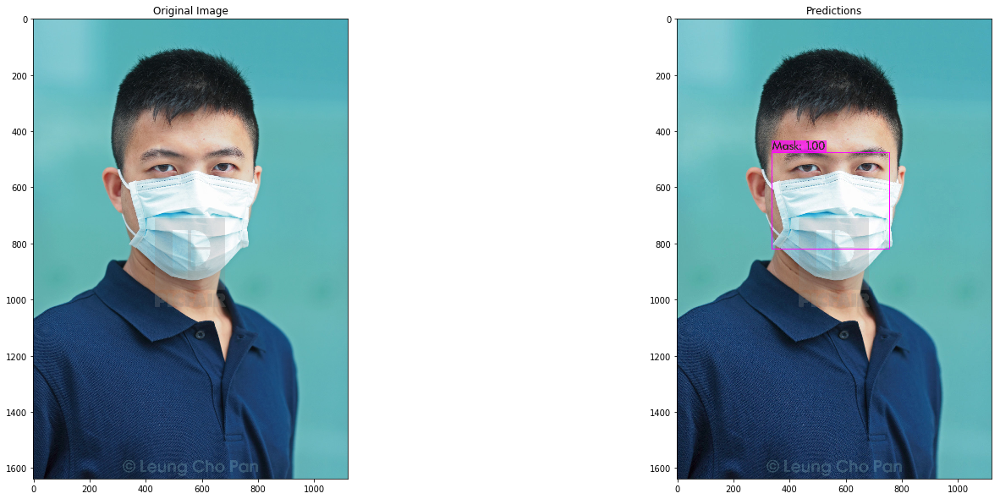

In [2]:
!./darknet detector test yolov3-mask-setup.data yolov3-mask-test.cfg backup/yolov3-mask-train_best_f1.weights test-image1.jpg -thresh .6 2> /dev/null
display_output("test-image1.jpg")

 CUDNN_HALF=1 
net.optimized_memory = 0 
mini_batch = 1, batch = 1, time_steps = 1, train = 0 

 seen 64, trained: 179 K-images (2 Kilo-batches_64) 
 Detection layer: 82 - type = 27 
 Detection layer: 94 - type = 27 
 Detection layer: 106 - type = 27 
test-image2.jpg: Predicted in 41.710000 milli-seconds.
Mask: 99%
Mask: 100%
Mask: 84%
No-mask: 100%
Mask: 94%


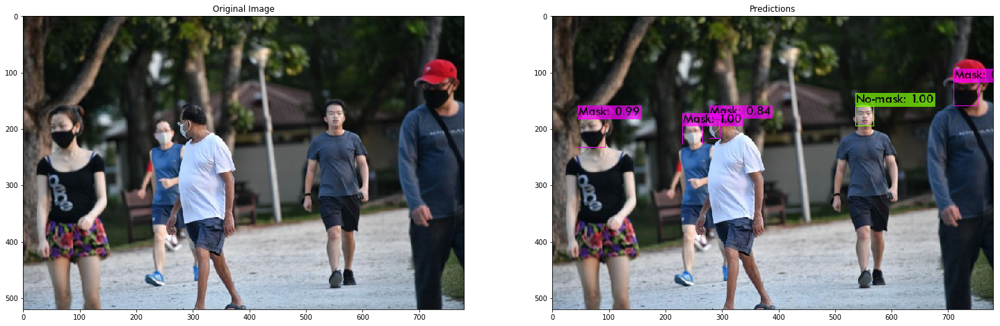

In [3]:
!./darknet detector test yolov3-mask-setup.data yolov3-mask-test.cfg backup/yolov3-mask-train_best.weights test-image2.jpg -thresh .6 2> /dev/null
display_output("test-image2.jpg")

 CUDNN_HALF=1 
net.optimized_memory = 0 
mini_batch = 1, batch = 1, time_steps = 1, train = 0 

 seen 64, trained: 179 K-images (2 Kilo-batches_64) 
 Detection layer: 82 - type = 27 
 Detection layer: 94 - type = 27 
 Detection layer: 106 - type = 27 
test-image3.jpg: Predicted in 41.313000 milli-seconds.
Mask: 87%
Mask: 100%
Mask: 100%
No-mask: 100%
Mask: 100%
No-mask: 90%
Mask: 99%
Mask: 98%
Mask: 99%
Mask: 99%
Mask: 100%
Mask: 99%
Mask: 100%
Mask: 100%
Mask: 99%
Mask: 100%
Mask: 98%
Mask: 99%
Mask: 100%


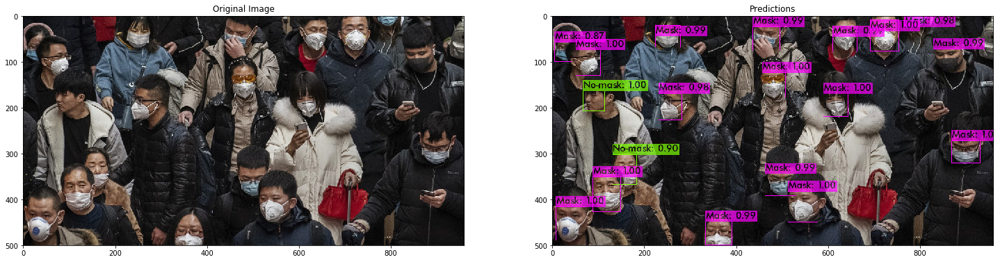

In [4]:
!./darknet detector test yolov3-mask-setup.data yolov3-mask-test.cfg backup/yolov3-mask-train_best.weights test-image3.jpg -thresh .6 2> /dev/null
display_output("test-image3.jpg")

 CUDNN_HALF=1 
net.optimized_memory = 0 
mini_batch = 1, batch = 1, time_steps = 1, train = 0 

 seen 64, trained: 179 K-images (2 Kilo-batches_64) 
 Detection layer: 82 - type = 27 
 Detection layer: 94 - type = 27 
 Detection layer: 106 - type = 27 
test-image4.jpg: Predicted in 43.363000 milli-seconds.
No-mask: 99%
No-mask: 87%
Mask: 100%
Mask: 100%
No-mask: 63%
Mask: 98%
No-mask: 100%
Mask: 100%


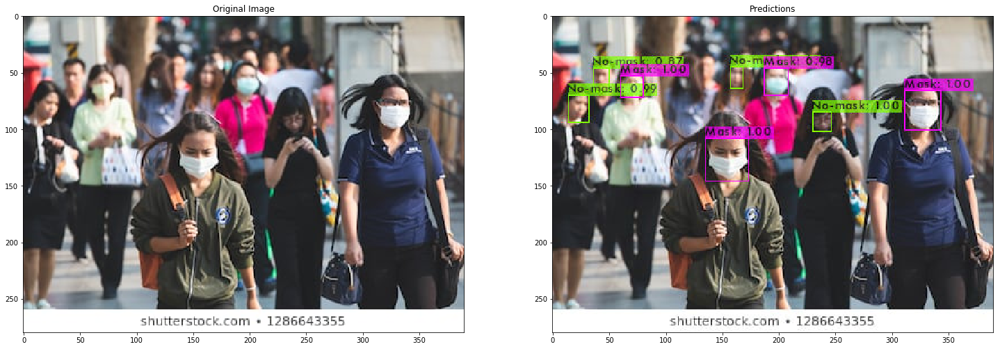

In [5]:
!./darknet detector test yolov3-mask-setup.data yolov3-mask-test.cfg backup/yolov3-mask-train_best.weights test-image4.jpg -thresh .6 2> /dev/null
display_output("test-image4.jpg")

In [6]:
!./darknet detector demo yolov3-mask-setup.data yolov3-mask-test.cfg backup/yolov3-mask-train_best.weights test-video1.mp4 -thresh .6 -out_filename out-vid1.avi

 CUDA-version: 10000 (11000), cuDNN: 7.6.4, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 4.2.0
Demo
 0 : compute_capability = 750, cudnn_half = 1, GPU: GeForce RTX 2070 SUPER 
net.optimized_memory = 0 
mini_batch = 1, batch = 1, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    832 x 832 x   3 ->  832 x 832 x  32 1.196 BF
   1 conv     64       3 x 3/ 2    832 x 832 x  32 ->  416 x 416 x  64 6.380 BF
   2 conv     32       1 x 1/ 1    416 x 416 x  64 ->  416 x 416 x  32 0.709 BF
   3 conv     64       3 x 3/ 1    416 x 416 x  32 ->  416 x 416 x  64 6.380 BF
   4 Shortcut Layer: 1,  wt = 0, wn = 0, outputs: 416 x 416 x  64 0.011 BF
   5 conv    128       3 x 3/ 2    416 x 416 x  64 ->  208 x 208 x 128 6.380 BF
   6 conv     64       1 x 1/ 1    208 x 208 x 128 ->  208 x 208 x  64 0.709 BF
   7 conv    128       3 x 3/ 1    208 x 208 x  64 ->  208 x 208 x 128 6.380 BF
   8 Shortcut Layer: 5,  

 101 conv    128       1 x 1/ 1    208 x 208 x 256 ->  208 x 208 x 128 2.835 BF
 102 conv    256       3 x 3/ 1    208 x 208 x 128 ->  208 x 208 x 256 25.518 BF
 103 conv    128       1 x 1/ 1    208 x 208 x 256 ->  208 x 208 x 128 2.835 BF
 104 conv    256       3 x 3/ 1    208 x 208 x 128 ->  208 x 208 x 256 25.518 BF
 105 conv     21       1 x 1/ 1    208 x 208 x 256 ->  208 x 208 x  21 0.465 BF
 106 yolo
[yolo] params: iou loss: mse (2), iou_norm: 0.75, cls_norm: 1.00, scale_x_y: 1.00
Total BFLOPS 325.036 
avg_outputs = 2533281 
 Allocate additional workspace_size = 67.53 MB 
Loading weights from backup/yolov3-mask-train_best.weights...
 seen 64, trained: 179 K-images (2 Kilo-batches_64) 
Done! Loaded 107 layers from weights-file 
video file: test-video1.mp4
Video stream: 1600 x 842 
Objects:


FPS:0.0 	 AVG_FPS:0.0
Objects:

No-mask: 100% 
No-mask: 100% 
No-mask: 100% 
No-mask: 99% 
No-mask: 95% 

FPS:2.1 	 AVG_FPS:0.0

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 100% 
No-mas

Objects:

No-mask: 94% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 94% 

FPS:22.7 	 AVG_FPS:0.0

 cvWriteFrame 
Objects:

No-mask: 94% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 85% 

FPS:22.8 	 AVG_FPS:0.0

 cvWriteFrame 
Objects:

No-mask: 93% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 78% 

FPS:22.8 	 AVG_FPS:0.0

 cvWriteFrame 
Objects:

No-mask: 94% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 78% 

FPS:22.7 	 AVG_FPS:0.0

 cvWriteFrame 
Objects:

No-mask: 93% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 76% 

FPS:22.6 	 AVG_FPS:0.0

 cvWriteFrame 
Objects:

No-mask: 93% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 65% 

FPS:22.7 	 AVG_FPS:22.7

 cvWriteFrame 
Objects:

No-mask: 93% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 62% 

FPS:22.7 	 AVG_FPS:22.7

 cvWriteFrame 
Objects:

No-mask: 94% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 63% 

FPS:22.6 	 AVG_FPS:22.7

 cvWriteFrame 
Objects:

No-mask: 91% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 70% 

FPS:22.6 	 AVG_FPS:22.7

 cvWriteFram


 cvWriteFrame 
Objects:

No-mask: 94% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 91% 

FPS:22.7 	 AVG_FPS:22.7

 cvWriteFrame 
Objects:

No-mask: 95% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 91% 

FPS:22.8 	 AVG_FPS:22.7

 cvWriteFrame 
Objects:

No-mask: 95% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 91% 

FPS:22.7 	 AVG_FPS:22.7

 cvWriteFrame 
Objects:

No-mask: 94% 
Mask: 100% 
Mask: 100% 
Mask: 99% 
Mask: 91% 

FPS:22.8 	 AVG_FPS:22.7

 cvWriteFrame 
Objects:

No-mask: 94% 
Mask: 100% 
Mask: 100% 
Mask: 99% 
Mask: 92% 

FPS:22.7 	 AVG_FPS:22.7

 cvWriteFrame 
Objects:

No-mask: 95% 
Mask: 100% 
Mask: 100% 
Mask: 98% 
Mask: 92% 

FPS:22.8 	 AVG_FPS:22.7

 cvWriteFrame 
Objects:

No-mask: 95% 
Mask: 100% 
Mask: 100% 
Mask: 98% 
Mask: 92% 

FPS:22.7 	 AVG_FPS:22.7

 cvWriteFrame 
Objects:

No-mask: 94% 
Mask: 100% 
Mask: 100% 
Mask: 98% 
Mask: 93% 

FPS:22.8 	 AVG_FPS:22.7

 cvWriteFrame 
Objects:

No-mask: 93% 
Mask: 100% 
Mask: 100% 
Mask: 98% 
Mask: 94% 

FPS:22.8 	 AVG_FPS:22.


 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 91% 
Mask: 100% 
Mask: 99% 
Mask: 95% 

FPS:22.7 	 AVG_FPS:22.7

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 92% 
Mask: 100% 
Mask: 99% 
Mask: 95% 

FPS:22.7 	 AVG_FPS:22.7

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 93% 
Mask: 100% 
Mask: 99% 
Mask: 94% 

FPS:22.7 	 AVG_FPS:22.7

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 93% 
Mask: 100% 
Mask: 99% 
Mask: 95% 

FPS:22.7 	 AVG_FPS:22.7

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 94% 
Mask: 100% 
Mask: 99% 
Mask: 95% 

FPS:22.7 	 AVG_FPS:22.7

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 94% 
Mask: 100% 
Mask: 99% 
Mask: 94% 

FPS:22.6 	 AVG_FPS:22.7

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 93% 
Mask: 100% 
Mask: 99% 
Mask: 93% 

FPS:22.7 	 AVG_FPS:22.7

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 92% 
Mask: 100% 
Mask: 99% 
Mask: 93% 

FPS:22.6 	 AVG_FPS:22.7

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 90% 
Mask: 100% 
Mask: 99% 
Mask: 93% 

Objects:

No-mask: 100% 
No-mask: 93% 
Mask: 100% 
Mask: 100% 
Mask: 96% 

FPS:22.6 	 AVG_FPS:22.7

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 92% 
Mask: 100% 
Mask: 100% 
Mask: 96% 

FPS:22.6 	 AVG_FPS:22.7

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 91% 
Mask: 100% 
Mask: 100% 
Mask: 96% 

FPS:22.6 	 AVG_FPS:22.7

 cvWriteFrame 
Objects:

No-mask: 92% 
Mask: 100% 
Mask: 100% 
Mask: 96% 
Mask: 92% 

FPS:22.6 	 AVG_FPS:22.7

 cvWriteFrame 
Objects:

No-mask: 92% 
Mask: 100% 
Mask: 100% 
Mask: 97% 
Mask: 91% 

FPS:22.7 	 AVG_FPS:22.7

 cvWriteFrame 
Objects:

No-mask: 93% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 97% 

FPS:22.7 	 AVG_FPS:22.7

 cvWriteFrame 
Objects:

No-mask: 93% 
Mask: 100% 
Mask: 100% 
Mask: 99% 
Mask: 97% 

FPS:22.8 	 AVG_FPS:22.7

 cvWriteFrame 
Objects:

No-mask: 93% 
Mask: 100% 
Mask: 100% 
Mask: 99% 
Mask: 96% 

FPS:22.7 	 AVG_FPS:22.7

 cvWriteFrame 
Objects:

No-mask: 93% 
Mask: 100% 
Mask: 100% 
Mask: 99% 
Mask: 95% 

FPS:22.7 	 AVG_FPS:22.7

 cvW

Objects:

No-mask: 91% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 94% 

FPS:22.9 	 AVG_FPS:22.7

 cvWriteFrame 
Objects:

No-mask: 91% 
Mask: 100% 
Mask: 100% 
Mask: 99% 
Mask: 94% 

FPS:22.8 	 AVG_FPS:22.7

 cvWriteFrame 
Objects:

No-mask: 92% 
Mask: 100% 
Mask: 100% 
Mask: 99% 
Mask: 94% 

FPS:22.9 	 AVG_FPS:22.7

 cvWriteFrame 
Objects:

No-mask: 94% 
Mask: 100% 
Mask: 100% 
Mask: 99% 
Mask: 94% 

FPS:22.8 	 AVG_FPS:22.7

 cvWriteFrame 
Objects:

No-mask: 94% 
Mask: 100% 
Mask: 100% 
Mask: 99% 
Mask: 94% 

FPS:22.8 	 AVG_FPS:22.7

 cvWriteFrame 
Objects:

No-mask: 94% 
Mask: 100% 
Mask: 100% 
Mask: 99% 
Mask: 94% 

FPS:22.8 	 AVG_FPS:22.7

 cvWriteFrame 
Objects:

No-mask: 94% 
Mask: 100% 
Mask: 100% 
Mask: 99% 
Mask: 94% 

FPS:22.8 	 AVG_FPS:22.7

 cvWriteFrame 
Objects:

No-mask: 94% 
Mask: 100% 
Mask: 100% 
Mask: 99% 
Mask: 94% 

FPS:22.9 	 AVG_FPS:22.7

 cvWriteFrame 
Objects:

No-mask: 94% 
Mask: 100% 
Mask: 100% 
Mask: 99% 
Mask: 94% 

FPS:22.8 	 AVG_FPS:22.7

 cvWriteFrame 



 cvWriteFrame 
Objects:

No-mask: 93% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 98% 

FPS:22.8 	 AVG_FPS:22.8

 cvWriteFrame 
Objects:

No-mask: 93% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 98% 

FPS:22.7 	 AVG_FPS:22.8

 cvWriteFrame 
Objects:

No-mask: 94% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 98% 

FPS:22.8 	 AVG_FPS:22.8

 cvWriteFrame 
Objects:

No-mask: 94% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 98% 

FPS:22.8 	 AVG_FPS:22.8

 cvWriteFrame 
Objects:

No-mask: 93% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 98% 

FPS:22.8 	 AVG_FPS:22.8

 cvWriteFrame 
Objects:

No-mask: 93% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 98% 

FPS:22.8 	 AVG_FPS:22.8

 cvWriteFrame 
Objects:

No-mask: 94% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 98% 

FPS:22.8 	 AVG_FPS:22.8

 cvWriteFrame 
Objects:

No-mask: 94% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 97% 

FPS:22.8 	 AVG_FPS:22.8

 cvWriteFrame 
Objects:

No-mask: 94% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 97% 

FPS:22.8 	 AVG_F

In [ ]:
!./darknet detector demo yolov3-mask-setup.data yolov3-mask-test.cfg backup/yolov3-mask-train_best.weights test-video2.mp4 -thresh .6 -out_filename out-vid2.avi

 CUDA-version: 10000 (11000), cuDNN: 7.6.4, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 4.2.0
Demo
 0 : compute_capability = 750, cudnn_half = 1, GPU: GeForce RTX 2070 SUPER 
net.optimized_memory = 0 
mini_batch = 1, batch = 1, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    832 x 832 x   3 ->  832 x 832 x  32 1.196 BF
   1 conv     64       3 x 3/ 2    832 x 832 x  32 ->  416 x 416 x  64 6.380 BF
   2 conv     32       1 x 1/ 1    416 x 416 x  64 ->  416 x 416 x  32 0.709 BF
   3 conv     64       3 x 3/ 1    416 x 416 x  32 ->  416 x 416 x  64 6.380 BF
   4 Shortcut Layer: 1,  wt = 0, wn = 0, outputs: 416 x 416 x  64 0.011 BF
   5 conv    128       3 x 3/ 2    416 x 416 x  64 ->  208 x 208 x 128 6.380 BF
   6 conv     64       1 x 1/ 1    208 x 208 x 128 ->  208 x 208 x  64 0.709 BF
   7 conv    128       3 x 3/ 1    208 x 208 x  64 ->  208 x 208 x 128 6.380 BF
   8 Shortcut Layer: 5,  

 100 conv    256       3 x 3/ 1    208 x 208 x 128 ->  208 x 208 x 256 25.518 BF
 101 conv    128       1 x 1/ 1    208 x 208 x 256 ->  208 x 208 x 128 2.835 BF
 102 conv    256       3 x 3/ 1    208 x 208 x 128 ->  208 x 208 x 256 25.518 BF
 103 conv    128       1 x 1/ 1    208 x 208 x 256 ->  208 x 208 x 128 2.835 BF
 104 conv    256       3 x 3/ 1    208 x 208 x 128 ->  208 x 208 x 256 25.518 BF
 105 conv     21       1 x 1/ 1    208 x 208 x 256 ->  208 x 208 x  21 0.465 BF
 106 yolo
[yolo] params: iou loss: mse (2), iou_norm: 0.75, cls_norm: 1.00, scale_x_y: 1.00
Total BFLOPS 325.036 
avg_outputs = 2533281 
 Allocate additional workspace_size = 67.53 MB 
Loading weights from backup/yolov3-mask-train_best.weights...
 seen 64, trained: 179 K-images (2 Kilo-batches_64) 
Done! Loaded 107 layers from weights-file 
video file: test-video2.mp4
Video stream: 1280 x 718 
Objects:


FPS:0.0 	 AVG_FPS:0.0
Objects:

No-mask: 99% 
No-mask: 84% 

FPS:2.1 	 AVG_FPS:0.0

 cvWriteFrame 
Objects:




 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 98% 
No-mask: 65% 
Mask: 61% 

FPS:22.9 	 AVG_FPS:22.8

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 98% 

FPS:22.9 	 AVG_FPS:22.8

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 98% 

FPS:22.9 	 AVG_FPS:22.8

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 99% 

FPS:22.9 	 AVG_FPS:22.8

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 95% 

FPS:23.0 	 AVG_FPS:22.8

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 94% 

FPS:23.0 	 AVG_FPS:22.8

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 95% 

FPS:23.0 	 AVG_FPS:22.8

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 99% 

FPS:23.0 	 AVG_FPS:22.8

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 84% 

FPS:23.0 	 AVG_FPS:22.8

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 77% 
Mask: 68% 

FPS:22.9 	 AVG_FPS:22.8

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 100% 

FPS:22.9 	 AVG_FPS:22.8

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 100% 
No-mask: 67% 

FPS:22.9 	 A

Objects:

No-mask: 99% 
No-mask: 66% 
Mask: 100% 
Mask: 100% 

FPS:23.0 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 86% 
No-mask: 85% 
No-mask: 68% 
Mask: 100% 
Mask: 95% 

FPS:22.9 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 90% 
Mask: 100% 
Mask: 82% 

FPS:22.9 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 90% 
Mask: 100% 
Mask: 77% 

FPS:22.9 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 96% 
Mask: 100% 

FPS:23.0 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 76% 
Mask: 100% 

FPS:22.9 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 71% 
Mask: 99% 

FPS:23.0 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 98% 
Mask: 100% 

FPS:22.9 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 99% 
Mask: 100% 

FPS:23.0 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 99% 
Mask: 100% 

FPS:22.9 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 97% 
No-mask: 61% 
Mask: 100% 

FPS:22.8 	 AVG_FPS:22.9

Objects:

No-mask: 100% 
No-mask: 99% 
No-mask: 98% 
No-mask: 97% 

FPS:22.9 	 AVG_FPS:22.8

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 99% 
No-mask: 99% 
Mask: 80% 

FPS:22.8 	 AVG_FPS:22.8

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 99% 
No-mask: 99% 
Mask: 94% 
Mask: 80% 

FPS:23.0 	 AVG_FPS:22.8

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 100% 
No-mask: 98% 
Mask: 95% 
Mask: 81% 

FPS:22.9 	 AVG_FPS:22.8

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 100% 
No-mask: 99% 
Mask: 98% 
Mask: 82% 

FPS:23.0 	 AVG_FPS:22.8

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 100% 
No-mask: 94% 
Mask: 85% 
Mask: 74% 

FPS:22.9 	 AVG_FPS:22.8

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 100% 
Mask: 95% 

FPS:23.0 	 AVG_FPS:22.8

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 100% 
No-mask: 61% 
Mask: 93% 
Mask: 81% 

FPS:23.0 	 AVG_FPS:22.8

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 100% 
No-mask: 85% 
No-mask: 79% 
Mask: 80% 

FPS:23.1 	 AVG_FPS:22.8

 cvWri

Objects:

No-mask: 98% 
No-mask: 78% 
Mask: 100% 

FPS:23.1 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 97% 
No-mask: 79% 
Mask: 100% 

FPS:23.0 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 98% 
No-mask: 86% 
Mask: 100% 

FPS:23.1 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 98% 
No-mask: 75% 
No-mask: 62% 
Mask: 100% 

FPS:23.0 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 95% 
No-mask: 78% 
No-mask: 71% 
Mask: 100% 

FPS:23.1 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 98% 
No-mask: 77% 
No-mask: 75% 
Mask: 99% 

FPS:23.0 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 100% 
No-mask: 75% 
No-mask: 69% 
Mask: 99% 

FPS:23.1 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 99% 
No-mask: 81% 
No-mask: 67% 
Mask: 100% 

FPS:23.1 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 100% 
No-mask: 85% 
No-mask: 66% 
Mask: 100% 

FPS:23.1 	 AVG_FPS:2


 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 99% 
No-mask: 96% 
No-mask: 80% 

FPS:22.8 	 AVG_FPS:23.0

 cvWriteFrame 
Objects:

No-mask: 98% 
No-mask: 96% 
No-mask: 95% 
No-mask: 93% 
No-mask: 91% 

FPS:22.8 	 AVG_FPS:23.0

 cvWriteFrame 
Objects:

No-mask: 98% 
No-mask: 96% 
No-mask: 96% 
No-mask: 96% 
No-mask: 94% 

FPS:22.9 	 AVG_FPS:23.0

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 98% 
No-mask: 89% 
No-mask: 84% 
No-mask: 75% 

FPS:22.9 	 AVG_FPS:23.0

 cvWriteFrame 
Objects:

No-mask: 97% 
No-mask: 96% 
No-mask: 96% 
No-mask: 79% 

FPS:22.8 	 AVG_FPS:23.0

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 98% 
No-mask: 79% 
No-mask: 78% 

FPS:22.9 	 AVG_FPS:23.0

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 98% 
No-mask: 97% 
No-mask: 62% 

FPS:23.0 	 AVG_FPS:23.0

 cvWriteFrame 
Objects:

No-mask: 96% 
No-mask: 93% 
No-mask: 86% 
No-mask: 85% 
No-mask: 60% 
No-mask: 60% 

FPS:22.9 	 AVG_FPS:23.0

 cvWriteFrame 
Objects:

No-mask: 92% 
No-mask: 91% 
No-mask: 88% 
No-ma

Objects:

No-mask: 100% 
No-mask: 100% 
No-mask: 97% 
Mask: 99% 

FPS:23.1 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 100% 
No-mask: 97% 
Mask: 99% 

FPS:23.0 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 100% 
No-mask: 94% 
Mask: 99% 

FPS:23.0 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 100% 
No-mask: 88% 
Mask: 98% 

FPS:23.0 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 99% 
No-mask: 77% 
Mask: 99% 
Mask: 99% 

FPS:22.9 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 97% 
No-mask: 97% 
No-mask: 72% 
No-mask: 63% 
Mask: 99% 
Mask: 99% 

FPS:22.9 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 99% 
No-mask: 97% 
No-mask: 84% 
Mask: 98% 
Mask: 97% 

FPS:22.9 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 99% 
No-mask: 96% 
No-mask: 79% 
Mask: 97% 
Mask: 96% 

FPS:22.9 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 100% 
No-mask: 98% 
No-

Objects:

No-mask: 98% 
No-mask: 67% 
Mask: 100% 
Mask: 87% 

FPS:22.8 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 98% 
No-mask: 66% 
Mask: 100% 
Mask: 89% 

FPS:22.8 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 98% 
No-mask: 65% 
No-mask: 62% 
Mask: 100% 
Mask: 79% 

FPS:22.8 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 88% 
No-mask: 61% 
Mask: 100% 
Mask: 92% 

FPS:22.8 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 98% 
No-mask: 85% 
No-mask: 84% 
No-mask: 64% 
Mask: 100% 
Mask: 61% 

FPS:22.9 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 95% 
No-mask: 88% 
No-mask: 81% 
No-mask: 80% 
Mask: 100% 

FPS:22.8 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 95% 
No-mask: 89% 
Mask: 100% 
Mask: 97% 

FPS:22.9 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 95% 
No-mask: 88% 
Mask: 100% 
Mask: 96% 

FPS:22.9 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 97% 
No-mask: 94% 
Mask: 99% 
Mask: 90% 

FPS:22.9 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:


Objects:

No-mask: 99% 
No-mask: 96% 
No-mask: 90% 

FPS:22.9 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 98% 
No-mask: 89% 

FPS:23.0 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 95% 
No-mask: 91% 

FPS:22.9 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 97% 
No-mask: 97% 
No-mask: 88% 

FPS:22.8 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 99% 
No-mask: 96% 
No-mask: 86% 
No-mask: 78% 

FPS:22.9 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 99% 
No-mask: 97% 
No-mask: 95% 
No-mask: 94% 
No-mask: 77% 

FPS:22.8 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 99% 
No-mask: 96% 
No-mask: 96% 
No-mask: 63% 

FPS:22.9 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 98% 
No-mask: 97% 
No-mask: 96% 
No-mask: 84% 

FPS:22.9 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 98% 
No-mask: 97% 
No-mask: 94% 
No-mask: 90% 

FPS:22.9 	 AVG_FPS:22.9

 cvWriteF

Objects:

No-mask: 100% 
No-mask: 93% 
Mask: 100% 

FPS:22.9 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 96% 
Mask: 100% 

FPS:22.8 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 95% 
Mask: 100% 

FPS:22.8 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 96% 
Mask: 100% 

FPS:22.7 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 83% 
Mask: 100% 

FPS:22.7 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 100% 
Mask: 100% 

FPS:22.8 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 99% 
Mask: 100% 

FPS:22.8 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 100% 
Mask: 100% 

FPS:22.9 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 100% 
Mask: 100% 
Mask: 81% 

FPS:22.9 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 100% 
Mask: 100% 
Mask: 82% 

FPS:22.9 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 99% 
Mask: 100% 
Mask: 85% 

FPS:22.9 	

Objects:

No-mask: 100% 
No-mask: 99% 
No-mask: 98% 
Mask: 98% 

FPS:23.0 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 100% 
No-mask: 80% 
Mask: 99% 

FPS:22.9 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 100% 
No-mask: 80% 
Mask: 99% 

FPS:22.9 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 99% 
No-mask: 98% 
No-mask: 63% 
Mask: 99% 

FPS:22.9 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 99% 
No-mask: 98% 
No-mask: 77% 
No-mask: 76% 
Mask: 100% 

FPS:22.8 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 98% 
No-mask: 86% 
Mask: 100% 

FPS:22.7 	 AVG_FPS:22.8

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 98% 
No-mask: 82% 
Mask: 100% 

FPS:22.8 	 AVG_FPS:22.8

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 98% 
No-mask: 96% 
No-mask: 78% 
Mask: 100% 

FPS:22.8 	 AVG_FPS:22.8

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 99% 
No-mask: 97% 
No-mask: 79% 
Mask: 100% 

FPS:22.6 	 AVG_FPS:2


 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 99% 
No-mask: 91% 
No-mask: 84% 
No-mask: 82% 
No-mask: 77% 
No-mask: 67% 

FPS:22.8 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 99% 
No-mask: 98% 
No-mask: 96% 
No-mask: 66% 
No-mask: 65% 

FPS:22.8 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 100% 
No-mask: 98% 
No-mask: 96% 
No-mask: 93% 

FPS:22.7 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 99% 
No-mask: 77% 
No-mask: 74% 
No-mask: 62% 

FPS:22.7 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 100% 
No-mask: 93% 

FPS:22.7 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 100% 
No-mask: 94% 
No-mask: 78% 
No-mask: 71% 

FPS:22.7 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 100% 
No-mask: 95% 
No-mask: 75% 

FPS:22.8 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 99% 
No-mask: 98% 
No-mask: 90% 
No-mask: 66% 

FPS:22.7 	 AVG_FPS:22.9

 cvWriteFrame 
Objec

Objects:

No-mask: 100% 
No-mask: 94% 
No-mask: 91% 
No-mask: 90% 
Mask: 100% 

FPS:22.9 	 AVG_FPS:22.8

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 96% 
No-mask: 96% 
No-mask: 95% 
Mask: 100% 

FPS:22.8 	 AVG_FPS:22.8

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 99% 
No-mask: 93% 
Mask: 100% 

FPS:22.9 	 AVG_FPS:22.8

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 99% 
No-mask: 95% 
Mask: 100% 

FPS:22.8 	 AVG_FPS:22.8

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 99% 
No-mask: 88% 
Mask: 100% 

FPS:22.9 	 AVG_FPS:22.8

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 99% 
No-mask: 95% 
No-mask: 91% 
Mask: 100% 

FPS:22.8 	 AVG_FPS:22.8

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 98% 
No-mask: 96% 
No-mask: 63% 
Mask: 100% 

FPS:22.8 	 AVG_FPS:22.8

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 99% 
No-mask: 98% 
No-mask: 97% 
Mask: 100% 

FPS:22.9 	 AVG_FPS:22.8

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 99% 
No-mask: 87% 
No-mask: 60% 
Mask: 100% 

FPS

Objects:

No-mask: 100% 
No-mask: 100% 
No-mask: 99% 
Mask: 99% 

FPS:23.0 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 98% 
No-mask: 93% 
Mask: 91% 

FPS:23.0 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 98% 
No-mask: 94% 
Mask: 92% 

FPS:23.0 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 98% 
No-mask: 92% 
No-mask: 76% 
Mask: 92% 

FPS:22.9 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 88% 
Mask: 98% 
Mask: 95% 

FPS:22.8 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 90% 
No-mask: 89% 
Mask: 99% 

FPS:22.8 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 96% 
No-mask: 96% 
Mask: 99% 

FPS:22.8 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 98% 
No-mask: 95% 
No-mask: 89% 
Mask: 98% 
Mask: 83% 

FPS:22.9 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 98% 
No-mask: 97% 
No-mask: 96% 
Mask: 97% 
Mask: 85% 

FPS:22.8 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 97% 
No-mask: 97% 
No-mask: 95% 
No-mask: 75% 
No

Objects:

No-mask: 100% 
No-mask: 96% 
No-mask: 83% 
No-mask: 74% 
Mask: 100% 

FPS:22.8 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 96% 
No-mask: 92% 
Mask: 100% 

FPS:22.8 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 97% 
No-mask: 95% 
No-mask: 81% 
No-mask: 70% 
Mask: 100% 

FPS:22.8 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 99% 
No-mask: 99% 
No-mask: 85% 
No-mask: 70% 
Mask: 99% 

FPS:22.8 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 99% 
No-mask: 98% 
No-mask: 70% 
No-mask: 60% 

FPS:22.8 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 99% 
No-mask: 88% 
No-mask: 75% 
No-mask: 73% 
Mask: 75% 

FPS:22.8 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 98% 
No-mask: 93% 
No-mask: 80% 
No-mask: 75% 
Mask: 76% 

FPS:22.8 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 98% 
No-mask: 92% 

FPS:22.8 	 AVG_FPS:22.9

 cvWriteFrame 
Objects:

No-mask: 100% 
N

# <font style="color:blue">Training Configuration for YOLO4</font>
Training had been on my local machine
GPU : RTX 2070 Super (8GB)


File 1: yolov4-mask-setup.data

The contents of the file are as follows:
```
classes = 1
train  = data_train_mask.txt
valid  = data_test_mask.txt
names = class.names
backup = backup/
```

File 2: yolov4-mask-train.cfg

Values changed from default values are mentioned below
```
batch = 64
subdivision = 64     //To accommodate memory for large network size

width= 608
height= 608

burn_in= 400
max_batches = 4000

steps = 3200, 3600
scales = .1, .1

classes = 2 in all 3 [yolo] layers

filter = 21 in [convolution] layers before 3 [yolo] layers | (2 + 5) * 3 =====> (classes + 5) * no of masks


Changed below parameters for another run. But didn't yield better results 

//layers = 23 in line 895

//stride = 4 in line 892
//stride = 4 in line 989
```




In [1]:
!./darknet detector train yolov4-mask-setup.data yolov4-mask-train.cfg ./yolov4.conv.137 -dont_show -map 2> train_log_yolov4.txt

 CUDNN_HALF=1 
 Prepare additional network for mAP calculation...
net.optimized_memory = 0 
mini_batch = 1, batch = 64, time_steps = 1, train = 0 
nms_kind: greedynms (1), beta = 0.600000 
nms_kind: greedynms (1), beta = 0.600000 
nms_kind: greedynms (1), beta = 0.600000 
yolov4-mask-train
net.optimized_memory = 0 
mini_batch = 1, batch = 64, time_steps = 1, train = 1 
nms_kind: greedynms (1), beta = 0.600000 
nms_kind: greedynms (1), beta = 0.600000 
nms_kind: greedynms (1), beta = 0.600000 

 seen 64, trained: 0 K-images (0 Kilo-batches_64) 
Learning Rate: 0.0013, Momentum: 0.949, Decay: 0.0005
 Detection layer: 139 - type = 27 
 Detection layer: 150 - type = 27 
 Detection layer: 161 - type = 27 
Resizing, random_coef = 1.40 

 896 x 896 
 try to allocate additional workspace_size = 129.67 MB 
 CUDA allocate done! 
Loaded: 0.000023 seconds

 (next mAP calculation at 400 iterations) 
 1: 14581.520508, 14581.520508 avg loss, 0.000000 rate, 19.748344 seconds, 64 images, -1.000000 hours


 (next mAP calculation at 400 iterations) 
 40: 2322.860107, 5086.613770 avg loss, 0.000000 rate, 8.276187 seconds, 2560 images, 19.141103 hours left
Resizing, random_coef = 1.40 

 640 x 640 
 try to allocate additional workspace_size = 66.17 MB 
 CUDA allocate done! 
Loaded: 0.000034 seconds

 (next mAP calculation at 400 iterations) 
 41: 2850.772461, 4863.029785 avg loss, 0.000000 rate, 10.872398 seconds, 2624 images, 19.040731 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 400 iterations) 
 42: 2489.914551, 4625.718262 avg loss, 0.000000 rate, 10.903979 seconds, 2688 images, 18.969890 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 400 iterations) 
 43: 2138.362549, 4376.982910 avg loss, 0.000000 rate, 11.001821 seconds, 2752 images, 18.900075 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 400 iterations) 
 44: 1802.233276, 4119.507812 avg loss, 0.000000 rate, 10.693259 seconds, 2816 images, 18.832002 hours left
Loaded: 0.000028 seco


 (next mAP calculation at 400 iterations) 
 83: 14.008922, 94.843697 avg loss, 0.000002 rate, 11.722755 seconds, 5312 images, 16.619370 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 400 iterations) 
 84: 10.974670, 86.456795 avg loss, 0.000003 rate, 11.474903 seconds, 5376 images, 16.580727 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 400 iterations) 
 85: 14.559703, 79.267082 avg loss, 0.000003 rate, 11.779190 seconds, 5440 images, 16.539741 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 400 iterations) 
 86: 13.826248, 72.723000 avg loss, 0.000003 rate, 11.771362 seconds, 5504 images, 16.502443 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 400 iterations) 
 87: 9.248683, 66.375565 avg loss, 0.000003 rate, 11.441399 seconds, 5568 images, 16.465400 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 400 iterations) 
 88: 10.316002, 60.769608 avg loss, 0.000003 rate, 11.367973 seconds, 5632 images, 16.425108


 (next mAP calculation at 400 iterations) 
 127: 10.756241, 13.453615 avg loss, 0.000013 rate, 6.360093 seconds, 8128 images, 15.164642 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 400 iterations) 
 128: 13.817173, 13.489971 avg loss, 0.000014 rate, 6.508815 seconds, 8192 images, 15.081420 hours left
Loaded: 0.000045 seconds

 (next mAP calculation at 400 iterations) 
 129: 10.612524, 13.202227 avg loss, 0.000014 rate, 6.425943 seconds, 8256 images, 15.000612 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 400 iterations) 
 130: 13.414068, 13.223411 avg loss, 0.000015 rate, 6.602143 seconds, 8320 images, 14.919703 hours left
Resizing, random_coef = 1.40 

 800 x 800 
 try to allocate additional workspace_size = 103.38 MB 
 CUDA allocate done! 
Loaded: 0.000023 seconds

 (next mAP calculation at 400 iterations) 
 131: 11.082307, 13.009300 avg loss, 0.000015 rate, 16.305190 seconds, 8384 images, 14.841479 hours left
Loaded: 0.000020 seconds

 (next mAP c

 try to allocate additional workspace_size = 53.60 MB 
 CUDA allocate done! 
Loaded: 0.553085 seconds - performance bottleneck on CPU or Disk HDD/SSD

 (next mAP calculation at 400 iterations) 
 171: 13.635367, 13.400644 avg loss, 0.000043 rate, 9.709283 seconds, 10944 images, 14.768922 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 400 iterations) 
 172: 12.540765, 13.314656 avg loss, 0.000044 rate, 9.619992 seconds, 11008 images, 14.730385 hours left
Loaded: 0.000019 seconds

 (next mAP calculation at 400 iterations) 
 173: 8.939525, 12.877143 avg loss, 0.000045 rate, 9.286490 seconds, 11072 images, 14.685374 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 400 iterations) 
 174: 11.705783, 12.760007 avg loss, 0.000047 rate, 9.401103 seconds, 11136 images, 14.637241 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 400 iterations) 
 175: 12.831125, 12.767118 avg loss, 0.000048 rate, 9.349897 seconds, 11200 images, 14.590782 hours left
Loaded


 (next mAP calculation at 400 iterations) 
 214: 13.724871, 11.758744 avg loss, 0.000107 rate, 15.328483 seconds, 13696 images, 13.866790 hours left
Loaded: 0.000025 seconds

 (next mAP calculation at 400 iterations) 
 215: 12.878050, 11.870675 avg loss, 0.000109 rate, 15.304404 seconds, 13760 images, 13.889327 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 400 iterations) 
 216: 13.527512, 12.036359 avg loss, 0.000111 rate, 16.276454 seconds, 13824 images, 13.911343 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 400 iterations) 
 217: 8.780775, 11.710800 avg loss, 0.000113 rate, 15.010653 seconds, 13888 images, 13.943313 hours left
Loaded: 0.000025 seconds

 (next mAP calculation at 400 iterations) 
 218: 13.286632, 11.868383 avg loss, 0.000115 rate, 15.297767 seconds, 13952 images, 13.961617 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 400 iterations) 
 219: 10.827332, 11.764278 avg loss, 0.000117 rate, 15.081321 seconds, 14016 image


 (next mAP calculation at 400 iterations) 
 258: 8.553036, 9.733684 avg loss, 0.000225 rate, 7.111350 seconds, 16512 images, 12.165304 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 400 iterations) 
 259: 10.232650, 9.783580 avg loss, 0.000229 rate, 7.265718 seconds, 16576 images, 12.117569 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 400 iterations) 
 260: 10.238482, 9.829070 avg loss, 0.000232 rate, 7.351823 seconds, 16640 images, 12.071897 hours left
Resizing, random_coef = 1.40 

 576 x 576 
 try to allocate additional workspace_size = 53.60 MB 
 CUDA allocate done! 
Loaded: 0.205456 seconds - performance bottleneck on CPU or Disk HDD/SSD

 (next mAP calculation at 400 iterations) 
 261: 11.883229, 10.034486 avg loss, 0.000236 rate, 9.510388 seconds, 16704 images, 12.027556 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 400 iterations) 
 262: 11.280249, 10.159062 avg loss, 0.000239 rate, 9.166994 seconds, 16768 images, 12.008190 ho


 (next mAP calculation at 400 iterations) 
 301: 9.429329, 9.066551 avg loss, 0.000417 rate, 12.497900 seconds, 19264 images, 11.645247 hours left
Loaded: 0.000025 seconds

 (next mAP calculation at 400 iterations) 
 302: 8.098048, 8.969701 avg loss, 0.000422 rate, 12.434804 seconds, 19328 images, 11.661912 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 400 iterations) 
 303: 7.689410, 8.841672 avg loss, 0.000428 rate, 12.567939 seconds, 19392 images, 11.673026 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 400 iterations) 
 304: 11.008193, 9.058324 avg loss, 0.000434 rate, 12.795838 seconds, 19456 images, 11.685362 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 400 iterations) 
 305: 7.964454, 8.948936 avg loss, 0.000439 rate, 12.421448 seconds, 19520 images, 11.699880 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 400 iterations) 
 306: 6.750042, 8.729047 avg loss, 0.000445 rate, 12.261008 seconds, 19584 images, 11.7103


 (next mAP calculation at 400 iterations) 
 346: 5.860068, 7.827287 avg loss, 0.000728 rate, 8.953224 seconds, 22144 images, 12.078673 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 400 iterations) 
 347: 5.537387, 7.598297 avg loss, 0.000736 rate, 8.941763 seconds, 22208 images, 12.048761 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 400 iterations) 
 348: 6.739195, 7.512387 avg loss, 0.000745 rate, 9.022334 seconds, 22272 images, 12.019008 hours left
Loaded: 0.000023 seconds

 (next mAP calculation at 400 iterations) 
 349: 7.596397, 7.520788 avg loss, 0.000753 rate, 9.210932 seconds, 22336 images, 11.990345 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 400 iterations) 
 350: 8.902016, 7.658911 avg loss, 0.000762 rate, 9.258532 seconds, 22400 images, 11.963856 hours left
Resizing, random_coef = 1.40 

 672 x 672 
 try to allocate additional workspace_size = 72.95 MB 
 CUDA allocate done! 
Loaded: 0.000021 seconds

 (next mAP calculat

 try to allocate additional workspace_size = 66.17 MB 
 CUDA allocate done! 
Loaded: 0.518860 seconds - performance bottleneck on CPU or Disk HDD/SSD

 (next mAP calculation at 400 iterations) 
 391: 7.633777, 7.454135 avg loss, 0.001187 rate, 10.823560 seconds, 25024 images, 11.474721 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 400 iterations) 
 392: 7.176373, 7.426359 avg loss, 0.001199 rate, 10.886282 seconds, 25088 images, 11.473682 hours left
Loaded: 0.000037 seconds

 (next mAP calculation at 400 iterations) 
 393: 6.769548, 7.360678 avg loss, 0.001211 rate, 10.989787 seconds, 25152 images, 11.468050 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 400 iterations) 
 394: 9.374233, 7.562033 avg loss, 0.001224 rate, 10.986913 seconds, 25216 images, 11.463482 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 400 iterations) 
 395: 6.079628, 7.413793 avg loss, 0.001236 rate, 10.782571 seconds, 25280 images, 11.458900 hours left
Loaded: 0.


 (next mAP calculation at 500 iterations) 
 Last accuracy mAP@0.5 = 70.46 %, best = 70.46 % 
 424: 8.132933, 6.792431 avg loss, 0.001300 rate, 11.727853 seconds, 27136 images, 10.835158 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 500 iterations) 
 Last accuracy mAP@0.5 = 70.46 %, best = 70.46 % 
 425: 6.499192, 6.763107 avg loss, 0.001300 rate, 11.607336 seconds, 27200 images, 10.843304 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 500 iterations) 
 Last accuracy mAP@0.5 = 70.46 %, best = 70.46 % 
 426: 6.028708, 6.689667 avg loss, 0.001300 rate, 11.607339 seconds, 27264 images, 10.850138 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 500 iterations) 
 Last accuracy mAP@0.5 = 70.46 %, best = 70.46 % 
 427: 6.111221, 6.631822 avg loss, 0.001300 rate, 11.633592 seconds, 27328 images, 10.856872 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 500 iterations) 
 Last accuracy mAP@0.5 = 70.46 %, best = 70.46 % 
 428: 6.583714


 (next mAP calculation at 500 iterations) 
 Last accuracy mAP@0.5 = 70.46 %, best = 70.46 % 
 459: 6.131001, 6.866954 avg loss, 0.001300 rate, 17.468027 seconds, 29376 images, 11.082317 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 500 iterations) 
 Last accuracy mAP@0.5 = 70.46 %, best = 70.46 % 
 460: 7.048459, 6.885104 avg loss, 0.001300 rate, 17.598599 seconds, 29440 images, 11.143312 hours left
Resizing, random_coef = 1.40 

 864 x 864 
 try to allocate additional workspace_size = 120.58 MB 
 CUDA allocate done! 
Loaded: 0.689350 seconds - performance bottleneck on CPU or Disk HDD/SSD

 (next mAP calculation at 500 iterations) 
 Last accuracy mAP@0.5 = 70.46 %, best = 70.46 % 
 461: 6.682361, 6.864830 avg loss, 0.001300 rate, 18.567529 seconds, 29504 images, 11.204932 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 500 iterations) 
 Last accuracy mAP@0.5 = 70.46 %, best = 70.46 % 
 462: 6.991196, 6.877467 avg loss, 0.001300 rate, 18.610913 seconds,


 (next mAP calculation at 500 iterations) 
 Last accuracy mAP@0.5 = 70.46 %, best = 70.46 % 
 494: 11.632537, 6.492328 avg loss, 0.001300 rate, 12.678808 seconds, 31616 images, 11.140100 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 500 iterations) 
 Last accuracy mAP@0.5 = 70.46 %, best = 70.46 % 
 495: 6.590610, 6.502156 avg loss, 0.001300 rate, 11.754982 seconds, 31680 images, 11.152177 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 500 iterations) 
 Last accuracy mAP@0.5 = 70.46 %, best = 70.46 % 
 496: 6.427045, 6.494645 avg loss, 0.001300 rate, 11.775170 seconds, 31744 images, 11.155103 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 500 iterations) 
 Last accuracy mAP@0.5 = 70.46 %, best = 70.46 % 
 497: 5.402431, 6.385424 avg loss, 0.001300 rate, 11.698323 seconds, 31808 images, 11.158164 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 500 iterations) 
 Last accuracy mAP@0.5 = 70.46 %, best = 70.46 % 
 498: 6.65358


 (next mAP calculation at 600 iterations) 
 Last accuracy mAP@0.5 = 84.01 %, best = 84.01 % 
 525: 4.742355, 5.476227 avg loss, 0.001300 rate, 8.222512 seconds, 33600 images, 10.961277 hours left
Loaded: 0.000032 seconds

 (next mAP calculation at 600 iterations) 
 Last accuracy mAP@0.5 = 84.01 %, best = 84.01 % 
 526: 5.130715, 5.441676 avg loss, 0.001300 rate, 8.271321 seconds, 33664 images, 10.931034 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 600 iterations) 
 Last accuracy mAP@0.5 = 84.01 %, best = 84.01 % 
 527: 5.942404, 5.491748 avg loss, 0.001300 rate, 8.555861 seconds, 33728 images, 10.901542 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 600 iterations) 
 Last accuracy mAP@0.5 = 84.01 %, best = 84.01 % 
 528: 6.668266, 5.609400 avg loss, 0.001300 rate, 8.553249 seconds, 33792 images, 10.875068 hours left
Loaded: 0.000016 seconds

 (next mAP calculation at 600 iterations) 
 Last accuracy mAP@0.5 = 84.01 %, best = 84.01 % 
 529: 5.219074, 5.


 (next mAP calculation at 600 iterations) 
 Last accuracy mAP@0.5 = 84.01 %, best = 84.01 % 
 560: 5.485781, 5.572654 avg loss, 0.001300 rate, 9.204814 seconds, 35840 images, 10.590530 hours left
Resizing, random_coef = 1.40 

 864 x 864 
 try to allocate additional workspace_size = 120.58 MB 
 CUDA allocate done! 
Loaded: 0.000024 seconds

 (next mAP calculation at 600 iterations) 
 Last accuracy mAP@0.5 = 84.01 %, best = 84.01 % 
 561: 8.223723, 5.837761 avg loss, 0.001300 rate, 19.246268 seconds, 35904 images, 10.572582 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 600 iterations) 
 Last accuracy mAP@0.5 = 84.01 %, best = 84.01 % 
 562: 5.849855, 5.838971 avg loss, 0.001300 rate, 18.924911 seconds, 35968 images, 10.650712 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 600 iterations) 
 Last accuracy mAP@0.5 = 84.01 %, best = 84.01 % 
 563: 6.608407, 5.915915 avg loss, 0.001300 rate, 18.699729 seconds, 36032 images, 10.724938 hours left
Loaded: 0.000


 (next mAP calculation at 600 iterations) 
 Last accuracy mAP@0.5 = 84.01 %, best = 84.01 % 
 594: 5.116809, 5.867180 avg loss, 0.001300 rate, 9.844385 seconds, 38016 images, 12.221234 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 600 iterations) 
 Last accuracy mAP@0.5 = 84.01 %, best = 84.01 % 
 595: 5.180959, 5.798558 avg loss, 0.001300 rate, 9.783619 seconds, 38080 images, 12.192161 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 600 iterations) 
 Last accuracy mAP@0.5 = 84.01 %, best = 84.01 % 
 596: 5.785341, 5.797236 avg loss, 0.001300 rate, 9.868439 seconds, 38144 images, 12.162776 hours left
Loaded: 0.000025 seconds

 (next mAP calculation at 600 iterations) 
 Last accuracy mAP@0.5 = 84.01 %, best = 84.01 % 
 597: 6.150967, 5.832609 avg loss, 0.001300 rate, 10.116344 seconds, 38208 images, 12.134460 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 600 iterations) 
 Last accuracy mAP@0.5 = 84.01 %, best = 84.01 % 
 598: 4.042559, 5


 (next mAP calculation at 700 iterations) 
 Last accuracy mAP@0.5 = 84.97 %, best = 84.97 % 
 625: 4.888064, 5.544379 avg loss, 0.001300 rate, 11.589229 seconds, 40000 images, 11.931401 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 700 iterations) 
 Last accuracy mAP@0.5 = 84.97 %, best = 84.97 % 
 626: 5.117739, 5.501715 avg loss, 0.001300 rate, 11.696749 seconds, 40064 images, 11.920736 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 700 iterations) 
 Last accuracy mAP@0.5 = 84.97 %, best = 84.97 % 
 627: 6.201512, 5.571694 avg loss, 0.001300 rate, 11.822062 seconds, 40128 images, 11.911154 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 700 iterations) 
 Last accuracy mAP@0.5 = 84.97 %, best = 84.97 % 
 628: 5.308321, 5.545357 avg loss, 0.001300 rate, 11.628723 seconds, 40192 images, 11.902809 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 700 iterations) 
 Last accuracy mAP@0.5 = 84.97 %, best = 84.97 % 
 629: 5.428609


 (next mAP calculation at 700 iterations) 
 Last accuracy mAP@0.5 = 84.97 %, best = 84.97 % 
 660: 4.649571, 5.321939 avg loss, 0.001300 rate, 9.914750 seconds, 42240 images, 12.214787 hours left
Resizing, random_coef = 1.40 

 800 x 800 
 try to allocate additional workspace_size = 103.38 MB 
 CUDA allocate done! 
Loaded: 0.208008 seconds - performance bottleneck on CPU or Disk HDD/SSD

 (next mAP calculation at 700 iterations) 
 Last accuracy mAP@0.5 = 84.97 %, best = 84.97 % 
 661: 5.892704, 5.379016 avg loss, 0.001300 rate, 16.332706 seconds, 42304 images, 12.184626 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 700 iterations) 
 Last accuracy mAP@0.5 = 84.97 %, best = 84.97 % 
 662: 3.980387, 5.239153 avg loss, 0.001300 rate, 16.012359 seconds, 42368 images, 12.216195 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 700 iterations) 
 Last accuracy mAP@0.5 = 84.97 %, best = 84.97 % 
 663: 5.749163, 5.290154 avg loss, 0.001300 rate, 16.494834 seconds, 


 (next mAP calculation at 700 iterations) 
 Last accuracy mAP@0.5 = 84.97 %, best = 84.97 % 
 694: 4.474387, 5.488609 avg loss, 0.001300 rate, 18.561072 seconds, 44416 images, 13.092430 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 700 iterations) 
 Last accuracy mAP@0.5 = 84.97 %, best = 84.97 % 
 695: 6.021419, 5.541890 avg loss, 0.001300 rate, 19.079257 seconds, 44480 images, 13.131959 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 700 iterations) 
 Last accuracy mAP@0.5 = 84.97 %, best = 84.97 % 
 696: 4.977421, 5.485443 avg loss, 0.001300 rate, 19.893395 seconds, 44544 images, 13.175798 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 700 iterations) 
 Last accuracy mAP@0.5 = 84.97 %, best = 84.97 % 
 697: 6.897339, 5.626633 avg loss, 0.001300 rate, 20.090145 seconds, 44608 images, 13.226617 hours left
Loaded: 0.000018 seconds

 (next mAP calculation at 700 iterations) 
 Last accuracy mAP@0.5 = 84.97 %, best = 84.97 % 
 698: 7.078207


 (next mAP calculation at 800 iterations) 
 Last accuracy mAP@0.5 = 86.23 %, best = 86.23 % 
 725: 5.758542, 5.214882 avg loss, 0.001300 rate, 15.292056 seconds, 46400 images, 12.492487 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 800 iterations) 
 Last accuracy mAP@0.5 = 86.23 %, best = 86.23 % 
 726: 5.448827, 5.238276 avg loss, 0.001300 rate, 15.638748 seconds, 46464 images, 12.506677 hours left
Loaded: 0.000025 seconds

 (next mAP calculation at 800 iterations) 
 Last accuracy mAP@0.5 = 86.23 %, best = 86.23 % 
 727: 5.871137, 5.301562 avg loss, 0.001300 rate, 15.177224 seconds, 46528 images, 12.523837 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 800 iterations) 
 Last accuracy mAP@0.5 = 86.23 %, best = 86.23 % 
 728: 3.892375, 5.160644 avg loss, 0.001300 rate, 14.942851 seconds, 46592 images, 12.536585 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 800 iterations) 
 Last accuracy mAP@0.5 = 86.23 %, best = 86.23 % 
 729: 5.794131


 (next mAP calculation at 800 iterations) 
 Last accuracy mAP@0.5 = 86.23 %, best = 86.23 % 
 760: 5.110190, 4.815220 avg loss, 0.001300 rate, 14.555859 seconds, 48640 images, 11.946796 hours left
Resizing, random_coef = 1.40 

 704 x 704 
 try to allocate additional workspace_size = 80.06 MB 
 CUDA allocate done! 
Loaded: 0.891622 seconds - performance bottleneck on CPU or Disk HDD/SSD

 (next mAP calculation at 800 iterations) 
 Last accuracy mAP@0.5 = 86.23 %, best = 86.23 % 
 761: 4.216427, 4.755341 avg loss, 0.001300 rate, 12.542757 seconds, 48704 images, 11.958331 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 800 iterations) 
 Last accuracy mAP@0.5 = 86.23 %, best = 86.23 % 
 762: 4.341478, 4.713954 avg loss, 0.001300 rate, 12.453121 seconds, 48768 images, 11.959620 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 800 iterations) 
 Last accuracy mAP@0.5 = 86.23 %, best = 86.23 % 
 763: 3.355008, 4.578060 avg loss, 0.001300 rate, 12.540823 seconds, 


 (next mAP calculation at 800 iterations) 
 Last accuracy mAP@0.5 = 86.23 %, best = 86.23 % 
 794: 3.361935, 4.255183 avg loss, 0.001300 rate, 9.761034 seconds, 50816 images, 12.207385 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 800 iterations) 
 Last accuracy mAP@0.5 = 86.23 %, best = 86.23 % 
 795: 3.778041, 4.207469 avg loss, 0.001300 rate, 9.747061 seconds, 50880 images, 12.172239 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 800 iterations) 
 Last accuracy mAP@0.5 = 86.23 %, best = 86.23 % 
 796: 5.435919, 4.330314 avg loss, 0.001300 rate, 10.119635 seconds, 50944 images, 12.137293 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 800 iterations) 
 Last accuracy mAP@0.5 = 86.23 %, best = 86.23 % 
 797: 6.228332, 4.520115 avg loss, 0.001300 rate, 10.060425 seconds, 51008 images, 12.105985 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 800 iterations) 
 Last accuracy mAP@0.5 = 86.23 %, best = 86.23 % 
 798: 5.016584, 


 (next mAP calculation at 900 iterations) 
 Last accuracy mAP@0.5 = 87.86 %, best = 87.86 % 
 825: 4.543974, 4.193179 avg loss, 0.001300 rate, 8.353104 seconds, 52800 images, 11.075781 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 900 iterations) 
 Last accuracy mAP@0.5 = 87.86 %, best = 87.86 % 
 826: 2.645645, 4.038425 avg loss, 0.001300 rate, 8.120329 seconds, 52864 images, 11.038693 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 900 iterations) 
 Last accuracy mAP@0.5 = 87.86 %, best = 87.86 % 
 827: 4.010318, 4.035615 avg loss, 0.001300 rate, 8.263619 seconds, 52928 images, 10.999901 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 900 iterations) 
 Last accuracy mAP@0.5 = 87.86 %, best = 87.86 % 
 828: 5.516201, 4.183674 avg loss, 0.001300 rate, 8.450326 seconds, 52992 images, 10.962736 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 900 iterations) 
 Last accuracy mAP@0.5 = 87.86 %, best = 87.86 % 
 829: 4.556660, 4.


 (next mAP calculation at 900 iterations) 
 Last accuracy mAP@0.5 = 87.86 %, best = 87.86 % 
 860: 6.316349, 4.445926 avg loss, 0.001300 rate, 8.572749 seconds, 55040 images, 10.255308 hours left
Resizing, random_coef = 1.40 

 544 x 544 
 try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 
Loaded: 0.737997 seconds - performance bottleneck on CPU or Disk HDD/SSD

 (next mAP calculation at 900 iterations) 
 Last accuracy mAP@0.5 = 87.86 %, best = 87.86 % 
 861: 5.060797, 4.507413 avg loss, 0.001300 rate, 8.445554 seconds, 55104 images, 10.227528 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 900 iterations) 
 Last accuracy mAP@0.5 = 87.86 %, best = 87.86 % 
 862: 3.899288, 4.446600 avg loss, 0.001300 rate, 8.238984 seconds, 55168 images, 10.205328 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 900 iterations) 
 Last accuracy mAP@0.5 = 87.86 %, best = 87.86 % 
 863: 4.745600, 4.476501 avg loss, 0.001300 rate, 8.346978 seconds, 5523


 (next mAP calculation at 900 iterations) 
 Last accuracy mAP@0.5 = 87.86 %, best = 87.86 % 
 895: 4.481103, 4.378521 avg loss, 0.001300 rate, 6.453056 seconds, 57280 images, 9.884211 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 900 iterations) 
 Last accuracy mAP@0.5 = 87.86 %, best = 87.86 % 
 896: 2.214004, 4.162069 avg loss, 0.001300 rate, 6.273679 seconds, 57344 images, 9.841027 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 900 iterations) 
 Last accuracy mAP@0.5 = 87.86 %, best = 87.86 % 
 897: 3.684514, 4.114314 avg loss, 0.001300 rate, 6.418489 seconds, 57408 images, 9.796710 hours left
Loaded: 0.000033 seconds

 (next mAP calculation at 900 iterations) 
 Last accuracy mAP@0.5 = 87.86 %, best = 87.86 % 
 898: 2.937954, 3.996678 avg loss, 0.001300 rate, 6.363472 seconds, 57472 images, 9.754067 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 900 iterations) 
 Last accuracy mAP@0.5 = 87.86 %, best = 87.86 % 
 899: 3.164490, 3.9134


 (next mAP calculation at 1000 iterations) 
 Last accuracy mAP@0.5 = 88.49 %, best = 88.49 % 
 926: 3.029002, 4.332073 avg loss, 0.001300 rate, 9.708872 seconds, 59264 images, 9.632536 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 1000 iterations) 
 Last accuracy mAP@0.5 = 88.49 %, best = 88.49 % 
 927: 3.488625, 4.247728 avg loss, 0.001300 rate, 9.808217 seconds, 59328 images, 9.619114 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1000 iterations) 
 Last accuracy mAP@0.5 = 88.49 %, best = 88.49 % 
 928: 4.607947, 4.283750 avg loss, 0.001300 rate, 9.881114 seconds, 59392 images, 9.606647 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 1000 iterations) 
 Last accuracy mAP@0.5 = 88.49 %, best = 88.49 % 
 929: 4.028075, 4.258182 avg loss, 0.001300 rate, 9.781606 seconds, 59456 images, 9.594900 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 1000 iterations) 
 Last accuracy mAP@0.5 = 88.49 %, best = 88.49 % 
 930: 3.451473, 4

 try to allocate additional workspace_size = 59.72 MB 
 CUDA allocate done! 
Loaded: 0.670955 seconds - performance bottleneck on CPU or Disk HDD/SSD

 (next mAP calculation at 1000 iterations) 
 Last accuracy mAP@0.5 = 88.49 %, best = 88.49 % 
 961: 3.572354, 3.953460 avg loss, 0.001300 rate, 9.719521 seconds, 61504 images, 9.606125 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 1000 iterations) 
 Last accuracy mAP@0.5 = 88.49 %, best = 88.49 % 
 962: 3.757716, 3.933886 avg loss, 0.001300 rate, 9.810083 seconds, 61568 images, 9.597777 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 1000 iterations) 
 Last accuracy mAP@0.5 = 88.49 %, best = 88.49 % 
 963: 3.939363, 3.934434 avg loss, 0.001300 rate, 9.885023 seconds, 61632 images, 9.584585 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1000 iterations) 
 Last accuracy mAP@0.5 = 88.49 %, best = 88.49 % 
 964: 4.089237, 3.949914 avg loss, 0.001300 rate, 9.924942 seconds, 61696 images, 9.57213


 (next mAP calculation at 1000 iterations) 
 Last accuracy mAP@0.5 = 88.49 %, best = 88.49 % 
 996: 4.299595, 4.516823 avg loss, 0.001300 rate, 12.383599 seconds, 63744 images, 9.577731 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1000 iterations) 
 Last accuracy mAP@0.5 = 88.49 %, best = 88.49 % 
 997: 6.551007, 4.720242 avg loss, 0.001300 rate, 12.843181 seconds, 63808 images, 9.585289 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1000 iterations) 
 Last accuracy mAP@0.5 = 88.49 %, best = 88.49 % 
 998: 2.648815, 4.513099 avg loss, 0.001300 rate, 11.644815 seconds, 63872 images, 9.596570 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 1000 iterations) 
 Last accuracy mAP@0.5 = 88.49 %, best = 88.49 % 
 999: 2.748132, 4.336602 avg loss, 0.001300 rate, 11.799715 seconds, 63936 images, 9.597709 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 1000 iterations) 
 Last accuracy mAP@0.5 = 88.49 %, best = 88.49 % 
 1000: 3.6147


 (next mAP calculation at 1100 iterations) 
 Last accuracy mAP@0.5 = 87.86 %, best = 88.49 % 
 1027: 3.825981, 3.716192 avg loss, 0.001300 rate, 8.294384 seconds, 65728 images, 9.211984 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 1100 iterations) 
 Last accuracy mAP@0.5 = 87.86 %, best = 88.49 % 
 1028: 4.374578, 3.782031 avg loss, 0.001300 rate, 8.394458 seconds, 65792 images, 9.188362 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1100 iterations) 
 Last accuracy mAP@0.5 = 87.86 %, best = 88.49 % 
 1029: 3.925744, 3.796402 avg loss, 0.001300 rate, 8.285089 seconds, 65856 images, 9.165780 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1100 iterations) 
 Last accuracy mAP@0.5 = 87.86 %, best = 88.49 % 
 1030: 3.773294, 3.794092 avg loss, 0.001300 rate, 8.604069 seconds, 65920 images, 9.142497 hours left
Resizing, random_coef = 1.40 

 768 x 768 
 try to allocate additional workspace_size = 95.28 MB 
 CUDA allocate done! 
Loaded: 0.000


 (next mAP calculation at 1100 iterations) 
 Last accuracy mAP@0.5 = 87.86 %, best = 88.49 % 
 1061: 4.511275, 4.866985 avg loss, 0.001300 rate, 9.859259 seconds, 67904 images, 9.857784 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 1100 iterations) 
 Last accuracy mAP@0.5 = 87.86 %, best = 88.49 % 
 1062: 3.592007, 4.739487 avg loss, 0.001300 rate, 9.764729 seconds, 67968 images, 9.843039 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 1100 iterations) 
 Last accuracy mAP@0.5 = 87.86 %, best = 88.49 % 
 1063: 4.776297, 4.743168 avg loss, 0.001300 rate, 10.096867 seconds, 68032 images, 9.824300 hours left
Loaded: 0.000015 seconds

 (next mAP calculation at 1100 iterations) 
 Last accuracy mAP@0.5 = 87.86 %, best = 88.49 % 
 1064: 4.701002, 4.738951 avg loss, 0.001300 rate, 10.051619 seconds, 68096 images, 9.808431 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 1100 iterations) 
 Last accuracy mAP@0.5 = 87.86 %, best = 88.49 % 
 1065: 4.57


 (next mAP calculation at 1100 iterations) 
 Last accuracy mAP@0.5 = 87.86 %, best = 88.49 % 
 1096: 2.937156, 3.979779 avg loss, 0.001300 rate, 9.058361 seconds, 70144 images, 9.680977 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 1100 iterations) 
 Last accuracy mAP@0.5 = 87.86 %, best = 88.49 % 
 1097: 2.673686, 3.849170 avg loss, 0.001300 rate, 8.934182 seconds, 70208 images, 9.657239 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 1100 iterations) 
 Last accuracy mAP@0.5 = 87.86 %, best = 88.49 % 
 1098: 2.600184, 3.724271 avg loss, 0.001300 rate, 8.974846 seconds, 70272 images, 9.632711 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1100 iterations) 
 Last accuracy mAP@0.5 = 87.86 %, best = 88.49 % 
 1099: 4.488266, 3.800671 avg loss, 0.001300 rate, 9.256703 seconds, 70336 images, 9.608731 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 1100 iterations) 
 Last accuracy mAP@0.5 = 87.86 %, best = 88.49 % 
 1100: 3.7578


 (next mAP calculation at 1200 iterations) 
 Last accuracy mAP@0.5 = 90.05 %, best = 90.05 % 
 1127: 4.914926, 3.959159 avg loss, 0.001300 rate, 15.439999 seconds, 72128 images, 9.547563 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 1200 iterations) 
 Last accuracy mAP@0.5 = 90.05 %, best = 90.05 % 
 1128: 2.800386, 3.843282 avg loss, 0.001300 rate, 14.955401 seconds, 72192 images, 9.575308 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 1200 iterations) 
 Last accuracy mAP@0.5 = 90.05 %, best = 90.05 % 
 1129: 3.465654, 3.805519 avg loss, 0.001300 rate, 15.214823 seconds, 72256 images, 9.598866 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 1200 iterations) 
 Last accuracy mAP@0.5 = 90.05 %, best = 90.05 % 
 1130: 3.706320, 3.795599 avg loss, 0.001300 rate, 15.262938 seconds, 72320 images, 9.624215 hours left
Resizing, random_coef = 1.40 

 544 x 544 
 try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 
Loaded: 0


 (next mAP calculation at 1200 iterations) 
 Last accuracy mAP@0.5 = 90.05 %, best = 90.05 % 
 1161: 3.922911, 4.230231 avg loss, 0.001300 rate, 12.691344 seconds, 74304 images, 9.850808 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 1200 iterations) 
 Last accuracy mAP@0.5 = 90.05 %, best = 90.05 % 
 1162: 4.858907, 4.293099 avg loss, 0.001300 rate, 12.695914 seconds, 74368 images, 9.853619 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 1200 iterations) 
 Last accuracy mAP@0.5 = 90.05 %, best = 90.05 % 
 1163: 3.044694, 4.168259 avg loss, 0.001300 rate, 12.652405 seconds, 74432 images, 9.855169 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 1200 iterations) 
 Last accuracy mAP@0.5 = 90.05 %, best = 90.05 % 
 1164: 3.549444, 4.106377 avg loss, 0.001300 rate, 12.600727 seconds, 74496 images, 9.856326 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1200 iterations) 
 Last accuracy mAP@0.5 = 90.05 %, best = 90.05 % 
 1165: 4.


 (next mAP calculation at 1200 iterations) 
 Last accuracy mAP@0.5 = 90.05 %, best = 90.05 % 
 1196: 3.795286, 3.587797 avg loss, 0.001300 rate, 9.893935 seconds, 76544 images, 9.986397 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1200 iterations) 
 Last accuracy mAP@0.5 = 90.05 %, best = 90.05 % 
 1197: 2.226800, 3.451697 avg loss, 0.001300 rate, 9.668282 seconds, 76608 images, 9.963597 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1200 iterations) 
 Last accuracy mAP@0.5 = 90.05 %, best = 90.05 % 
 1198: 2.982522, 3.404780 avg loss, 0.001300 rate, 9.771332 seconds, 76672 images, 9.939239 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1200 iterations) 
 Last accuracy mAP@0.5 = 90.05 %, best = 90.05 % 
 1199: 4.872134, 3.551515 avg loss, 0.001300 rate, 9.983320 seconds, 76736 images, 9.915901 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 1200 iterations) 
 Last accuracy mAP@0.5 = 90.05 %, best = 90.05 % 
 1200: 4.9711


 (next mAP calculation at 1300 iterations) 
 Last accuracy mAP@0.5 = 90.36 %, best = 90.36 % 
 1227: 2.948617, 4.025596 avg loss, 0.001300 rate, 17.332181 seconds, 78528 images, 9.811168 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1300 iterations) 
 Last accuracy mAP@0.5 = 90.36 %, best = 90.36 % 
 1228: 3.789701, 4.002007 avg loss, 0.001300 rate, 17.743276 seconds, 78592 images, 9.846562 hours left
Loaded: 0.000025 seconds

 (next mAP calculation at 1300 iterations) 
 Last accuracy mAP@0.5 = 90.36 %, best = 90.36 % 
 1229: 4.006559, 4.002462 avg loss, 0.001300 rate, 17.555502 seconds, 78656 images, 9.884720 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1300 iterations) 
 Last accuracy mAP@0.5 = 90.36 %, best = 90.36 % 
 1230: 4.247215, 4.026937 avg loss, 0.001300 rate, 17.607705 seconds, 78720 images, 9.921002 hours left
Resizing, random_coef = 1.40 

 768 x 768 
 try to allocate additional workspace_size = 95.28 MB 
 CUDA allocate done! 
Loaded: 0


 (next mAP calculation at 1300 iterations) 
 Last accuracy mAP@0.5 = 90.36 %, best = 90.36 % 
 1262: 3.297874, 3.698637 avg loss, 0.001300 rate, 9.016348 seconds, 80768 images, 9.352070 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1300 iterations) 
 Last accuracy mAP@0.5 = 90.36 %, best = 90.36 % 
 1263: 3.330168, 3.661790 avg loss, 0.001300 rate, 9.028487 seconds, 80832 images, 9.327124 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1300 iterations) 
 Last accuracy mAP@0.5 = 90.36 %, best = 90.36 % 
 1264: 4.328191, 3.728431 avg loss, 0.001300 rate, 9.134369 seconds, 80896 images, 9.302494 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 1300 iterations) 
 Last accuracy mAP@0.5 = 90.36 %, best = 90.36 % 
 1265: 2.693250, 3.624913 avg loss, 0.001300 rate, 8.985538 seconds, 80960 images, 9.278891 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 1300 iterations) 
 Last accuracy mAP@0.5 = 90.36 %, best = 90.36 % 
 1266: 4.3997


 (next mAP calculation at 1300 iterations) 
 Last accuracy mAP@0.5 = 90.36 %, best = 90.36 % 
 1297: 3.379490, 3.824710 avg loss, 0.001300 rate, 17.594161 seconds, 83008 images, 9.002268 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 1300 iterations) 
 Last accuracy mAP@0.5 = 90.36 %, best = 90.36 % 
 1298: 3.751785, 3.817417 avg loss, 0.001300 rate, 17.643168 seconds, 83072 images, 9.044349 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1300 iterations) 
 Last accuracy mAP@0.5 = 90.36 %, best = 90.36 % 
 1299: 3.512905, 3.786966 avg loss, 0.001300 rate, 17.443887 seconds, 83136 images, 9.086327 hours left
Loaded: 0.000031 seconds

 (next mAP calculation at 1300 iterations) 
 Last accuracy mAP@0.5 = 90.36 %, best = 90.36 % 
 1300: 3.905687, 3.798838 avg loss, 0.001300 rate, 17.625201 seconds, 83200 images, 9.126342 hours left
Resizing to initial size: 608 x 608  try to allocate additional workspace_size = 59.72 MB 
 CUDA allocate done! 

 calculation mA


 (next mAP calculation at 1400 iterations) 
 Last accuracy mAP@0.5 = 89.05 %, best = 90.36 % 
 1328: 2.553214, 3.367887 avg loss, 0.001300 rate, 7.094960 seconds, 84992 images, 9.051775 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 1400 iterations) 
 Last accuracy mAP@0.5 = 89.05 %, best = 90.36 % 
 1329: 4.698113, 3.500910 avg loss, 0.001300 rate, 7.368012 seconds, 85056 images, 9.013918 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 1400 iterations) 
 Last accuracy mAP@0.5 = 89.05 %, best = 90.36 % 
 1330: 2.759257, 3.426744 avg loss, 0.001300 rate, 7.085961 seconds, 85120 images, 8.978446 hours left
Resizing, random_coef = 1.40 

 480 x 480 
 try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 
Loaded: 0.255455 seconds - performance bottleneck on CPU or Disk HDD/SSD

 (next mAP calculation at 1400 iterations) 
 Last accuracy mAP@0.5 = 89.05 %, best = 90.36 % 
 1331: 2.344332, 3.318503 avg loss, 0.001300 rate, 6.408306 seconds,


 (next mAP calculation at 1400 iterations) 
 Last accuracy mAP@0.5 = 89.05 %, best = 90.36 % 
 1363: 3.713372, 3.408676 avg loss, 0.001300 rate, 14.048121 seconds, 87232 images, 8.301681 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 1400 iterations) 
 Last accuracy mAP@0.5 = 89.05 %, best = 90.36 % 
 1364: 4.285390, 3.496348 avg loss, 0.001300 rate, 13.996045 seconds, 87296 images, 8.321567 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1400 iterations) 
 Last accuracy mAP@0.5 = 89.05 %, best = 90.36 % 
 1365: 2.648789, 3.411592 avg loss, 0.001300 rate, 13.805450 seconds, 87360 images, 8.340834 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 1400 iterations) 
 Last accuracy mAP@0.5 = 89.05 %, best = 90.36 % 
 1366: 3.147220, 3.385155 avg loss, 0.001300 rate, 13.983658 seconds, 87424 images, 8.358474 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 1400 iterations) 
 Last accuracy mAP@0.5 = 89.05 %, best = 90.36 % 
 1367: 2.


 (next mAP calculation at 1400 iterations) 
 Last accuracy mAP@0.5 = 89.05 %, best = 90.36 % 
 1398: 3.503489, 3.573139 avg loss, 0.001300 rate, 8.706922 seconds, 89472 images, 7.994815 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 1400 iterations) 
 Last accuracy mAP@0.5 = 89.05 %, best = 90.36 % 
 1399: 3.406530, 3.556478 avg loss, 0.001300 rate, 8.423576 seconds, 89536 images, 7.977799 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 1400 iterations) 
 Last accuracy mAP@0.5 = 89.05 %, best = 90.36 % 
 1400: 5.268627, 3.727693 avg loss, 0.001300 rate, 8.877744 seconds, 89600 images, 7.958881 hours left
Resizing to initial size: 608 x 608  try to allocate additional workspace_size = 59.72 MB 
 CUDA allocate done! 

 calculation mAP (mean average precision)...
 Detection layer: 139 - type = 27 
 Detection layer: 150 - type = 27 
 Detection layer: 161 - type = 27 

 detections_count = 3903, unique_truth_count = 1456  
class_id = 0, name = Mask, ap = 92.66


 (next mAP calculation at 1500 iterations) 
 Last accuracy mAP@0.5 = 88.55 %, best = 90.36 % 
 1429: 3.640961, 3.261303 avg loss, 0.001300 rate, 17.723817 seconds, 91456 images, 8.046058 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 1500 iterations) 
 Last accuracy mAP@0.5 = 88.55 %, best = 90.36 % 
 1430: 4.596522, 3.394825 avg loss, 0.001300 rate, 17.980153 seconds, 91520 images, 8.092176 hours left
Resizing, random_coef = 1.40 

 544 x 544 
 try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 
Loaded: 0.714085 seconds - performance bottleneck on CPU or Disk HDD/SSD

 (next mAP calculation at 1500 iterations) 
 Last accuracy mAP@0.5 = 88.55 %, best = 90.36 % 
 1431: 2.736440, 3.328986 avg loss, 0.001300 rate, 8.304681 seconds, 91584 images, 8.139612 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 1500 iterations) 
 Last accuracy mAP@0.5 = 88.55 %, best = 90.36 % 
 1432: 3.843611, 3.380449 avg loss, 0.001300 rate, 8.352617 second


 (next mAP calculation at 1500 iterations) 
 Last accuracy mAP@0.5 = 88.55 %, best = 90.36 % 
 1464: 2.491908, 3.199654 avg loss, 0.001300 rate, 8.201883 seconds, 93696 images, 7.543060 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 1500 iterations) 
 Last accuracy mAP@0.5 = 88.55 %, best = 90.36 % 
 1465: 2.640531, 3.143742 avg loss, 0.001300 rate, 8.258449 seconds, 93760 images, 7.525407 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1500 iterations) 
 Last accuracy mAP@0.5 = 88.55 %, best = 90.36 % 
 1466: 4.127433, 3.242111 avg loss, 0.001300 rate, 8.426572 seconds, 93824 images, 7.508307 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 1500 iterations) 
 Last accuracy mAP@0.5 = 88.55 %, best = 90.36 % 
 1467: 3.797788, 3.297679 avg loss, 0.001300 rate, 8.366847 seconds, 93888 images, 7.492538 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 1500 iterations) 
 Last accuracy mAP@0.5 = 88.55 %, best = 90.36 % 
 1468: 3.4285


 (next mAP calculation at 1500 iterations) 
 Last accuracy mAP@0.5 = 88.55 %, best = 90.36 % 
 1499: 2.615767, 3.291972 avg loss, 0.001300 rate, 11.496913 seconds, 95936 images, 7.154098 hours left
Loaded: 0.000033 seconds

 (next mAP calculation at 1500 iterations) 
 Last accuracy mAP@0.5 = 88.55 %, best = 90.36 % 
 1500: 2.711460, 3.233921 avg loss, 0.001300 rate, 11.496241 seconds, 96000 images, 7.162429 hours left
Resizing to initial size: 608 x 608  try to allocate additional workspace_size = 59.72 MB 
 CUDA allocate done! 

 calculation mAP (mean average precision)...
 Detection layer: 139 - type = 27 
 Detection layer: 150 - type = 27 
 Detection layer: 161 - type = 27 

 detections_count = 3022, unique_truth_count = 1456  
class_id = 0, name = Mask, ap = 92.36%   	 (TP = 575, FP = 34) 
class_id = 1, name = No-mask, ap = 83.10%   	 (TP = 595, FP = 93) 

 for conf_thresh = 0.25, precision = 0.90, recall = 0.80, F1-score = 0.85 
 for conf_thresh = 0.25, TP = 1170, FP = 127, FN = 


 (next mAP calculation at 1600 iterations) 
 Last accuracy mAP@0.5 = 87.73 %, best = 90.36 % 
 1530: 2.138222, 3.805570 avg loss, 0.001300 rate, 15.091627 seconds, 97920 images, 7.783882 hours left
Resizing, random_coef = 1.40 

 832 x 832 
 try to allocate additional workspace_size = 111.81 MB 
 CUDA allocate done! 
Loaded: 0.000036 seconds

 (next mAP calculation at 1600 iterations) 
 Last accuracy mAP@0.5 = 87.73 %, best = 90.36 % 
 1531: 4.268388, 3.851852 avg loss, 0.001300 rate, 17.721366 seconds, 97984 images, 7.809589 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 1600 iterations) 
 Last accuracy mAP@0.5 = 87.73 %, best = 90.36 % 
 1532: 3.784301, 3.845097 avg loss, 0.001300 rate, 17.519451 seconds, 98048 images, 7.853032 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1600 iterations) 
 Last accuracy mAP@0.5 = 87.73 %, best = 90.36 % 
 1533: 5.051450, 3.965732 avg loss, 0.001300 rate, 17.779515 seconds, 98112 images, 7.894608 hours left
Loaded: 


 (next mAP calculation at 1600 iterations) 
 Last accuracy mAP@0.5 = 87.73 %, best = 90.36 % 
 1565: 2.482119, 3.517917 avg loss, 0.001300 rate, 8.900842 seconds, 100160 images, 8.340016 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 1600 iterations) 
 Last accuracy mAP@0.5 = 87.73 %, best = 90.36 % 
 1566: 2.578818, 3.424007 avg loss, 0.001300 rate, 8.945997 seconds, 100224 images, 8.316820 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 1600 iterations) 
 Last accuracy mAP@0.5 = 87.73 %, best = 90.36 % 
 1567: 3.199490, 3.401555 avg loss, 0.001300 rate, 9.024026 seconds, 100288 images, 8.294137 hours left
Loaded: 0.000031 seconds

 (next mAP calculation at 1600 iterations) 
 Last accuracy mAP@0.5 = 87.73 %, best = 90.36 % 
 1568: 2.698442, 3.331244 avg loss, 0.001300 rate, 8.955432 seconds, 100352 images, 8.272183 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 1600 iterations) 
 Last accuracy mAP@0.5 = 87.73 %, best = 90.36 % 
 1569: 3.


 (next mAP calculation at 1600 iterations) 
 Last accuracy mAP@0.5 = 87.73 %, best = 90.36 % 
 1600: 4.722027, 3.547602 avg loss, 0.001300 rate, 19.140674 seconds, 102400 images, 9.183762 hours left
Resizing to initial size: 608 x 608  try to allocate additional workspace_size = 59.72 MB 
 CUDA allocate done! 

 calculation mAP (mean average precision)...
 Detection layer: 139 - type = 27 
 Detection layer: 150 - type = 27 
 Detection layer: 161 - type = 27 

 detections_count = 3154, unique_truth_count = 1456  
class_id = 0, name = Mask, ap = 92.76%   	 (TP = 578, FP = 37) 
class_id = 1, name = No-mask, ap = 82.31%   	 (TP = 584, FP = 86) 

 for conf_thresh = 0.25, precision = 0.90, recall = 0.80, F1-score = 0.85 
 for conf_thresh = 0.25, TP = 1162, FP = 123, FN = 294, average IoU = 69.04 % 

 IoU threshold = 50 %, used Area-Under-Curve for each unique Recall 
 mean average precision (mAP@0.50) = 0.875343, or 87.53 % 

Set -points flag:
 `-points 101` for MS COCO 
 `-points 11` for P

 try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 
Loaded: 0.627308 seconds - performance bottleneck on CPU or Disk HDD/SSD

 (next mAP calculation at 1700 iterations) 
 Last accuracy mAP@0.5 = 87.53 %, best = 90.36 % 
 1631: 3.224374, 3.285773 avg loss, 0.001300 rate, 8.299239 seconds, 104384 images, 8.703946 hours left
Loaded: 0.000032 seconds

 (next mAP calculation at 1700 iterations) 
 Last accuracy mAP@0.5 = 87.53 %, best = 90.36 % 
 1632: 3.049054, 3.262101 avg loss, 0.001300 rate, 8.279263 seconds, 104448 images, 8.675648 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 1700 iterations) 
 Last accuracy mAP@0.5 = 87.53 %, best = 90.36 % 
 1633: 3.886788, 3.324570 avg loss, 0.001300 rate, 8.570756 seconds, 104512 images, 8.643351 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1700 iterations) 
 Last accuracy mAP@0.5 = 87.53 %, best = 90.36 % 
 1634: 3.609164, 3.353029 avg loss, 0.001300 rate, 8.487931 seconds, 104576 images,


 (next mAP calculation at 1700 iterations) 
 Last accuracy mAP@0.5 = 87.53 %, best = 90.36 % 
 1665: 1.798658, 2.782679 avg loss, 0.001300 rate, 8.066388 seconds, 106560 images, 7.948729 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1700 iterations) 
 Last accuracy mAP@0.5 = 87.53 %, best = 90.36 % 
 1666: 4.405927, 2.945004 avg loss, 0.001300 rate, 8.440699 seconds, 106624 images, 7.921561 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1700 iterations) 
 Last accuracy mAP@0.5 = 87.53 %, best = 90.36 % 
 1667: 2.209101, 2.871413 avg loss, 0.001300 rate, 8.179274 seconds, 106688 images, 7.897070 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 1700 iterations) 
 Last accuracy mAP@0.5 = 87.53 %, best = 90.36 % 
 1668: 3.123512, 2.896623 avg loss, 0.001300 rate, 8.289352 seconds, 106752 images, 7.871105 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1700 iterations) 
 Last accuracy mAP@0.5 = 87.53 %, best = 90.36 % 
 1669: 2.


 (next mAP calculation at 1700 iterations) 
 Last accuracy mAP@0.5 = 87.53 %, best = 90.36 % 
 1700: 3.403534, 3.098412 avg loss, 0.001300 rate, 8.295756 seconds, 108800 images, 7.489386 hours left
Resizing to initial size: 608 x 608  try to allocate additional workspace_size = 59.72 MB 
 CUDA allocate done! 

 calculation mAP (mean average precision)...
 Detection layer: 139 - type = 27 
 Detection layer: 150 - type = 27 
 Detection layer: 161 - type = 27 

 detections_count = 4010, unique_truth_count = 1456  
class_id = 0, name = Mask, ap = 92.53%   	 (TP = 575, FP = 34) 
class_id = 1, name = No-mask, ap = 82.73%   	 (TP = 642, FP = 137) 

 for conf_thresh = 0.25, precision = 0.88, recall = 0.84, F1-score = 0.86 
 for conf_thresh = 0.25, TP = 1217, FP = 171, FN = 239, average IoU = 69.40 % 

 IoU threshold = 50 %, used Area-Under-Curve for each unique Recall 
 mean average precision (mAP@0.50) = 0.876297, or 87.63 % 

Set -points flag:
 `-points 101` for MS COCO 
 `-points 11` for P

 try to allocate additional workspace_size = 111.81 MB 
 CUDA allocate done! 
Loaded: 0.249673 seconds - performance bottleneck on CPU or Disk HDD/SSD

 (next mAP calculation at 1800 iterations) 
 Last accuracy mAP@0.5 = 87.63 %, best = 90.36 % 
 1731: 3.902829, 2.924802 avg loss, 0.001300 rate, 17.938924 seconds, 110784 images, 6.787097 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 1800 iterations) 
 Last accuracy mAP@0.5 = 87.63 %, best = 90.36 % 
 1732: 3.084151, 2.940737 avg loss, 0.001300 rate, 17.571478 seconds, 110848 images, 6.833865 hours left
Loaded: 0.000025 seconds

 (next mAP calculation at 1800 iterations) 
 Last accuracy mAP@0.5 = 87.63 %, best = 90.36 % 
 1733: 2.852447, 2.931908 avg loss, 0.001300 rate, 17.370864 seconds, 110912 images, 6.876227 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1800 iterations) 
 Last accuracy mAP@0.5 = 87.63 %, best = 90.36 % 
 1734: 2.832546, 2.921972 avg loss, 0.001300 rate, 17.488529 seconds, 110976 im


 (next mAP calculation at 1800 iterations) 
 Last accuracy mAP@0.5 = 87.63 %, best = 90.36 % 
 1765: 3.464869, 3.343688 avg loss, 0.001300 rate, 7.239292 seconds, 112960 images, 7.228499 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 1800 iterations) 
 Last accuracy mAP@0.5 = 87.63 %, best = 90.36 % 
 1766: 2.801600, 3.289479 avg loss, 0.001300 rate, 7.054874 seconds, 113024 images, 7.201158 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 1800 iterations) 
 Last accuracy mAP@0.5 = 87.63 %, best = 90.36 % 
 1767: 4.879177, 3.448449 avg loss, 0.001300 rate, 7.318489 seconds, 113088 images, 7.172926 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1800 iterations) 
 Last accuracy mAP@0.5 = 87.63 %, best = 90.36 % 
 1768: 3.113956, 3.415000 avg loss, 0.001300 rate, 7.197333 seconds, 113152 images, 7.146592 hours left
Loaded: 0.000032 seconds

 (next mAP calculation at 1800 iterations) 
 Last accuracy mAP@0.5 = 87.63 %, best = 90.36 % 
 1769: 1.


 (next mAP calculation at 1800 iterations) 
 Last accuracy mAP@0.5 = 87.63 %, best = 90.36 % 
 1800: 2.362219, 3.452489 avg loss, 0.001300 rate, 18.381350 seconds, 115200 images, 7.328460 hours left
Resizing to initial size: 608 x 608  try to allocate additional workspace_size = 59.72 MB 
 CUDA allocate done! 

 calculation mAP (mean average precision)...
 Detection layer: 139 - type = 27 
 Detection layer: 150 - type = 27 
 Detection layer: 161 - type = 27 

 detections_count = 2894, unique_truth_count = 1456  
class_id = 0, name = Mask, ap = 91.54%   	 (TP = 559, FP = 36) 
class_id = 1, name = No-mask, ap = 81.83%   	 (TP = 577, FP = 84) 

 for conf_thresh = 0.25, precision = 0.90, recall = 0.78, F1-score = 0.84 
 for conf_thresh = 0.25, TP = 1136, FP = 120, FN = 320, average IoU = 71.72 % 

 IoU threshold = 50 %, used Area-Under-Curve for each unique Recall 
 mean average precision (mAP@0.50) = 0.866862, or 86.69 % 

Set -points flag:
 `-points 101` for MS COCO 
 `-points 11` for P


 (next mAP calculation at 1900 iterations) 
 Last accuracy mAP@0.5 = 86.69 %, best = 90.36 % 
 1830: 3.471809, 3.397373 avg loss, 0.001300 rate, 9.894315 seconds, 117120 images, 6.997249 hours left
Resizing, random_coef = 1.40 

 736 x 736 
 try to allocate additional workspace_size = 87.50 MB 
 CUDA allocate done! 
Loaded: 0.020893 seconds

 (next mAP calculation at 1900 iterations) 
 Last accuracy mAP@0.5 = 86.69 %, best = 90.36 % 
 1831: 3.024646, 3.360100 avg loss, 0.001300 rate, 13.902324 seconds, 117184 images, 6.986917 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 1900 iterations) 
 Last accuracy mAP@0.5 = 86.69 %, best = 90.36 % 
 1832: 4.378265, 3.461916 avg loss, 0.001300 rate, 14.317579 seconds, 117248 images, 7.000936 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 1900 iterations) 
 Last accuracy mAP@0.5 = 86.69 %, best = 90.36 % 
 1833: 3.820011, 3.497726 avg loss, 0.001300 rate, 14.106007 seconds, 117312 images, 7.017150 hours left
Loaded


 (next mAP calculation at 1900 iterations) 
 Last accuracy mAP@0.5 = 86.69 %, best = 90.36 % 
 1864: 2.811173, 3.377210 avg loss, 0.001300 rate, 6.395944 seconds, 119296 images, 6.952305 hours left
Loaded: 0.000051 seconds

 (next mAP calculation at 1900 iterations) 
 Last accuracy mAP@0.5 = 86.69 %, best = 90.36 % 
 1865: 2.185026, 3.257992 avg loss, 0.001300 rate, 6.328806 seconds, 119360 images, 6.920732 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 1900 iterations) 
 Last accuracy mAP@0.5 = 86.69 %, best = 90.36 % 
 1866: 2.526890, 3.184881 avg loss, 0.001300 rate, 6.355637 seconds, 119424 images, 6.889058 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 1900 iterations) 
 Last accuracy mAP@0.5 = 86.69 %, best = 90.36 % 
 1867: 2.460048, 3.112398 avg loss, 0.001300 rate, 6.365913 seconds, 119488 images, 6.857842 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 1900 iterations) 
 Last accuracy mAP@0.5 = 86.69 %, best = 90.36 % 
 1868: 4.

In [1]:
!./darknet detector train yolov4-mask-setup.data yolov4-mask-train.cfg ./backup/yolov4-mask-train_last.weights -dont_show -map 2> train_log_yolov4.txt

 CUDNN_HALF=1 
 Prepare additional network for mAP calculation...
net.optimized_memory = 0 
mini_batch = 1, batch = 64, time_steps = 1, train = 0 
nms_kind: greedynms (1), beta = 0.600000 
nms_kind: greedynms (1), beta = 0.600000 
nms_kind: greedynms (1), beta = 0.600000 
yolov4-mask-train
net.optimized_memory = 0 
mini_batch = 1, batch = 64, time_steps = 1, train = 1 
nms_kind: greedynms (1), beta = 0.600000 
nms_kind: greedynms (1), beta = 0.600000 
nms_kind: greedynms (1), beta = 0.600000 

 seen 64, trained: 115 K-images (1 Kilo-batches_64) 
Learning Rate: 0.0013, Momentum: 0.949, Decay: 0.0005
 Detection layer: 139 - type = 27 
 Detection layer: 150 - type = 27 
 Detection layer: 161 - type = 27 
Resizing, random_coef = 1.40 

 896 x 896 
 try to allocate additional workspace_size = 129.67 MB 
 CUDA allocate done! 
Loaded: 0.044143 seconds

 (next mAP calculation at 1900 iterations) 
 1801: 2.753297, 2.753297 avg loss, 0.001300 rate, 19.421357 seconds, 115264 images, -1.000000 hou

 try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 
Loaded: 0.420114 seconds - performance bottleneck on CPU or Disk HDD/SSD

 (next mAP calculation at 1900 iterations) 
 1841: 2.387343, 2.927935 avg loss, 0.001300 rate, 6.292802 seconds, 117824 images, 10.542140 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1900 iterations) 
 1842: 2.399802, 2.875122 avg loss, 0.001300 rate, 6.512866 seconds, 117888 images, 10.476977 hours left
Loaded: 0.000036 seconds

 (next mAP calculation at 1900 iterations) 
 1843: 4.926975, 3.080307 avg loss, 0.001300 rate, 6.686428 seconds, 117952 images, 10.411248 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 1900 iterations) 
 1844: 2.743045, 3.046581 avg loss, 0.001300 rate, 6.456088 seconds, 118016 images, 10.347199 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 1900 iterations) 
 1845: 3.269713, 3.068894 avg loss, 0.001300 rate, 6.451330 seconds, 118080 images, 10.282392 hours left


Loaded: 0.000030 seconds

 (next mAP calculation at 1900 iterations) 
 1884: 3.222483, 2.969467 avg loss, 0.001300 rate, 9.952870 seconds, 120576 images, 8.598887 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 1900 iterations) 
 1885: 2.977122, 2.970233 avg loss, 0.001300 rate, 9.932978 seconds, 120640 images, 8.571399 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 1900 iterations) 
 1886: 4.117090, 3.084919 avg loss, 0.001300 rate, 10.109709 seconds, 120704 images, 8.544041 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 1900 iterations) 
 1887: 2.142283, 2.990655 avg loss, 0.001300 rate, 9.751711 seconds, 120768 images, 8.517967 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 1900 iterations) 
 1888: 4.014195, 3.093009 avg loss, 0.001300 rate, 10.081894 seconds, 120832 images, 8.490025 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 1900 iterations) 
 1889: 3.437341, 3.127442 avg loss, 0.001300 rate, 9.85878


 (next mAP calculation at 2000 iterations) 
 Last accuracy mAP@0.5 = 87.99 %, best = 87.99 % 
 1918: 2.877495, 3.239422 avg loss, 0.001300 rate, 17.913645 seconds, 122752 images, 7.929658 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 2000 iterations) 
 Last accuracy mAP@0.5 = 87.99 %, best = 87.99 % 
 1919: 5.635605, 3.479040 avg loss, 0.001300 rate, 19.880154 seconds, 122816 images, 7.953962 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 2000 iterations) 
 Last accuracy mAP@0.5 = 87.99 %, best = 87.99 % 
 1920: 3.385177, 3.469654 avg loss, 0.001300 rate, 19.214144 seconds, 122880 images, 7.989341 hours left
Resizing, random_coef = 1.40 

 608 x 608 
 try to allocate additional workspace_size = 59.72 MB 
 CUDA allocate done! 
Loaded: 0.630578 seconds - performance bottleneck on CPU or Disk HDD/SSD

 (next mAP calculation at 2000 iterations) 
 Last accuracy mAP@0.5 = 87.99 %, best = 87.99 % 
 1921: 3.075539, 3.430242 avg loss, 0.001300 rate, 10.567200 s


 (next mAP calculation at 2000 iterations) 
 Last accuracy mAP@0.5 = 87.99 %, best = 87.99 % 
 1952: 3.423908, 3.273768 avg loss, 0.001300 rate, 19.728004 seconds, 124928 images, 7.485456 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 2000 iterations) 
 Last accuracy mAP@0.5 = 87.99 %, best = 87.99 % 
 1953: 4.372549, 3.383646 avg loss, 0.001300 rate, 20.174871 seconds, 124992 images, 7.522833 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 2000 iterations) 
 Last accuracy mAP@0.5 = 87.99 %, best = 87.99 % 
 1954: 4.044755, 3.449757 avg loss, 0.001300 rate, 20.057536 seconds, 125056 images, 7.562321 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 2000 iterations) 
 Last accuracy mAP@0.5 = 87.99 %, best = 87.99 % 
 1955: 3.648191, 3.469600 avg loss, 0.001300 rate, 19.860568 seconds, 125120 images, 7.600692 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 2000 iterations) 
 Last accuracy mAP@0.5 = 87.99 %, best = 87.99 % 
 1956


 (next mAP calculation at 2000 iterations) 
 Last accuracy mAP@0.5 = 87.99 %, best = 87.99 % 
 1987: 3.989442, 3.516179 avg loss, 0.001300 rate, 15.932651 seconds, 127168 images, 8.147146 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 2000 iterations) 
 Last accuracy mAP@0.5 = 87.99 %, best = 87.99 % 
 1988: 2.436615, 3.408223 avg loss, 0.001300 rate, 15.532878 seconds, 127232 images, 8.154765 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 2000 iterations) 
 Last accuracy mAP@0.5 = 87.99 %, best = 87.99 % 
 1989: 4.004525, 3.467853 avg loss, 0.001300 rate, 16.013741 seconds, 127296 images, 8.160029 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 2000 iterations) 
 Last accuracy mAP@0.5 = 87.99 %, best = 87.99 % 
 1990: 4.196379, 3.540705 avg loss, 0.001300 rate, 15.875110 seconds, 127360 images, 8.167884 hours left
Resizing, random_coef = 1.40 

 480 x 480 
 try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 
Loade


 (next mAP calculation at 2100 iterations) 
 Last accuracy mAP@0.5 = 84.81 %, best = 87.99 % 
 2017: 2.044410, 3.361774 avg loss, 0.001300 rate, 12.037082 seconds, 129088 images, 7.788510 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 2100 iterations) 
 Last accuracy mAP@0.5 = 84.81 %, best = 87.99 % 
 2018: 3.051007, 3.330698 avg loss, 0.001300 rate, 12.183557 seconds, 129152 images, 7.776930 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 2100 iterations) 
 Last accuracy mAP@0.5 = 84.81 %, best = 87.99 % 
 2019: 3.703870, 3.368015 avg loss, 0.001300 rate, 12.370924 seconds, 129216 images, 7.766238 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 2100 iterations) 
 Last accuracy mAP@0.5 = 84.81 %, best = 87.99 % 
 2020: 2.730471, 3.304260 avg loss, 0.001300 rate, 12.274683 seconds, 129280 images, 7.756650 hours left
Resizing, random_coef = 1.40 

 576 x 576 
 try to allocate additional workspace_size = 53.60 MB 
 CUDA allocate done! 
Loade


 (next mAP calculation at 2100 iterations) 
 Last accuracy mAP@0.5 = 84.81 %, best = 87.99 % 
 2051: 2.515762, 3.282325 avg loss, 0.001300 rate, 9.812791 seconds, 131264 images, 7.338803 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 2100 iterations) 
 Last accuracy mAP@0.5 = 84.81 %, best = 87.99 % 
 2052: 3.336870, 3.287779 avg loss, 0.001300 rate, 9.974901 seconds, 131328 images, 7.322237 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 2100 iterations) 
 Last accuracy mAP@0.5 = 84.81 %, best = 87.99 % 
 2053: 3.395519, 3.298553 avg loss, 0.001300 rate, 9.855493 seconds, 131392 images, 7.302990 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 2100 iterations) 
 Last accuracy mAP@0.5 = 84.81 %, best = 87.99 % 
 2054: 1.981947, 3.166893 avg loss, 0.001300 rate, 10.029130 seconds, 131456 images, 7.283262 hours left
Loaded: 0.000055 seconds

 (next mAP calculation at 2100 iterations) 
 Last accuracy mAP@0.5 = 84.81 %, best = 87.99 % 
 2055: 2


 (next mAP calculation at 2100 iterations) 
 Last accuracy mAP@0.5 = 84.81 %, best = 87.99 % 
 2086: 3.345922, 3.347976 avg loss, 0.001300 rate, 19.685423 seconds, 133504 images, 7.461451 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 2100 iterations) 
 Last accuracy mAP@0.5 = 84.81 %, best = 87.99 % 
 2087: 3.696689, 3.382848 avg loss, 0.001300 rate, 20.024177 seconds, 133568 images, 7.491497 hours left
Loaded: 0.000059 seconds

 (next mAP calculation at 2100 iterations) 
 Last accuracy mAP@0.5 = 84.81 %, best = 87.99 % 
 2088: 3.342276, 3.378791 avg loss, 0.001300 rate, 19.605797 seconds, 133632 images, 7.522989 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 2100 iterations) 
 Last accuracy mAP@0.5 = 84.81 %, best = 87.99 % 
 2089: 2.764258, 3.317337 avg loss, 0.001300 rate, 19.522493 seconds, 133696 images, 7.551888 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 2100 iterations) 
 Last accuracy mAP@0.5 = 84.81 %, best = 87.99 % 
 2090


 (next mAP calculation at 2200 iterations) 
 Last accuracy mAP@0.5 = 87.52 %, best = 87.99 % 
 2116: 3.059232, 2.899388 avg loss, 0.001300 rate, 12.314366 seconds, 135424 images, 7.192655 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 2200 iterations) 
 Last accuracy mAP@0.5 = 87.52 %, best = 87.99 % 
 2117: 3.132003, 2.922649 avg loss, 0.001300 rate, 12.437211 seconds, 135488 images, 7.185174 hours left
Loaded: 0.000032 seconds

 (next mAP calculation at 2200 iterations) 
 Last accuracy mAP@0.5 = 87.52 %, best = 87.99 % 
 2118: 2.766130, 2.906997 avg loss, 0.001300 rate, 12.386740 seconds, 135552 images, 7.178375 hours left
Loaded: 0.000054 seconds

 (next mAP calculation at 2200 iterations) 
 Last accuracy mAP@0.5 = 87.52 %, best = 87.99 % 
 2119: 1.949129, 2.811210 avg loss, 0.001300 rate, 12.201039 seconds, 135616 images, 7.171347 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 2200 iterations) 
 Last accuracy mAP@0.5 = 87.52 %, best = 87.99 % 
 2120

 try to allocate additional workspace_size = 111.81 MB 
 CUDA allocate done! 
Loaded: 0.003739 seconds

 (next mAP calculation at 2200 iterations) 
 Last accuracy mAP@0.5 = 87.52 %, best = 87.99 % 
 2151: 4.672252, 3.088692 avg loss, 0.001300 rate, 18.919045 seconds, 137664 images, 6.689601 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 2200 iterations) 
 Last accuracy mAP@0.5 = 87.52 %, best = 87.99 % 
 2152: 3.759738, 3.155796 avg loss, 0.001300 rate, 18.994515 seconds, 137728 images, 6.719894 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 2200 iterations) 
 Last accuracy mAP@0.5 = 87.52 %, best = 87.99 % 
 2153: 4.759032, 3.316120 avg loss, 0.001300 rate, 19.103875 seconds, 137792 images, 6.750201 hours left
Loaded: 0.000043 seconds

 (next mAP calculation at 2200 iterations) 
 Last accuracy mAP@0.5 = 87.52 %, best = 87.99 % 
 2154: 3.983879, 3.382896 avg loss, 0.001300 rate, 18.545570 seconds, 137856 images, 6.780712 hours left
Loaded: 0.000041 secon


 (next mAP calculation at 2200 iterations) 
 Last accuracy mAP@0.5 = 87.52 %, best = 87.99 % 
 2185: 3.058309, 3.233599 avg loss, 0.001300 rate, 7.190085 seconds, 139840 images, 6.275152 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 2200 iterations) 
 Last accuracy mAP@0.5 = 87.52 %, best = 87.99 % 
 2186: 3.331707, 3.243409 avg loss, 0.001300 rate, 7.275004 seconds, 139904 images, 6.248651 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 2200 iterations) 
 Last accuracy mAP@0.5 = 87.52 %, best = 87.99 % 
 2187: 2.829087, 3.201977 avg loss, 0.001300 rate, 7.117666 seconds, 139968 images, 6.222823 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 2200 iterations) 
 Last accuracy mAP@0.5 = 87.52 %, best = 87.99 % 
 2188: 3.536541, 3.235434 avg loss, 0.001300 rate, 7.199899 seconds, 140032 images, 6.196440 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 2200 iterations) 
 Last accuracy mAP@0.5 = 87.52 %, best = 87.99 % 
 2189: 2.


 (next mAP calculation at 2300 iterations) 
 Last accuracy mAP@0.5 = 87.28 %, best = 87.99 % 
 2216: 2.990208, 3.028379 avg loss, 0.001300 rate, 14.968817 seconds, 141824 images, 5.745103 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 2300 iterations) 
 Last accuracy mAP@0.5 = 87.28 %, best = 87.99 % 
 2217: 6.115445, 3.337086 avg loss, 0.001300 rate, 15.442975 seconds, 141888 images, 5.761831 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 2300 iterations) 
 Last accuracy mAP@0.5 = 87.28 %, best = 87.99 % 
 2218: 3.308215, 3.334199 avg loss, 0.001300 rate, 14.998921 seconds, 141952 images, 5.780699 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 2300 iterations) 
 Last accuracy mAP@0.5 = 87.28 %, best = 87.99 % 
 2219: 3.161224, 3.316901 avg loss, 0.001300 rate, 14.905240 seconds, 142016 images, 5.797136 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 2300 iterations) 
 Last accuracy mAP@0.5 = 87.28 %, best = 87.99 % 
 2220

 try to allocate additional workspace_size = 103.38 MB 
 CUDA allocate done! 
Loaded: 0.462417 seconds - performance bottleneck on CPU or Disk HDD/SSD

 (next mAP calculation at 2300 iterations) 
 Last accuracy mAP@0.5 = 87.28 %, best = 87.99 % 
 2251: 4.432323, 3.243684 avg loss, 0.001300 rate, 17.788187 seconds, 144064 images, 5.889848 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 2300 iterations) 
 Last accuracy mAP@0.5 = 87.28 %, best = 87.99 % 
 2252: 2.382318, 3.157547 avg loss, 0.001300 rate, 16.972261 seconds, 144128 images, 5.919617 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 2300 iterations) 
 Last accuracy mAP@0.5 = 87.28 %, best = 87.99 % 
 2253: 3.258425, 3.167635 avg loss, 0.001300 rate, 17.441119 seconds, 144192 images, 5.942831 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 2300 iterations) 
 Last accuracy mAP@0.5 = 87.28 %, best = 87.99 % 
 2254: 2.803150, 3.131186 avg loss, 0.001300 rate, 17.183693 seconds, 144256 im


 (next mAP calculation at 2300 iterations) 
 Last accuracy mAP@0.5 = 87.28 %, best = 87.99 % 
 2285: 2.718736, 3.043056 avg loss, 0.001300 rate, 17.172627 seconds, 146240 images, 5.908604 hours left
Loaded: 0.000025 seconds

 (next mAP calculation at 2300 iterations) 
 Last accuracy mAP@0.5 = 87.28 %, best = 87.99 % 
 2286: 2.633587, 3.002109 avg loss, 0.001300 rate, 17.038244 seconds, 146304 images, 5.931327 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 2300 iterations) 
 Last accuracy mAP@0.5 = 87.28 %, best = 87.99 % 
 2287: 1.585641, 2.860462 avg loss, 0.001300 rate, 16.778650 seconds, 146368 images, 5.953134 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 2300 iterations) 
 Last accuracy mAP@0.5 = 87.28 %, best = 87.99 % 
 2288: 2.477008, 2.822116 avg loss, 0.001300 rate, 16.723155 seconds, 146432 images, 5.973442 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 2300 iterations) 
 Last accuracy mAP@0.5 = 87.28 %, best = 87.99 % 
 2289


 (next mAP calculation at 2400 iterations) 
 Last accuracy mAP@0.5 = 87.82 %, best = 87.99 % 
 2316: 3.206579, 2.999842 avg loss, 0.001300 rate, 14.056723 seconds, 148224 images, 6.202071 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 2400 iterations) 
 Last accuracy mAP@0.5 = 87.82 %, best = 87.99 % 
 2317: 2.443056, 2.944163 avg loss, 0.001300 rate, 13.896966 seconds, 148288 images, 6.205805 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 2400 iterations) 
 Last accuracy mAP@0.5 = 87.82 %, best = 87.99 % 
 2318: 2.784880, 2.928235 avg loss, 0.001300 rate, 13.939638 seconds, 148352 images, 6.208715 hours left
Loaded: 0.000032 seconds

 (next mAP calculation at 2400 iterations) 
 Last accuracy mAP@0.5 = 87.82 %, best = 87.99 % 
 2319: 1.619143, 2.797326 avg loss, 0.001300 rate, 13.684161 seconds, 148416 images, 6.211757 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 2400 iterations) 
 Last accuracy mAP@0.5 = 87.82 %, best = 87.99 % 
 2320

 try to allocate additional workspace_size = 72.95 MB 
 CUDA allocate done! 
Loaded: 0.000026 seconds

 (next mAP calculation at 2400 iterations) 
 Last accuracy mAP@0.5 = 87.82 %, best = 87.99 % 
 2351: 2.456194, 2.605554 avg loss, 0.001300 rate, 11.481563 seconds, 150464 images, 5.840445 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 2400 iterations) 
 Last accuracy mAP@0.5 = 87.82 %, best = 87.99 % 
 2352: 4.290306, 2.774029 avg loss, 0.001300 rate, 12.031651 seconds, 150528 images, 5.834633 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 2400 iterations) 
 Last accuracy mAP@0.5 = 87.82 %, best = 87.99 % 
 2353: 3.167326, 2.813359 avg loss, 0.001300 rate, 11.832773 seconds, 150592 images, 5.831365 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 2400 iterations) 
 Last accuracy mAP@0.5 = 87.82 %, best = 87.99 % 
 2354: 3.470927, 2.879116 avg loss, 0.001300 rate, 11.811021 seconds, 150656 images, 5.827186 hours left
Loaded: 0.000020 second


 (next mAP calculation at 2400 iterations) 
 Last accuracy mAP@0.5 = 87.82 %, best = 87.99 % 
 2386: 3.412937, 2.809784 avg loss, 0.001300 rate, 6.452807 seconds, 152704 images, 5.338654 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 2400 iterations) 
 Last accuracy mAP@0.5 = 87.82 %, best = 87.99 % 
 2387: 2.058275, 2.734633 avg loss, 0.001300 rate, 6.342464 seconds, 152768 images, 5.314197 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 2400 iterations) 
 Last accuracy mAP@0.5 = 87.82 %, best = 87.99 % 
 2388: 3.017310, 2.762901 avg loss, 0.001300 rate, 6.499451 seconds, 152832 images, 5.289473 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 2400 iterations) 
 Last accuracy mAP@0.5 = 87.82 %, best = 87.99 % 
 2389: 3.049110, 2.791522 avg loss, 0.001300 rate, 6.603686 seconds, 152896 images, 5.265682 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 2400 iterations) 
 Last accuracy mAP@0.5 = 87.82 %, best = 87.99 % 
 2390: 2.


 (next mAP calculation at 2500 iterations) 
 Last accuracy mAP@0.5 = 87.72 %, best = 87.99 % 
 2417: 1.807956, 2.682470 avg loss, 0.001300 rate, 12.316408 seconds, 154688 images, 5.333969 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 2500 iterations) 
 Last accuracy mAP@0.5 = 87.72 %, best = 87.99 % 
 2418: 3.385599, 2.752783 avg loss, 0.001300 rate, 12.657605 seconds, 154752 images, 5.334788 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 2500 iterations) 
 Last accuracy mAP@0.5 = 87.72 %, best = 87.99 % 
 2419: 2.841385, 2.761643 avg loss, 0.001300 rate, 12.629293 seconds, 154816 images, 5.337063 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 2500 iterations) 
 Last accuracy mAP@0.5 = 87.72 %, best = 87.99 % 
 2420: 1.971992, 2.682678 avg loss, 0.001300 rate, 12.546733 seconds, 154880 images, 5.339156 hours left
Resizing, random_coef = 1.40 

 704 x 704 
 try to allocate additional workspace_size = 80.06 MB 
 CUDA allocate done! 
Loade

Loaded: 0.473617 seconds - performance bottleneck on CPU or Disk HDD/SSD

 (next mAP calculation at 2500 iterations) 
 Last accuracy mAP@0.5 = 87.72 %, best = 87.99 % 
 2451: 2.914847, 2.703706 avg loss, 0.001300 rate, 9.146518 seconds, 156864 images, 5.527018 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 2500 iterations) 
 Last accuracy mAP@0.5 = 87.72 %, best = 87.99 % 
 2452: 2.241856, 2.657521 avg loss, 0.001300 rate, 9.054005 seconds, 156928 images, 5.513141 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 2500 iterations) 
 Last accuracy mAP@0.5 = 87.72 %, best = 87.99 % 
 2453: 1.730990, 2.564868 avg loss, 0.001300 rate, 8.948794 seconds, 156992 images, 5.496942 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 2500 iterations) 
 Last accuracy mAP@0.5 = 87.72 %, best = 87.99 % 
 2454: 4.121257, 2.720507 avg loss, 0.001300 rate, 9.330710 seconds, 157056 images, 5.480428 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 2500


 (next mAP calculation at 2500 iterations) 
 Last accuracy mAP@0.5 = 87.72 %, best = 87.99 % 
 2486: 2.608335, 2.679677 avg loss, 0.001300 rate, 17.524672 seconds, 159104 images, 5.531366 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 2500 iterations) 
 Last accuracy mAP@0.5 = 87.72 %, best = 87.99 % 
 2487: 3.611333, 2.772843 avg loss, 0.001300 rate, 17.695874 seconds, 159168 images, 5.549753 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 2500 iterations) 
 Last accuracy mAP@0.5 = 87.72 %, best = 87.99 % 
 2488: 2.338013, 2.729360 avg loss, 0.001300 rate, 17.264149 seconds, 159232 images, 5.568627 hours left
Loaded: 0.000025 seconds

 (next mAP calculation at 2500 iterations) 
 Last accuracy mAP@0.5 = 87.72 %, best = 87.99 % 
 2489: 3.648162, 2.821240 avg loss, 0.001300 rate, 18.040565 seconds, 159296 images, 5.585451 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 2500 iterations) 
 Last accuracy mAP@0.5 = 87.72 %, best = 87.99 % 
 2490


 (next mAP calculation at 2600 iterations) 
 Last accuracy mAP@0.5 = 86.36 %, best = 87.99 % 
 2517: 2.786266, 2.571909 avg loss, 0.001300 rate, 7.835295 seconds, 161088 images, 5.459040 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 2600 iterations) 
 Last accuracy mAP@0.5 = 86.36 %, best = 87.99 % 
 2518: 2.337088, 2.548427 avg loss, 0.001300 rate, 7.741934 seconds, 161152 images, 5.436727 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 2600 iterations) 
 Last accuracy mAP@0.5 = 86.36 %, best = 87.99 % 
 2519: 2.919292, 2.585514 avg loss, 0.001300 rate, 7.734358 seconds, 161216 images, 5.414230 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 2600 iterations) 
 Last accuracy mAP@0.5 = 86.36 %, best = 87.99 % 
 2520: 1.899311, 2.516893 avg loss, 0.001300 rate, 7.646479 seconds, 161280 images, 5.391906 hours left
Resizing, random_coef = 1.40 

 512 x 512 
 try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 
Loaded: 0


 (next mAP calculation at 2600 iterations) 
 Last accuracy mAP@0.5 = 86.36 %, best = 87.99 % 
 2551: 3.344833, 2.796000 avg loss, 0.001300 rate, 8.414444 seconds, 163264 images, 5.012562 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 2600 iterations) 
 Last accuracy mAP@0.5 = 86.36 %, best = 87.99 % 
 2552: 3.513519, 2.867752 avg loss, 0.001300 rate, 8.403092 seconds, 163328 images, 4.998431 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 2600 iterations) 
 Last accuracy mAP@0.5 = 86.36 %, best = 87.99 % 
 2553: 3.256271, 2.906604 avg loss, 0.001300 rate, 8.392167 seconds, 163392 images, 4.982246 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 2600 iterations) 
 Last accuracy mAP@0.5 = 86.36 %, best = 87.99 % 
 2554: 2.038974, 2.819841 avg loss, 0.001300 rate, 8.168586 seconds, 163456 images, 4.966155 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 2600 iterations) 
 Last accuracy mAP@0.5 = 86.36 %, best = 87.99 % 
 2555: 2.


 (next mAP calculation at 2600 iterations) 
 Last accuracy mAP@0.5 = 86.36 %, best = 87.99 % 
 2586: 1.701412, 2.369174 avg loss, 0.001300 rate, 12.016820 seconds, 165504 images, 4.849983 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 2600 iterations) 
 Last accuracy mAP@0.5 = 86.36 %, best = 87.99 % 
 2587: 2.819199, 2.414177 avg loss, 0.001300 rate, 11.928145 seconds, 165568 images, 4.848682 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 2600 iterations) 
 Last accuracy mAP@0.5 = 86.36 %, best = 87.99 % 
 2588: 3.077938, 2.480553 avg loss, 0.001300 rate, 11.652456 seconds, 165632 images, 4.847014 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 2600 iterations) 
 Last accuracy mAP@0.5 = 86.36 %, best = 87.99 % 
 2589: 1.905500, 2.423048 avg loss, 0.001300 rate, 11.496592 seconds, 165696 images, 4.844247 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 2600 iterations) 
 Last accuracy mAP@0.5 = 86.36 %, best = 87.99 % 
 2590


 (next mAP calculation at 2700 iterations) 
 Last accuracy mAP@0.5 = 87.68 %, best = 87.99 % 
 2617: 2.877236, 2.740800 avg loss, 0.001300 rate, 6.398990 seconds, 167488 images, 4.994395 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 2700 iterations) 
 Last accuracy mAP@0.5 = 87.68 %, best = 87.99 % 
 2618: 3.269974, 2.793718 avg loss, 0.001300 rate, 6.488682 seconds, 167552 images, 4.969034 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 2700 iterations) 
 Last accuracy mAP@0.5 = 87.68 %, best = 87.99 % 
 2619: 1.830588, 2.697405 avg loss, 0.001300 rate, 6.256707 seconds, 167616 images, 4.944253 hours left
Loaded: 0.000032 seconds

 (next mAP calculation at 2700 iterations) 
 Last accuracy mAP@0.5 = 87.68 %, best = 87.99 % 
 2620: 1.359718, 2.563636 avg loss, 0.001300 rate, 6.250471 seconds, 167680 images, 4.918812 hours left
Resizing, random_coef = 1.40 

 832 x 832 
 try to allocate additional workspace_size = 111.81 MB 
 CUDA allocate done! 
Loaded: 


 (next mAP calculation at 2700 iterations) 
 Last accuracy mAP@0.5 = 87.68 %, best = 87.99 % 
 2652: 2.399961, 2.551973 avg loss, 0.001300 rate, 16.006397 seconds, 169728 images, 4.698655 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 2700 iterations) 
 Last accuracy mAP@0.5 = 87.68 %, best = 87.99 % 
 2653: 3.470672, 2.643843 avg loss, 0.001300 rate, 16.363055 seconds, 169792 images, 4.711604 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 2700 iterations) 
 Last accuracy mAP@0.5 = 87.68 %, best = 87.99 % 
 2654: 2.749295, 2.654388 avg loss, 0.001300 rate, 16.181999 seconds, 169856 images, 4.725713 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 2700 iterations) 
 Last accuracy mAP@0.5 = 87.68 %, best = 87.99 % 
 2655: 1.449348, 2.533884 avg loss, 0.001300 rate, 16.038121 seconds, 169920 images, 4.738959 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 2700 iterations) 
 Last accuracy mAP@0.5 = 87.68 %, best = 87.99 % 
 2656


 (next mAP calculation at 2700 iterations) 
 Last accuracy mAP@0.5 = 87.68 %, best = 87.99 % 
 2687: 3.515029, 2.774697 avg loss, 0.001300 rate, 7.291617 seconds, 171968 images, 4.909226 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 2700 iterations) 
 Last accuracy mAP@0.5 = 87.68 %, best = 87.99 % 
 2688: 3.416606, 2.838888 avg loss, 0.001300 rate, 7.386560 seconds, 172032 images, 4.886728 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 2700 iterations) 
 Last accuracy mAP@0.5 = 87.68 %, best = 87.99 % 
 2689: 2.566027, 2.811602 avg loss, 0.001300 rate, 7.199360 seconds, 172096 images, 4.864780 hours left
Loaded: 0.000033 seconds

 (next mAP calculation at 2700 iterations) 
 Last accuracy mAP@0.5 = 87.68 %, best = 87.99 % 
 2690: 1.902260, 2.720668 avg loss, 0.001300 rate, 7.056173 seconds, 172160 images, 4.842350 hours left
Resizing, random_coef = 1.40 

 608 x 608 
 try to allocate additional workspace_size = 59.72 MB 
 CUDA allocate done! 
Loaded: 0


 (next mAP calculation at 2800 iterations) 
 Last accuracy mAP@0.5 = 86.74 %, best = 87.99 % 
 2717: 4.084273, 2.919161 avg loss, 0.001300 rate, 18.466117 seconds, 173888 images, 4.673012 hours left
Loaded: 0.000032 seconds

 (next mAP calculation at 2800 iterations) 
 Last accuracy mAP@0.5 = 86.74 %, best = 87.99 % 
 2718: 3.184236, 2.945669 avg loss, 0.001300 rate, 17.747259 seconds, 173952 images, 4.692093 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 2800 iterations) 
 Last accuracy mAP@0.5 = 86.74 %, best = 87.99 % 
 2719: 2.768472, 2.927949 avg loss, 0.001300 rate, 17.725633 seconds, 174016 images, 4.708373 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 2800 iterations) 
 Last accuracy mAP@0.5 = 86.74 %, best = 87.99 % 
 2720: 3.875613, 3.022715 avg loss, 0.001300 rate, 17.729550 seconds, 174080 images, 4.724363 hours left
Resizing, random_coef = 1.40 

 768 x 768 
 try to allocate additional workspace_size = 95.28 MB 
 CUDA allocate done! 
Loade


 (next mAP calculation at 2800 iterations) 
 Last accuracy mAP@0.5 = 86.74 %, best = 87.99 % 
 2751: 1.978204, 2.567081 avg loss, 0.001300 rate, 6.332873 seconds, 176064 images, 4.411007 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 2800 iterations) 
 Last accuracy mAP@0.5 = 86.74 %, best = 87.99 % 
 2752: 2.956624, 2.606036 avg loss, 0.001300 rate, 6.539420 seconds, 176128 images, 4.390250 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 2800 iterations) 
 Last accuracy mAP@0.5 = 86.74 %, best = 87.99 % 
 2753: 2.098750, 2.555307 avg loss, 0.001300 rate, 6.389800 seconds, 176192 images, 4.369017 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 2800 iterations) 
 Last accuracy mAP@0.5 = 86.74 %, best = 87.99 % 
 2754: 2.582498, 2.558026 avg loss, 0.001300 rate, 6.691463 seconds, 176256 images, 4.347461 hours left
Loaded: 0.000033 seconds

 (next mAP calculation at 2800 iterations) 
 Last accuracy mAP@0.5 = 86.74 %, best = 87.99 % 
 2755: 3.


 (next mAP calculation at 2800 iterations) 
 Last accuracy mAP@0.5 = 86.74 %, best = 87.99 % 
 2786: 3.053523, 2.702918 avg loss, 0.001300 rate, 15.139923 seconds, 178304 images, 3.928170 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 2800 iterations) 
 Last accuracy mAP@0.5 = 86.74 %, best = 87.99 % 
 2787: 1.688278, 2.601454 avg loss, 0.001300 rate, 14.745641 seconds, 178368 images, 3.939944 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 2800 iterations) 
 Last accuracy mAP@0.5 = 86.74 %, best = 87.99 % 
 2788: 1.335084, 2.474817 avg loss, 0.001300 rate, 14.815504 seconds, 178432 images, 3.950229 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 2800 iterations) 
 Last accuracy mAP@0.5 = 86.74 %, best = 87.99 % 
 2789: 2.172834, 2.444618 avg loss, 0.001300 rate, 15.026460 seconds, 178496 images, 3.960606 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 2800 iterations) 
 Last accuracy mAP@0.5 = 86.74 %, best = 87.99 % 
 2790


 (next mAP calculation at 2900 iterations) 
 Last accuracy mAP@0.5 = 88.24 %, best = 88.24 % 
 2816: 2.528549, 2.840250 avg loss, 0.001300 rate, 7.149086 seconds, 180224 images, 3.964755 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 2900 iterations) 
 Last accuracy mAP@0.5 = 88.24 %, best = 88.24 % 
 2817: 3.342703, 2.890495 avg loss, 0.001300 rate, 7.280025 seconds, 180288 images, 3.948620 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 2900 iterations) 
 Last accuracy mAP@0.5 = 88.24 %, best = 88.24 % 
 2818: 3.589615, 2.960407 avg loss, 0.001300 rate, 7.263292 seconds, 180352 images, 3.933057 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 2900 iterations) 
 Last accuracy mAP@0.5 = 88.24 %, best = 88.24 % 
 2819: 2.144403, 2.878807 avg loss, 0.001300 rate, 7.147286 seconds, 180416 images, 3.917574 hours left
Loaded: 0.000033 seconds

 (next mAP calculation at 2900 iterations) 
 Last accuracy mAP@0.5 = 88.24 %, best = 88.24 % 
 2820: 3.

 try to allocate additional workspace_size = 120.58 MB 
 CUDA allocate done! 
Loaded: 0.000034 seconds

 (next mAP calculation at 2900 iterations) 
 Last accuracy mAP@0.5 = 88.24 %, best = 88.24 % 
 2851: 4.344304, 2.574716 avg loss, 0.001300 rate, 19.007822 seconds, 182464 images, 3.779520 hours left
Loaded: 0.000020 seconds

 (next mAP calculation at 2900 iterations) 
 Last accuracy mAP@0.5 = 88.24 %, best = 88.24 % 
 2852: 3.490119, 2.666256 avg loss, 0.001300 rate, 18.885331 seconds, 182528 images, 3.802392 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 2900 iterations) 
 Last accuracy mAP@0.5 = 88.24 %, best = 88.24 % 
 2853: 3.046572, 2.704288 avg loss, 0.001300 rate, 18.661429 seconds, 182592 images, 3.824591 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 2900 iterations) 
 Last accuracy mAP@0.5 = 88.24 %, best = 88.24 % 
 2854: 2.119761, 2.645835 avg loss, 0.001300 rate, 18.492124 seconds, 182656 images, 3.845803 hours left
Loaded: 0.000027 secon


 (next mAP calculation at 2900 iterations) 
 Last accuracy mAP@0.5 = 88.24 %, best = 88.24 % 
 2885: 1.269441, 2.396592 avg loss, 0.001300 rate, 6.259253 seconds, 184640 images, 3.880845 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 2900 iterations) 
 Last accuracy mAP@0.5 = 88.24 %, best = 88.24 % 
 2886: 2.551406, 2.412074 avg loss, 0.001300 rate, 6.489186 seconds, 184704 images, 3.861423 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 2900 iterations) 
 Last accuracy mAP@0.5 = 88.24 %, best = 88.24 % 
 2887: 2.297804, 2.400647 avg loss, 0.001300 rate, 6.379281 seconds, 184768 images, 3.842889 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 2900 iterations) 
 Last accuracy mAP@0.5 = 88.24 %, best = 88.24 % 
 2888: 1.548162, 2.315398 avg loss, 0.001300 rate, 6.310903 seconds, 184832 images, 3.824183 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 2900 iterations) 
 Last accuracy mAP@0.5 = 88.24 %, best = 88.24 % 
 2889: 3.

In [1]:
!./darknet detector train yolov4-mask-setup.data yolov4-mask-train.cfg ./backup/yolov4-mask-train_last.weights -dont_show -map 2> train_log_yolov4.txt

 CUDNN_HALF=1 
 Prepare additional network for mAP calculation...
net.optimized_memory = 0 
mini_batch = 1, batch = 64, time_steps = 1, train = 0 
nms_kind: greedynms (1), beta = 0.600000 
nms_kind: greedynms (1), beta = 0.600000 
nms_kind: greedynms (1), beta = 0.600000 
yolov4-mask-train
net.optimized_memory = 0 
mini_batch = 1, batch = 64, time_steps = 1, train = 1 
nms_kind: greedynms (1), beta = 0.600000 
nms_kind: greedynms (1), beta = 0.600000 
nms_kind: greedynms (1), beta = 0.600000 

 seen 64, trained: 185 K-images (2 Kilo-batches_64) 
Learning Rate: 0.0013, Momentum: 0.949, Decay: 0.0005
 Detection layer: 139 - type = 27 
 Detection layer: 150 - type = 27 
 Detection layer: 161 - type = 27 
Resizing, random_coef = 1.40 

 896 x 896 
 try to allocate additional workspace_size = 129.67 MB 
 CUDA allocate done! 
Loaded: 1.541787 seconds

 (next mAP calculation at 3000 iterations) 
 2901: 3.589011, 3.589011 avg loss, 0.001300 rate, 20.147607 seconds, 185664 images, -1.000000 hou

 try to allocate additional workspace_size = 87.50 MB 
 CUDA allocate done! 
Loaded: 0.000024 seconds

 (next mAP calculation at 3000 iterations) 
 2941: 2.700063, 2.752843 avg loss, 0.001300 rate, 14.676672 seconds, 188224 images, 5.941546 hours left
Loaded: 0.000024 seconds

 (next mAP calculation at 3000 iterations) 
 2942: 2.026420, 2.680201 avg loss, 0.001300 rate, 14.638505 seconds, 188288 images, 5.925305 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 3000 iterations) 
 2943: 3.753315, 2.787513 avg loss, 0.001300 rate, 14.921653 seconds, 188352 images, 5.909073 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 3000 iterations) 
 2944: 2.179330, 2.726694 avg loss, 0.001300 rate, 13.951191 seconds, 188416 images, 5.893794 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 3000 iterations) 
 2945: 1.350577, 2.589082 avg loss, 0.001300 rate, 13.714284 seconds, 188480 images, 5.875779 hours left
Loaded: 0.000027 seconds

 (next mAP calculation


 (next mAP calculation at 3000 iterations) 
 2985: 3.321571, 2.550368 avg loss, 0.001300 rate, 8.871314 seconds, 191040 images, 5.163765 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 3000 iterations) 
 2986: 2.182721, 2.513603 avg loss, 0.001300 rate, 8.657983 seconds, 191104 images, 5.137140 hours left
Loaded: 0.000030 seconds

 (next mAP calculation at 3000 iterations) 
 2987: 2.104389, 2.472682 avg loss, 0.001300 rate, 8.674629 seconds, 191168 images, 5.110155 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 3000 iterations) 
 2988: 2.931808, 2.518594 avg loss, 0.001300 rate, 8.797658 seconds, 191232 images, 5.083463 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 3000 iterations) 
 2989: 3.981204, 2.664855 avg loss, 0.001300 rate, 8.898896 seconds, 191296 images, 5.057360 hours left
Loaded: 0.000031 seconds

 (next mAP calculation at 3000 iterations) 
 2990: 2.394474, 2.637817 avg loss, 0.001300 rate, 8.761250 seconds, 191360 images, 5


 (next mAP calculation at 3100 iterations) 
 Last accuracy mAP@0.5 = 87.81 %, best = 87.81 % 
 3019: 2.356209, 2.570847 avg loss, 0.001300 rate, 7.467751 seconds, 193216 images, 4.485940 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 3100 iterations) 
 Last accuracy mAP@0.5 = 87.81 %, best = 87.81 % 
 3020: 2.010501, 2.514812 avg loss, 0.001300 rate, 7.486421 seconds, 193280 images, 4.461430 hours left
Resizing, random_coef = 1.40 

 576 x 576 
 try to allocate additional workspace_size = 53.60 MB 
 CUDA allocate done! 
Loaded: 0.000034 seconds

 (next mAP calculation at 3100 iterations) 
 Last accuracy mAP@0.5 = 87.81 %, best = 87.81 % 
 3021: 1.951299, 2.458461 avg loss, 0.001300 rate, 9.531616 seconds, 193344 images, 4.437195 hours left
Loaded: 0.000023 seconds

 (next mAP calculation at 3100 iterations) 
 Last accuracy mAP@0.5 = 87.81 %, best = 87.81 % 
 3022: 4.727752, 2.685390 avg loss, 0.001300 rate, 10.168155 seconds, 193408 images, 4.418744 hours left
Loaded: 


 (next mAP calculation at 3100 iterations) 
 Last accuracy mAP@0.5 = 87.81 %, best = 87.81 % 
 3053: 2.474804, 2.474843 avg loss, 0.001300 rate, 15.799128 seconds, 195392 images, 4.193096 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 3100 iterations) 
 Last accuracy mAP@0.5 = 87.81 %, best = 87.81 % 
 3054: 2.574074, 2.484766 avg loss, 0.001300 rate, 16.135618 seconds, 195456 images, 4.192725 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 3100 iterations) 
 Last accuracy mAP@0.5 = 87.81 %, best = 87.81 % 
 3055: 2.812565, 2.517546 avg loss, 0.001300 rate, 16.018325 seconds, 195520 images, 4.193199 hours left
Loaded: 0.000030 seconds

 (next mAP calculation at 3100 iterations) 
 Last accuracy mAP@0.5 = 87.81 %, best = 87.81 % 
 3056: 3.352712, 2.601062 avg loss, 0.001300 rate, 16.330456 seconds, 195584 images, 4.193315 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 3100 iterations) 
 Last accuracy mAP@0.5 = 87.81 %, best = 87.81 % 
 3057


 (next mAP calculation at 3100 iterations) 
 Last accuracy mAP@0.5 = 87.81 %, best = 87.81 % 
 3088: 2.616650, 2.560860 avg loss, 0.001300 rate, 10.553187 seconds, 197632 images, 3.904490 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 3100 iterations) 
 Last accuracy mAP@0.5 = 87.81 %, best = 87.81 % 
 3089: 2.475033, 2.552278 avg loss, 0.001300 rate, 10.466184 seconds, 197696 images, 3.892180 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 3100 iterations) 
 Last accuracy mAP@0.5 = 87.81 %, best = 87.81 % 
 3090: 2.109027, 2.507952 avg loss, 0.001300 rate, 10.394230 seconds, 197760 images, 3.879743 hours left
Resizing, random_coef = 1.40 

 544 x 544 
 try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 
Loaded: 0.546868 seconds - performance bottleneck on CPU or Disk HDD/SSD

 (next mAP calculation at 3100 iterations) 
 Last accuracy mAP@0.5 = 87.81 %, best = 87.81 % 
 3091: 2.003042, 2.457461 avg loss, 0.001300 rate, 8.668587 se


 (next mAP calculation at 3200 iterations) 
 Last accuracy mAP@0.5 = 87.62 %, best = 87.81 % 
 3119: 2.723565, 2.592607 avg loss, 0.001300 rate, 7.235641 seconds, 199616 images, 3.396834 hours left
Loaded: 0.000033 seconds

 (next mAP calculation at 3200 iterations) 
 Last accuracy mAP@0.5 = 87.62 %, best = 87.81 % 
 3120: 1.863090, 2.519655 avg loss, 0.001300 rate, 7.118798 seconds, 199680 images, 3.380573 hours left
Resizing, random_coef = 1.40 

 704 x 704 
 try to allocate additional workspace_size = 80.06 MB 
 CUDA allocate done! 
Loaded: 0.000022 seconds

 (next mAP calculation at 3200 iterations) 
 Last accuracy mAP@0.5 = 87.62 %, best = 87.81 % 
 3121: 3.783863, 2.646076 avg loss, 0.001300 rate, 12.644392 seconds, 199744 images, 3.364169 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 3200 iterations) 
 Last accuracy mAP@0.5 = 87.62 %, best = 87.81 % 
 3122: 2.509501, 2.632418 avg loss, 0.001300 rate, 12.474626 seconds, 199808 images, 3.361401 hours left
Loaded:


 (next mAP calculation at 3200 iterations) 
 Last accuracy mAP@0.5 = 87.62 %, best = 87.81 % 
 3153: 2.058876, 2.411108 avg loss, 0.001300 rate, 7.593761 seconds, 201792 images, 3.140431 hours left
Loaded: 0.000036 seconds

 (next mAP calculation at 3200 iterations) 
 Last accuracy mAP@0.5 = 87.62 %, best = 87.81 % 
 3154: 2.097104, 2.379708 avg loss, 0.001300 rate, 7.585508 seconds, 201856 images, 3.126893 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 3200 iterations) 
 Last accuracy mAP@0.5 = 87.62 %, best = 87.81 % 
 3155: 1.796208, 2.321358 avg loss, 0.001300 rate, 7.654735 seconds, 201920 images, 3.113450 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 3200 iterations) 
 Last accuracy mAP@0.5 = 87.62 %, best = 87.81 % 
 3156: 2.939114, 2.383133 avg loss, 0.001300 rate, 7.760570 seconds, 201984 images, 3.100283 hours left
Loaded: 0.000032 seconds

 (next mAP calculation at 3200 iterations) 
 Last accuracy mAP@0.5 = 87.62 %, best = 87.81 % 
 3157: 2.


 (next mAP calculation at 3200 iterations) 
 Last accuracy mAP@0.5 = 87.62 %, best = 87.81 % 
 3188: 3.488579, 2.601869 avg loss, 0.001300 rate, 6.943272 seconds, 204032 images, 3.125850 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 3200 iterations) 
 Last accuracy mAP@0.5 = 87.62 %, best = 87.81 % 
 3189: 1.691020, 2.510784 avg loss, 0.001300 rate, 6.783259 seconds, 204096 images, 3.110253 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 3200 iterations) 
 Last accuracy mAP@0.5 = 87.62 %, best = 87.81 % 
 3190: 4.340751, 2.693781 avg loss, 0.001300 rate, 7.052908 seconds, 204160 images, 3.094432 hours left
Resizing, random_coef = 1.40 

 608 x 608 
 try to allocate additional workspace_size = 59.72 MB 
 CUDA allocate done! 
Loaded: 0.187082 seconds - performance bottleneck on CPU or Disk HDD/SSD

 (next mAP calculation at 3200 iterations) 
 Last accuracy mAP@0.5 = 87.62 %, best = 87.81 % 
 3191: 2.363853, 2.660788 avg loss, 0.001300 rate, 10.428930 seco


 (next mAP calculation at 3300 iterations) 
 Last accuracy mAP@0.5 = 86.69 %, best = 87.81 % 
 3219: 3.371052, 2.642788 avg loss, 0.000130 rate, 13.630149 seconds, 206016 images, 2.888055 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 3300 iterations) 
 Last accuracy mAP@0.5 = 86.69 %, best = 87.81 % 
 3220: 1.759929, 2.554502 avg loss, 0.000130 rate, 13.087676 seconds, 206080 images, 2.888744 hours left
Resizing, random_coef = 1.40 

 480 x 480 
 try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 
Loaded: 0.328941 seconds - performance bottleneck on CPU or Disk HDD/SSD

 (next mAP calculation at 3300 iterations) 
 Last accuracy mAP@0.5 = 86.69 %, best = 87.81 % 
 3221: 1.183148, 2.417367 avg loss, 0.000130 rate, 6.576206 seconds, 206144 images, 2.888213 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 3300 iterations) 
 Last accuracy mAP@0.5 = 86.69 %, best = 87.81 % 
 3222: 1.744311, 2.350061 avg loss, 0.000130 rate, 6.694116 sec


 (next mAP calculation at 3300 iterations) 
 Last accuracy mAP@0.5 = 86.69 %, best = 87.81 % 
 3253: 2.172355, 1.910574 avg loss, 0.000130 rate, 10.271999 seconds, 208192 images, 2.597680 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 3300 iterations) 
 Last accuracy mAP@0.5 = 86.69 %, best = 87.81 % 
 3254: 1.520973, 1.871614 avg loss, 0.000130 rate, 10.370852 seconds, 208256 images, 2.593018 hours left
Loaded: 0.000030 seconds

 (next mAP calculation at 3300 iterations) 
 Last accuracy mAP@0.5 = 86.69 %, best = 87.81 % 
 3255: 1.572139, 1.841667 avg loss, 0.000130 rate, 10.241357 seconds, 208320 images, 2.588579 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 3300 iterations) 
 Last accuracy mAP@0.5 = 86.69 %, best = 87.81 % 
 3256: 1.564018, 1.813902 avg loss, 0.000130 rate, 10.331930 seconds, 208384 images, 2.583887 hours left
Loaded: 0.000023 seconds

 (next mAP calculation at 3300 iterations) 
 Last accuracy mAP@0.5 = 86.69 %, best = 87.81 % 
 3257


 (next mAP calculation at 3300 iterations) 
 Last accuracy mAP@0.5 = 86.69 %, best = 87.81 % 
 3288: 1.767886, 1.915510 avg loss, 0.000130 rate, 9.545087 seconds, 210432 images, 2.369550 hours left
Loaded: 0.000030 seconds

 (next mAP calculation at 3300 iterations) 
 Last accuracy mAP@0.5 = 86.69 %, best = 87.81 % 
 3289: 3.007426, 2.024702 avg loss, 0.000130 rate, 9.745259 seconds, 210496 images, 2.364733 hours left
Loaded: 0.000031 seconds

 (next mAP calculation at 3300 iterations) 
 Last accuracy mAP@0.5 = 86.69 %, best = 87.81 % 
 3290: 2.578645, 2.080096 avg loss, 0.000130 rate, 9.676804 seconds, 210560 images, 2.360332 hours left
Resizing, random_coef = 1.40 

 672 x 672 
 try to allocate additional workspace_size = 72.95 MB 
 CUDA allocate done! 
Loaded: 0.000025 seconds

 (next mAP calculation at 3300 iterations) 
 Last accuracy mAP@0.5 = 86.69 %, best = 87.81 % 
 3291: 2.027630, 2.074849 avg loss, 0.000130 rate, 12.128704 seconds, 210624 images, 2.355814 hours left
Loaded: 


 (next mAP calculation at 3400 iterations) 
 Last accuracy mAP@0.5 = 87.34 %, best = 87.81 % 
 3319: 2.299677, 1.940931 avg loss, 0.000130 rate, 8.888180 seconds, 212416 images, 2.318465 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 3400 iterations) 
 Last accuracy mAP@0.5 = 87.34 %, best = 87.81 % 
 3320: 1.223561, 1.869194 avg loss, 0.000130 rate, 8.609458 seconds, 212480 images, 2.312094 hours left
Resizing, random_coef = 1.40 

 736 x 736 
 try to allocate additional workspace_size = 87.50 MB 
 CUDA allocate done! 
Loaded: 0.000038 seconds

 (next mAP calculation at 3400 iterations) 
 Last accuracy mAP@0.5 = 87.34 %, best = 87.81 % 
 3321: 1.610920, 1.843367 avg loss, 0.000130 rate, 14.454694 seconds, 212544 images, 2.305236 hours left
Loaded: 0.000023 seconds

 (next mAP calculation at 3400 iterations) 
 Last accuracy mAP@0.5 = 87.34 %, best = 87.81 % 
 3322: 3.594680, 2.018498 avg loss, 0.000130 rate, 14.966072 seconds, 212608 images, 2.309447 hours left
Loaded:


 (next mAP calculation at 3400 iterations) 
 Last accuracy mAP@0.5 = 87.34 %, best = 87.81 % 
 3353: 2.139578, 1.687784 avg loss, 0.000130 rate, 8.839777 seconds, 214592 images, 2.325013 hours left
Loaded: 0.000023 seconds

 (next mAP calculation at 3400 iterations) 
 Last accuracy mAP@0.5 = 87.34 %, best = 87.81 % 
 3354: 2.761881, 1.795194 avg loss, 0.000130 rate, 8.904040 seconds, 214656 images, 2.317650 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 3400 iterations) 
 Last accuracy mAP@0.5 = 87.34 %, best = 87.81 % 
 3355: 1.481001, 1.763775 avg loss, 0.000130 rate, 8.685129 seconds, 214720 images, 2.310452 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 3400 iterations) 
 Last accuracy mAP@0.5 = 87.34 %, best = 87.81 % 
 3356: 2.569705, 1.844368 avg loss, 0.000130 rate, 8.823608 seconds, 214784 images, 2.302908 hours left
Loaded: 0.000023 seconds

 (next mAP calculation at 3400 iterations) 
 Last accuracy mAP@0.5 = 87.34 %, best = 87.81 % 
 3357: 2.

Loaded: 0.000024 seconds

 (next mAP calculation at 3400 iterations) 
 Last accuracy mAP@0.5 = 87.34 %, best = 87.81 % 
 3388: 3.952513, 2.180103 avg loss, 0.000130 rate, 20.050653 seconds, 216832 images, 2.159623 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 3400 iterations) 
 Last accuracy mAP@0.5 = 87.34 %, best = 87.81 % 
 3389: 1.650785, 2.127171 avg loss, 0.000130 rate, 19.427771 seconds, 216896 images, 2.172112 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 3400 iterations) 
 Last accuracy mAP@0.5 = 87.34 %, best = 87.81 % 
 3390: 1.002868, 2.014740 avg loss, 0.000130 rate, 19.064554 seconds, 216960 images, 2.183365 hours left
Resizing, random_coef = 1.40 

 704 x 704 
 try to allocate additional workspace_size = 80.06 MB 
 CUDA allocate done! 
Loaded: 0.897452 seconds - performance bottleneck on CPU or Disk HDD/SSD

 (next mAP calculation at 3400 iterations) 
 Last accuracy mAP@0.5 = 87.34 %, best = 87.81 % 
 3391: 3.587402, 2.172007 avg loss, 0


 (next mAP calculation at 3500 iterations) 
 Last accuracy mAP@0.5 = 87.23 %, best = 87.81 % 
 3418: 1.814560, 2.140921 avg loss, 0.000130 rate, 13.136882 seconds, 218752 images, 2.125033 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 3500 iterations) 
 Last accuracy mAP@0.5 = 87.23 %, best = 87.81 % 
 3419: 2.223197, 2.149148 avg loss, 0.000130 rate, 13.188375 seconds, 218816 images, 2.125021 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 3500 iterations) 
 Last accuracy mAP@0.5 = 87.23 %, best = 87.81 % 
 3420: 1.560532, 2.090287 avg loss, 0.000130 rate, 13.014320 seconds, 218880 images, 2.125055 hours left
Resizing, random_coef = 1.40 

 640 x 640 
 try to allocate additional workspace_size = 66.17 MB 
 CUDA allocate done! 
Loaded: 0.500672 seconds - performance bottleneck on CPU or Disk HDD/SSD

 (next mAP calculation at 3500 iterations) 
 Last accuracy mAP@0.5 = 87.23 %, best = 87.81 % 
 3421: 1.738558, 2.055114 avg loss, 0.000130 rate, 11.376677 s


 (next mAP calculation at 3500 iterations) 
 Last accuracy mAP@0.5 = 87.23 %, best = 87.81 % 
 3452: 1.997058, 2.022778 avg loss, 0.000130 rate, 7.647420 seconds, 220928 images, 1.900105 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 3500 iterations) 
 Last accuracy mAP@0.5 = 87.23 %, best = 87.81 % 
 3453: 2.188282, 2.039328 avg loss, 0.000130 rate, 7.310171 seconds, 220992 images, 1.892745 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 3500 iterations) 
 Last accuracy mAP@0.5 = 87.23 %, best = 87.81 % 
 3454: 1.012634, 1.936659 avg loss, 0.000130 rate, 7.321307 seconds, 221056 images, 1.884925 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 3500 iterations) 
 Last accuracy mAP@0.5 = 87.23 %, best = 87.81 % 
 3455: 1.444026, 1.887396 avg loss, 0.000130 rate, 7.430757 seconds, 221120 images, 1.877180 hours left
Loaded: 0.000024 seconds

 (next mAP calculation at 3500 iterations) 
 Last accuracy mAP@0.5 = 87.23 %, best = 87.81 % 
 3456: 1.


 (next mAP calculation at 3500 iterations) 
 Last accuracy mAP@0.5 = 87.23 %, best = 87.81 % 
 3487: 0.962674, 2.148514 avg loss, 0.000130 rate, 6.764229 seconds, 223168 images, 1.868002 hours left
Loaded: 0.000036 seconds

 (next mAP calculation at 3500 iterations) 
 Last accuracy mAP@0.5 = 87.23 %, best = 87.81 % 
 3488: 1.328605, 2.066523 avg loss, 0.000130 rate, 6.812504 seconds, 223232 images, 1.858961 hours left
Loaded: 0.000024 seconds

 (next mAP calculation at 3500 iterations) 
 Last accuracy mAP@0.5 = 87.23 %, best = 87.81 % 
 3489: 2.252667, 2.085138 avg loss, 0.000130 rate, 6.920621 seconds, 223296 images, 1.850060 hours left
Loaded: 0.000031 seconds

 (next mAP calculation at 3500 iterations) 
 Last accuracy mAP@0.5 = 87.23 %, best = 87.81 % 
 3490: 1.623462, 2.038970 avg loss, 0.000130 rate, 6.827323 seconds, 223360 images, 1.841383 hours left
Resizing, random_coef = 1.40 

 608 x 608 
 try to allocate additional workspace_size = 59.72 MB 
 CUDA allocate done! 
Loaded: 0


 (next mAP calculation at 3600 iterations) 
 Last accuracy mAP@0.5 = 87.86 %, best = 87.86 % 
 3518: 1.458393, 1.971543 avg loss, 0.000130 rate, 6.763719 seconds, 225152 images, 1.762591 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 3600 iterations) 
 Last accuracy mAP@0.5 = 87.86 %, best = 87.86 % 
 3519: 1.755038, 1.949893 avg loss, 0.000130 rate, 6.834184 seconds, 225216 images, 1.754021 hours left
Loaded: 0.000030 seconds

 (next mAP calculation at 3600 iterations) 
 Last accuracy mAP@0.5 = 87.86 %, best = 87.86 % 
 3520: 1.342499, 1.889153 avg loss, 0.000130 rate, 6.852750 seconds, 225280 images, 1.745612 hours left
Resizing, random_coef = 1.40 

 640 x 640 
 try to allocate additional workspace_size = 66.17 MB 
 CUDA allocate done! 
Loaded: 0.000022 seconds

 (next mAP calculation at 3600 iterations) 
 Last accuracy mAP@0.5 = 87.86 %, best = 87.86 % 
 3521: 1.879561, 1.888194 avg loss, 0.000130 rate, 11.522004 seconds, 225344 images, 1.737293 hours left
Loaded: 


 (next mAP calculation at 3600 iterations) 
 Last accuracy mAP@0.5 = 87.86 %, best = 87.86 % 
 3553: 3.103334, 1.918921 avg loss, 0.000130 rate, 16.651788 seconds, 227392 images, 1.634914 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 3600 iterations) 
 Last accuracy mAP@0.5 = 87.86 %, best = 87.86 % 
 3554: 2.622068, 1.989235 avg loss, 0.000130 rate, 16.287979 seconds, 227456 images, 1.639240 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 3600 iterations) 
 Last accuracy mAP@0.5 = 87.86 %, best = 87.86 % 
 3555: 2.873520, 2.077664 avg loss, 0.000130 rate, 16.471183 seconds, 227520 images, 1.643027 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 3600 iterations) 
 Last accuracy mAP@0.5 = 87.86 %, best = 87.86 % 
 3556: 1.990300, 2.068927 avg loss, 0.000130 rate, 16.372814 seconds, 227584 images, 1.646957 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 3600 iterations) 
 Last accuracy mAP@0.5 = 87.86 %, best = 87.86 % 
 3557


 (next mAP calculation at 3600 iterations) 
 Last accuracy mAP@0.5 = 87.86 %, best = 87.86 % 
 3588: 2.067093, 1.976525 avg loss, 0.000130 rate, 6.467188 seconds, 229632 images, 1.522464 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 3600 iterations) 
 Last accuracy mAP@0.5 = 87.86 %, best = 87.86 % 
 3589: 0.878785, 1.866751 avg loss, 0.000130 rate, 6.283597 seconds, 229696 images, 1.514641 hours left
Loaded: 0.000032 seconds

 (next mAP calculation at 3600 iterations) 
 Last accuracy mAP@0.5 = 87.86 %, best = 87.86 % 
 3590: 1.147640, 1.794840 avg loss, 0.000130 rate, 6.349909 seconds, 229760 images, 1.506669 hours left
Resizing, random_coef = 1.40 

 512 x 512 
 try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 
Loaded: 0.077253 seconds

 (next mAP calculation at 3600 iterations) 
 Last accuracy mAP@0.5 = 87.86 %, best = 87.86 % 
 3591: 1.542060, 1.769562 avg loss, 0.000130 rate, 7.130329 seconds, 229824 images, 1.498834 hours left
Loaded: 0


 (next mAP calculation at 3700 iterations) 
 Last accuracy mAP@0.5 = 86.46 %, best = 87.86 % 
 3619: 0.905018, 1.842514 avg loss, 0.000013 rate, 8.959068 seconds, 231616 images, 1.351083 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 3700 iterations) 
 Last accuracy mAP@0.5 = 86.46 %, best = 87.86 % 
 3620: 2.141700, 1.872432 avg loss, 0.000013 rate, 9.184151 seconds, 231680 images, 1.347054 hours left
Resizing, random_coef = 1.40 

 512 x 512 
 try to allocate additional workspace_size = 52.43 MB 
 CUDA allocate done! 
Loaded: 0.720462 seconds - performance bottleneck on CPU or Disk HDD/SSD

 (next mAP calculation at 3700 iterations) 
 Last accuracy mAP@0.5 = 86.46 %, best = 87.86 % 
 3621: 2.812135, 1.966403 avg loss, 0.000013 rate, 7.318245 seconds, 231744 images, 1.343278 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 3700 iterations) 
 Last accuracy mAP@0.5 = 86.46 %, best = 87.86 % 
 3622: 0.868855, 1.856648 avg loss, 0.000013 rate, 7.026119 secon


 (next mAP calculation at 3700 iterations) 
 Last accuracy mAP@0.5 = 86.46 %, best = 87.86 % 
 3653: 2.133511, 1.940868 avg loss, 0.000013 rate, 16.429117 seconds, 233792 images, 1.263468 hours left
Loaded: 0.000023 seconds

 (next mAP calculation at 3700 iterations) 
 Last accuracy mAP@0.5 = 86.46 %, best = 87.86 % 
 3654: 2.100500, 1.956831 avg loss, 0.000013 rate, 16.584777 seconds, 233856 images, 1.266670 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 3700 iterations) 
 Last accuracy mAP@0.5 = 86.46 %, best = 87.86 % 
 3655: 3.077973, 2.068945 avg loss, 0.000013 rate, 16.571180 seconds, 233920 images, 1.269943 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 3700 iterations) 
 Last accuracy mAP@0.5 = 86.46 %, best = 87.86 % 
 3656: 3.604737, 2.222525 avg loss, 0.000013 rate, 16.733556 seconds, 233984 images, 1.273124 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 3700 iterations) 
 Last accuracy mAP@0.5 = 86.46 %, best = 87.86 % 
 3657


 (next mAP calculation at 3700 iterations) 
 Last accuracy mAP@0.5 = 86.46 %, best = 87.86 % 
 3688: 1.808067, 2.140984 avg loss, 0.000013 rate, 19.742515 seconds, 236032 images, 1.290301 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 3700 iterations) 
 Last accuracy mAP@0.5 = 86.46 %, best = 87.86 % 
 3689: 1.386327, 2.065518 avg loss, 0.000013 rate, 18.351417 seconds, 236096 images, 1.294508 hours left
Loaded: 0.000027 seconds

 (next mAP calculation at 3700 iterations) 
 Last accuracy mAP@0.5 = 86.46 %, best = 87.86 % 
 3690: 2.429467, 2.101913 avg loss, 0.000013 rate, 18.679564 seconds, 236160 images, 1.297417 hours left
Resizing, random_coef = 1.40 

 672 x 672 
 try to allocate additional workspace_size = 72.95 MB 
 CUDA allocate done! 
Loaded: 0.634717 seconds - performance bottleneck on CPU or Disk HDD/SSD

 (next mAP calculation at 3700 iterations) 
 Last accuracy mAP@0.5 = 86.46 %, best = 87.86 % 
 3691: 1.888268, 2.080549 avg loss, 0.000013 rate, 11.640660 s


 (next mAP calculation at 3800 iterations) 
 Last accuracy mAP@0.5 = 86.72 %, best = 87.86 % 
 3719: 2.152949, 1.891893 avg loss, 0.000013 rate, 14.023868 seconds, 238016 images, 1.288048 hours left
Loaded: 0.000046 seconds

 (next mAP calculation at 3800 iterations) 
 Last accuracy mAP@0.5 = 86.72 %, best = 87.86 % 
 3720: 1.912445, 1.893948 avg loss, 0.000013 rate, 14.052508 seconds, 238080 images, 1.286114 hours left
Resizing, random_coef = 1.40 

 576 x 576 
 try to allocate additional workspace_size = 53.60 MB 
 CUDA allocate done! 
Loaded: 0.599986 seconds - performance bottleneck on CPU or Disk HDD/SSD

 (next mAP calculation at 3800 iterations) 
 Last accuracy mAP@0.5 = 86.72 %, best = 87.86 % 
 3721: 2.016257, 1.906179 avg loss, 0.000013 rate, 9.083464 seconds, 238144 images, 1.284183 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 3800 iterations) 
 Last accuracy mAP@0.5 = 86.72 %, best = 87.86 % 
 3722: 1.202656, 1.835827 avg loss, 0.000013 rate, 9.068219 sec


 (next mAP calculation at 3800 iterations) 
 Last accuracy mAP@0.5 = 86.72 %, best = 87.86 % 
 3753: 2.050429, 2.050870 avg loss, 0.000013 rate, 16.353992 seconds, 240192 images, 1.167992 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 3800 iterations) 
 Last accuracy mAP@0.5 = 86.72 %, best = 87.86 % 
 3754: 1.610116, 2.006794 avg loss, 0.000013 rate, 16.293239 seconds, 240256 images, 1.167533 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 3800 iterations) 
 Last accuracy mAP@0.5 = 86.72 %, best = 87.86 % 
 3755: 1.567764, 1.962891 avg loss, 0.000013 rate, 16.257065 seconds, 240320 images, 1.166991 hours left
Loaded: 0.000021 seconds

 (next mAP calculation at 3800 iterations) 
 Last accuracy mAP@0.5 = 86.72 %, best = 87.86 % 
 3756: 2.626686, 2.029271 avg loss, 0.000013 rate, 16.584682 seconds, 240384 images, 1.166385 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 3800 iterations) 
 Last accuracy mAP@0.5 = 86.72 %, best = 87.86 % 
 3757


 (next mAP calculation at 3800 iterations) 
 Last accuracy mAP@0.5 = 86.72 %, best = 87.86 % 
 3788: 1.557642, 1.733870 avg loss, 0.000013 rate, 7.125130 seconds, 242432 images, 1.080320 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 3800 iterations) 
 Last accuracy mAP@0.5 = 86.72 %, best = 87.86 % 
 3789: 1.292405, 1.689723 avg loss, 0.000013 rate, 7.059111 seconds, 242496 images, 1.073713 hours left
Loaded: 0.000023 seconds

 (next mAP calculation at 3800 iterations) 
 Last accuracy mAP@0.5 = 86.72 %, best = 87.86 % 
 3790: 1.098998, 1.630651 avg loss, 0.000013 rate, 7.139503 seconds, 242560 images, 1.067113 hours left
Resizing, random_coef = 1.40 

 768 x 768 
 try to allocate additional workspace_size = 95.28 MB 
 CUDA allocate done! 
Loaded: 0.000039 seconds

 (next mAP calculation at 3800 iterations) 
 Last accuracy mAP@0.5 = 86.72 %, best = 87.86 % 
 3791: 1.790205, 1.646606 avg loss, 0.000013 rate, 15.078956 seconds, 242624 images, 1.060607 hours left
Loaded: 


 (next mAP calculation at 3900 iterations) 
 Last accuracy mAP@0.5 = 87.33 %, best = 87.86 % 
 3819: 1.137511, 1.745605 avg loss, 0.000013 rate, 6.349965 seconds, 244416 images, 0.947519 hours left
Loaded: 0.000028 seconds

 (next mAP calculation at 3900 iterations) 
 Last accuracy mAP@0.5 = 87.33 %, best = 87.86 % 
 3820: 0.948462, 1.665890 avg loss, 0.000013 rate, 6.294935 seconds, 244480 images, 0.941236 hours left
Resizing, random_coef = 1.40 

 672 x 672 
 try to allocate additional workspace_size = 72.95 MB 
 CUDA allocate done! 
Loaded: 0.000022 seconds

 (next mAP calculation at 3900 iterations) 
 Last accuracy mAP@0.5 = 87.33 %, best = 87.86 % 
 3821: 0.873981, 1.586699 avg loss, 0.000013 rate, 11.441093 seconds, 244544 images, 0.934971 hours left
Loaded: 0.000029 seconds

 (next mAP calculation at 3900 iterations) 
 Last accuracy mAP@0.5 = 87.33 %, best = 87.86 % 
 3822: 1.426890, 1.570719 avg loss, 0.000013 rate, 11.658908 seconds, 244608 images, 0.931311 hours left
Loaded:


 (next mAP calculation at 3900 iterations) 
 Last accuracy mAP@0.5 = 87.33 %, best = 87.86 % 
 3854: 2.327839, 2.070811 avg loss, 0.000013 rate, 20.342513 seconds, 246656 images, 0.854027 hours left
Loaded: 0.000036 seconds

 (next mAP calculation at 3900 iterations) 
 Last accuracy mAP@0.5 = 87.33 %, best = 87.86 % 
 3855: 2.582846, 2.122015 avg loss, 0.000013 rate, 20.012087 seconds, 246720 images, 0.853737 hours left
Loaded: 0.000024 seconds

 (next mAP calculation at 3900 iterations) 
 Last accuracy mAP@0.5 = 87.33 %, best = 87.86 % 
 3856: 1.357006, 2.045514 avg loss, 0.000013 rate, 19.732608 seconds, 246784 images, 0.853260 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 3900 iterations) 
 Last accuracy mAP@0.5 = 87.33 %, best = 87.86 % 
 3857: 1.720232, 2.012986 avg loss, 0.000013 rate, 20.026776 seconds, 246848 images, 0.852620 hours left
Loaded: 0.000026 seconds

 (next mAP calculation at 3900 iterations) 
 Last accuracy mAP@0.5 = 87.33 %, best = 87.86 % 
 3858


 (next mAP calculation at 3900 iterations) 
 Last accuracy mAP@0.5 = 87.33 %, best = 87.86 % 
 3889: 0.996222, 2.075769 avg loss, 0.000013 rate, 14.740534 seconds, 248896 images, 0.766357 hours left
Loaded: 0.000022 seconds

 (next mAP calculation at 3900 iterations) 
 Last accuracy mAP@0.5 = 87.33 %, best = 87.86 % 
 3890: 2.521239, 2.120316 avg loss, 0.000013 rate, 15.172294 seconds, 248960 images, 0.763238 hours left
Resizing, random_coef = 1.40 

 832 x 832 
 try to allocate additional workspace_size = 111.81 MB 
 CUDA allocate done! 
Loaded: 0.000023 seconds

 (next mAP calculation at 3900 iterations) 
 Last accuracy mAP@0.5 = 87.33 %, best = 87.86 % 
 3891: 0.808361, 1.989121 avg loss, 0.000013 rate, 18.422922 seconds, 249024 images, 0.760242 hours left
Loaded: 0.000023 seconds

 (next mAP calculation at 3900 iterations) 
 Last accuracy mAP@0.5 = 87.33 %, best = 87.86 % 
 3892: 1.027611, 1.892970 avg loss, 0.000013 rate, 18.749276 seconds, 249088 images, 0.758218 hours left
Load

### Increase network-resolution by set in your yolov4-mask-test.cfg-file (height=960 and width=960) - this increases the precision and makes it possible to detect small objects:

 CUDNN_HALF=1 
net.optimized_memory = 0 
mini_batch = 1, batch = 1, time_steps = 1, train = 0 
nms_kind: greedynms (1), beta = 0.600000 
nms_kind: greedynms (1), beta = 0.600000 
nms_kind: greedynms (1), beta = 0.600000 

 seen 64, trained: 89 K-images (1 Kilo-batches_64) 
 Detection layer: 139 - type = 27 
 Detection layer: 150 - type = 27 
 Detection layer: 161 - type = 27 
test-image1.jpg: Predicted in 56.869000 milli-seconds.
Mask: 96%


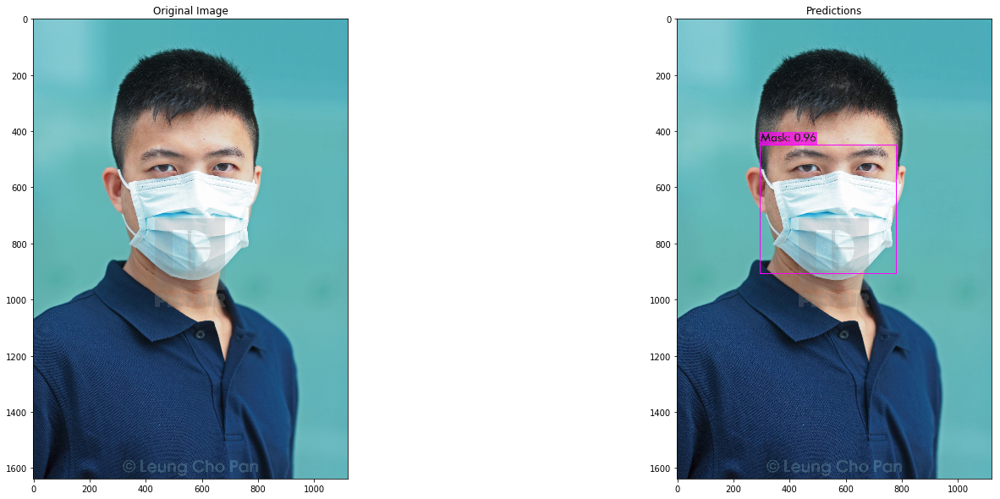

In [30]:
!./darknet detector test yolov4-mask-setup.data yolov4-mask-test.cfg backup/yolov4-mask-train_best1.weights test-image1.jpg -thresh .6 2> /dev/null
display_output("test-image1.jpg")

 CUDNN_HALF=1 
net.optimized_memory = 0 
mini_batch = 1, batch = 1, time_steps = 1, train = 0 
nms_kind: greedynms (1), beta = 0.600000 
nms_kind: greedynms (1), beta = 0.600000 
nms_kind: greedynms (1), beta = 0.600000 

 seen 64, trained: 89 K-images (1 Kilo-batches_64) 
 Detection layer: 139 - type = 27 
 Detection layer: 150 - type = 27 
 Detection layer: 161 - type = 27 
test-image2.jpg: Predicted in 52.476000 milli-seconds.
Mask: 99%
Mask: 99%
Mask: 73%
No-mask: 99%
Mask: 97%


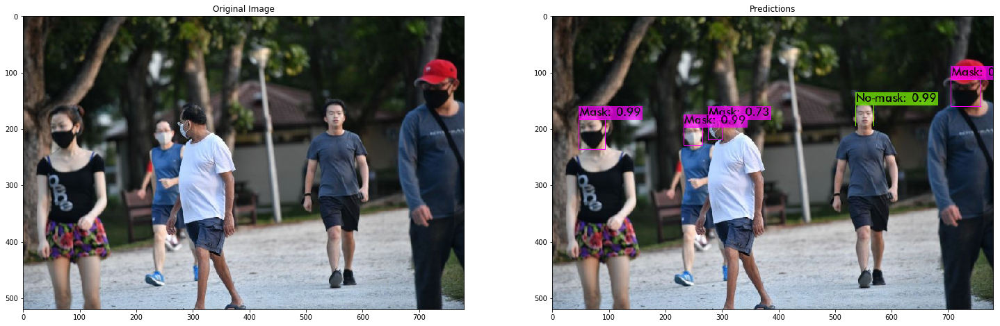

In [31]:
!./darknet detector test yolov4-mask-setup.data yolov4-mask-test-old.cfg backup/yolov4-mask-train_best1.weights test-image2.jpg -thresh .6 2> /dev/null
display_output("test-image2.jpg")

 CUDNN_HALF=1 
net.optimized_memory = 0 
mini_batch = 1, batch = 1, time_steps = 1, train = 0 
nms_kind: greedynms (1), beta = 0.600000 
nms_kind: greedynms (1), beta = 0.600000 
nms_kind: greedynms (1), beta = 0.600000 

 seen 64, trained: 89 K-images (1 Kilo-batches_64) 
 Detection layer: 139 - type = 27 
 Detection layer: 150 - type = 27 
 Detection layer: 161 - type = 27 
test-image3.jpg: Predicted in 53.483000 milli-seconds.
Mask: 93%
Mask: 99%
Mask: 99%
No-mask: 86%
Mask: 99%
Mask: 99%
Mask: 99%
Mask: 92%
Mask: 99%
Mask: 99%
Mask: 100%
Mask: 98%
Mask: 99%
Mask: 99%
Mask: 99%
Mask: 99%
Mask: 98%
Mask: 99%
Mask: 97%


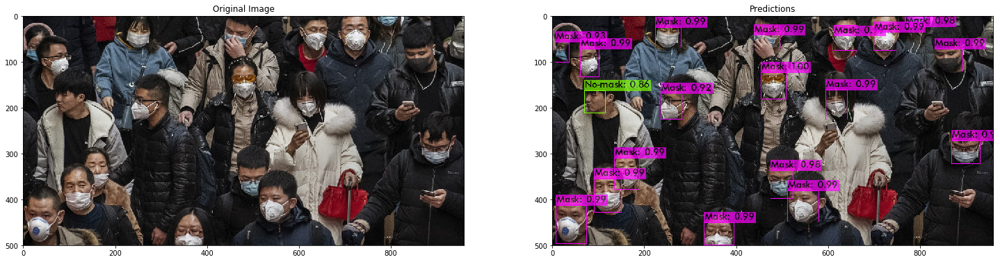

In [32]:
!./darknet detector test yolov4-mask-setup.data yolov4-mask-test-old.cfg backup/yolov4-mask-train_best1.weights test-image3.jpg -thresh .6 2> /dev/null
display_output("test-image3.jpg")

 CUDNN_HALF=1 
net.optimized_memory = 0 
mini_batch = 1, batch = 1, time_steps = 1, train = 0 
nms_kind: greedynms (1), beta = 0.600000 
nms_kind: greedynms (1), beta = 0.600000 
nms_kind: greedynms (1), beta = 0.600000 

 seen 64, trained: 89 K-images (1 Kilo-batches_64) 
 Detection layer: 139 - type = 27 
 Detection layer: 150 - type = 27 
 Detection layer: 161 - type = 27 
test-image4.jpg: Predicted in 52.114000 milli-seconds.
No-mask: 98%
No-mask: 82%
Mask: 96%
Mask: 64%
No-mask: 83%
Mask: 99%
No-mask: 95%
Mask: 99%
No-mask: 92%
Mask: 100%


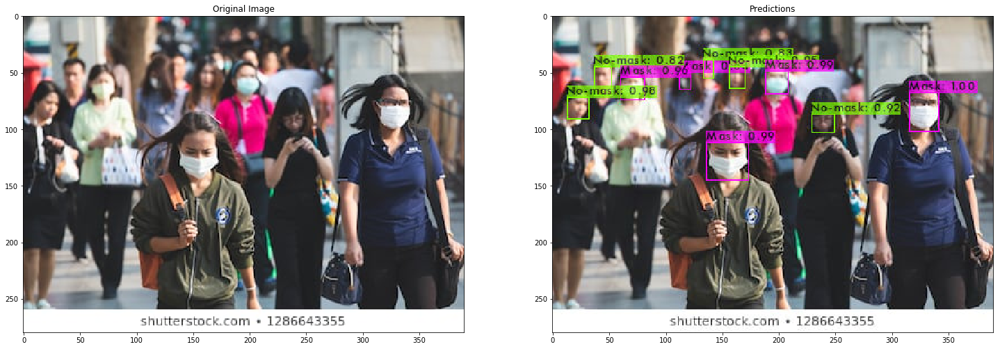

In [33]:
!./darknet detector test yolov4-mask-setup.data yolov4-mask-test-old.cfg backup/yolov4-mask-train_best1.weights test-image4.jpg -thresh .6 2> /dev/null
display_output("test-image4.jpg")

In [34]:
!./darknet detector demo yolov4-mask-setup.data yolov4-mask-test.cfg backup/yolov4-mask-train_best.weights test-video1.mp4 -thresh .6 -out_filename out-vid1.avi

 CUDA-version: 10000 (10020), cuDNN: 7.6.4, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 4.2.0
Demo
 0 : compute_capability = 750, cudnn_half = 1, GPU: GeForce RTX 2070 SUPER 
net.optimized_memory = 0 
mini_batch = 1, batch = 1, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    960 x 960 x   3 ->  960 x 960 x  32 1.593 BF
   1 conv     64       3 x 3/ 2    960 x 960 x  32 ->  480 x 480 x  64 8.493 BF
   2 conv     64       1 x 1/ 1    480 x 480 x  64 ->  480 x 480 x  64 1.887 BF
   3 route  1 		                           ->  480 x 480 x  64 
   4 conv     64       1 x 1/ 1    480 x 480 x  64 ->  480 x 480 x  64 1.887 BF
   5 conv     32       1 x 1/ 1    480 x 480 x  64 ->  480 x 480 x  32 0.944 BF
   6 conv     64       3 x 3/ 1    480 x 480 x  32 ->  480 x 480 x  64 8.493 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 480 x 480 x  64 0.015 BF
   8 conv     64       1 x 1/ 1    480 x 

 104 conv   1024       1 x 1/ 1     30 x  30 x1024 ->   30 x  30 x1024 1.887 BF
 105 conv    512       1 x 1/ 1     30 x  30 x1024 ->   30 x  30 x 512 0.944 BF
 106 conv   1024       3 x 3/ 1     30 x  30 x 512 ->   30 x  30 x1024 8.493 BF
 107 conv    512       1 x 1/ 1     30 x  30 x1024 ->   30 x  30 x 512 0.944 BF
 108 max                5x 5/ 1     30 x  30 x 512 ->   30 x  30 x 512 0.012 BF
 109 route  107 		                           ->   30 x  30 x 512 
 110 max                9x 9/ 1     30 x  30 x 512 ->   30 x  30 x 512 0.037 BF
 111 route  107 		                           ->   30 x  30 x 512 
 112 max               13x13/ 1     30 x  30 x 512 ->   30 x  30 x 512 0.078 BF
 113 route  112 110 108 107 	                   ->   30 x  30 x2048 
 114 conv    512       1 x 1/ 1     30 x  30 x2048 ->   30 x  30 x 512 1.887 BF
 115 conv   1024       3 x 3/ 1     30 x  30 x 512 ->   30 x  30 x1024 8.493 BF
 116 conv    512       1 x 1/ 1     30 x  30 x1024 ->   30 x  30 x 512 0.944 BF

Objects:

No-mask: 100% 
No-mask: 100% 
No-mask: 100% 
No-mask: 100% 
Mask: 96% 

FPS:14.9 	 AVG_FPS:0.0

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 100% 
No-mask: 100% 
No-mask: 85% 
Mask: 95% 

FPS:15.0 	 AVG_FPS:0.0

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 100% 
No-mask: 100% 
No-mask: 87% 
Mask: 95% 

FPS:15.1 	 AVG_FPS:0.0

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 100% 
No-mask: 100% 
Mask: 92% 
Mask: 85% 

FPS:15.2 	 AVG_FPS:0.0

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 100% 
No-mask: 99% 
Mask: 98% 
Mask: 96% 

FPS:15.3 	 AVG_FPS:0.0

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 100% 
No-mask: 100% 
Mask: 100% 
Mask: 96% 

FPS:15.3 	 AVG_FPS:0.0

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 100% 
No-mask: 93% 
Mask: 100% 
Mask: 96% 

FPS:15.4 	 AVG_FPS:0.0

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 100% 
Mask: 100% 
Mask: 96% 

FPS:15.5 	 AVG_FPS:0.0

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 100% 
Mask: 100% 
Mask: 97% 

FPS:

Objects:

Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 99% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 98% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 99% 
Mask: 99% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 99% 
Mask: 98% 

FPS:16.2 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 98% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 99% 

FPS:16.2 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 98% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 99% 
Mask: 98% 

FPS:16.2 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 99% 
Mask: 99% 

FPS:16.2 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

Mask


 cvWriteFrame 
Objects:

No-mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 99% 
Mask: 99% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 99% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 99% 

FPS:16.2 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 99% 

FPS:16.2 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 99% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 99% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 99% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 99% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 99% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 99% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 98% 

FPS:16.0 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 99% 

FPS:16.1 	 

Objects:

No-mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 99% 
Mask: 99% 

FPS:16.0 	 AVG_FPS:16.0

 cvWriteFrame 
Objects:

No-mask: 99% 
Mask: 100% 
Mask: 100% 
Mask: 99% 
Mask: 99% 

FPS:16.0 	 AVG_FPS:16.0

 cvWriteFrame 
Objects:

No-mask: 99% 
Mask: 100% 
Mask: 100% 
Mask: 99% 
Mask: 98% 

FPS:16.0 	 AVG_FPS:16.0

 cvWriteFrame 
Objects:

No-mask: 99% 
Mask: 100% 
Mask: 100% 
Mask: 99% 
Mask: 99% 

FPS:16.0 	 AVG_FPS:16.0

 cvWriteFrame 
Objects:

No-mask: 99% 
Mask: 100% 
Mask: 100% 
Mask: 99% 
Mask: 98% 

FPS:16.0 	 AVG_FPS:16.0

 cvWriteFrame 
Objects:

No-mask: 99% 
Mask: 100% 
Mask: 100% 
Mask: 99% 
Mask: 99% 

FPS:16.0 	 AVG_FPS:16.0

 cvWriteFrame 
Objects:

No-mask: 98% 
Mask: 100% 
Mask: 100% 
Mask: 99% 
Mask: 99% 

FPS:16.0 	 AVG_FPS:16.0

 cvWriteFrame 
Objects:

No-mask: 98% 
Mask: 100% 
Mask: 100% 
Mask: 99% 
Mask: 99% 

FPS:16.0 	 AVG_FPS:16.0

 cvWriteFrame 
Objects:

No-mask: 98% 
Mask: 100% 
Mask: 100% 
Mask: 99% 
Mask: 99% 

FPS:16.1 	 AVG_FPS:16.0

 cvWriteFrame 



 cvWriteFrame 
Objects:

Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 99% 
Mask: 97% 

FPS:16.0 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 98% 
Mask: 97% 

FPS:16.0 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 98% 
Mask: 98% 

FPS:16.0 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 99% 
Mask: 97% 

FPS:16.0 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 99% 
Mask: 97% 

FPS:16.0 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 99% 
Mask: 98% 

FPS:16.0 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 99% 
Mask: 97% 

FPS:16.0 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 99% 
Mask: 98% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 99% 
Mask: 98% 

FPS:16.0 	 AVG_FPS:16.1

 cvWriteFrame 
Obj


 cvWriteFrame 
Objects:

Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 99% 

FPS:16.1 	 AVG_FPS:16.0

 cvWriteFrame 
Objects:

Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 99% 

FPS:16.0 	 AVG_FPS:16.0

 cvWriteFrame 
Objects:

Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 99% 

FPS:16.0 	 AVG_FPS:16.0

 cvWriteFrame 
Objects:

Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 99% 

FPS:16.0 	 AVG_FPS:16.0

 cvWriteFrame 
Objects:

Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 99% 
Mask: 99% 

FPS:16.0 	 AVG_FPS:16.0

 cvWriteFrame 
Objects:

Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 99% 
Mask: 97% 

FPS:16.0 	 AVG_FPS:16.0

 cvWriteFrame 
Objects:

Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 99% 
Mask: 98% 

FPS:16.0 	 AVG_FPS:16.0

 cvWriteFrame 
Objects:

Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 99% 
Mask: 98% 

FPS:16.0 	 AVG_FPS:16.0

 cvWriteFrame 
Objects:

Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 99% 
Mask: 99% 

FPS:16.0 	 AVG_FPS:16.0

 cvWriteFrame 


 cvWriteFrame 
Objects:

Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 99% 

FPS:16.0 	 AVG_FPS:16.0

 cvWriteFrame 
Objects:

Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 99% 
Mask: 99% 

FPS:16.0 	 AVG_FPS:16.0

 cvWriteFrame 
Objects:

Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 99% 
Mask: 99% 

FPS:16.0 	 AVG_FPS:16.0

 cvWriteFrame 
Objects:

Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 99% 
Mask: 99% 

FPS:16.0 	 AVG_FPS:16.0

 cvWriteFrame 
Objects:

Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 99% 
Mask: 99% 

FPS:16.0 	 AVG_FPS:16.0

 cvWriteFrame 
Objects:

Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 99% 

FPS:15.9 	 AVG_FPS:16.0

 cvWriteFrame 
Objects:

Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 

FPS:16.0 	 AVG_FPS:16.0

 cvWriteFrame 
Objects:

Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 

FPS:16.0 	 AVG_FPS:16.0

 cvWriteFrame 
Objects:

Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 100% 
Mask: 99% 

FPS:16.0 	 AVG_FPS:16.0

 cvWriteFra

In [35]:
!./darknet detector demo yolov4-mask-setup.data yolov4-mask-test.cfg backup/yolov4-mask-train_best.weights test-video2.mp4 -thresh .6 -out_filename out-vid2.avi

 CUDA-version: 10000 (10020), cuDNN: 7.6.4, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 4.2.0
Demo
 0 : compute_capability = 750, cudnn_half = 1, GPU: GeForce RTX 2070 SUPER 
net.optimized_memory = 0 
mini_batch = 1, batch = 1, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    960 x 960 x   3 ->  960 x 960 x  32 1.593 BF
   1 conv     64       3 x 3/ 2    960 x 960 x  32 ->  480 x 480 x  64 8.493 BF
   2 conv     64       1 x 1/ 1    480 x 480 x  64 ->  480 x 480 x  64 1.887 BF
   3 route  1 		                           ->  480 x 480 x  64 
   4 conv     64       1 x 1/ 1    480 x 480 x  64 ->  480 x 480 x  64 1.887 BF
   5 conv     32       1 x 1/ 1    480 x 480 x  64 ->  480 x 480 x  32 0.944 BF
   6 conv     64       3 x 3/ 1    480 x 480 x  32 ->  480 x 480 x  64 8.493 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 480 x 480 x  64 0.015 BF
   8 conv     64       1 x 1/ 1    480 x 

 104 conv   1024       1 x 1/ 1     30 x  30 x1024 ->   30 x  30 x1024 1.887 BF
 105 conv    512       1 x 1/ 1     30 x  30 x1024 ->   30 x  30 x 512 0.944 BF
 106 conv   1024       3 x 3/ 1     30 x  30 x 512 ->   30 x  30 x1024 8.493 BF
 107 conv    512       1 x 1/ 1     30 x  30 x1024 ->   30 x  30 x 512 0.944 BF
 108 max                5x 5/ 1     30 x  30 x 512 ->   30 x  30 x 512 0.012 BF
 109 route  107 		                           ->   30 x  30 x 512 
 110 max                9x 9/ 1     30 x  30 x 512 ->   30 x  30 x 512 0.037 BF
 111 route  107 		                           ->   30 x  30 x 512 
 112 max               13x13/ 1     30 x  30 x 512 ->   30 x  30 x 512 0.078 BF
 113 route  112 110 108 107 	                   ->   30 x  30 x2048 
 114 conv    512       1 x 1/ 1     30 x  30 x2048 ->   30 x  30 x 512 1.887 BF
 115 conv   1024       3 x 3/ 1     30 x  30 x 512 ->   30 x  30 x1024 8.493 BF
 116 conv    512       1 x 1/ 1     30 x  30 x1024 ->   30 x  30 x 512 0.944 BF


 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 98% 
No-mask: 78% 
Mask: 98% 

FPS:15.4 	 AVG_FPS:0.0

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 92% 
No-mask: 87% 
No-mask: 68% 

FPS:15.5 	 AVG_FPS:0.0

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 96% 
No-mask: 88% 
No-mask: 76% 

FPS:15.5 	 AVG_FPS:0.0

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 94% 
No-mask: 90% 
No-mask: 76% 

FPS:15.6 	 AVG_FPS:0.0

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 95% 
No-mask: 91% 
No-mask: 81% 

FPS:15.6 	 AVG_FPS:0.0

 cvWriteFrame 
Objects:

No-mask: 97% 
No-mask: 96% 
No-mask: 72% 
No-mask: 70% 

FPS:15.7 	 AVG_FPS:0.0

 cvWriteFrame 
Objects:

No-mask: 98% 
No-mask: 96% 
No-mask: 93% 
No-mask: 62% 

FPS:15.8 	 AVG_FPS:0.0

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 90% 
No-mask: 83% 

FPS:15.8 	 AVG_FPS:0.0

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 97% 
No-mask: 86% 
No-mask: 86% 
No-mask: 78% 

FPS:15.8 	 AVG_FPS:0.0

 cvWriteFrame 
Objects:

No-mask: 100% 
No-m


 cvWriteFrame 
Objects:

No-mask: 84% 
No-mask: 84% 
Mask: 99% 
Mask: 98% 
Mask: 80% 

FPS:16.1 	 AVG_FPS:16.2

 cvWriteFrame 
Objects:

No-mask: 87% 
No-mask: 66% 
Mask: 99% 
Mask: 96% 
Mask: 91% 
Mask: 83% 

FPS:16.1 	 AVG_FPS:16.2

 cvWriteFrame 
Objects:

No-mask: 88% 
No-mask: 67% 
Mask: 99% 
Mask: 95% 
Mask: 91% 
Mask: 82% 

FPS:16.1 	 AVG_FPS:16.2

 cvWriteFrame 
Objects:

No-mask: 84% 
No-mask: 76% 
No-mask: 76% 
Mask: 99% 
Mask: 99% 
Mask: 94% 
Mask: 77% 

FPS:16.1 	 AVG_FPS:16.2

 cvWriteFrame 
Objects:

No-mask: 86% 
No-mask: 70% 
Mask: 99% 
Mask: 99% 
Mask: 97% 
Mask: 91% 

FPS:16.1 	 AVG_FPS:16.2

 cvWriteFrame 
Objects:

No-mask: 83% 
No-mask: 82% 
Mask: 99% 
Mask: 98% 
Mask: 97% 
Mask: 95% 

FPS:16.2 	 AVG_FPS:16.2

 cvWriteFrame 
Objects:

No-mask: 91% 
No-mask: 88% 
No-mask: 63% 
Mask: 100% 
Mask: 100% 
Mask: 91% 
Mask: 82% 

FPS:16.2 	 AVG_FPS:16.2

 cvWriteFrame 
Objects:

No-mask: 95% 
No-mask: 72% 
Mask: 100% 
Mask: 100% 
Mask: 95% 
Mask: 94% 

FPS:16.2 	 AVG_FPS:

Objects:

No-mask: 100% 
No-mask: 97% 
No-mask: 93% 
No-mask: 79% 
Mask: 84% 

FPS:16.2 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 96% 
No-mask: 96% 
No-mask: 95% 
No-mask: 93% 

FPS:16.2 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 99% 
No-mask: 93% 
No-mask: 91% 
No-mask: 90% 

FPS:16.2 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 99% 
No-mask: 97% 
No-mask: 95% 
No-mask: 92% 

FPS:16.2 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 99% 
No-mask: 99% 
No-mask: 97% 
No-mask: 95% 

FPS:16.2 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 99% 
No-mask: 99% 
No-mask: 96% 
No-mask: 95% 

FPS:16.2 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 99% 
No-mask: 98% 
No-mask: 97% 
No-mask: 95% 

FPS:16.2 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 99% 
No-mask: 98% 
No-mask: 98% 
No-mask: 82% 

FPS:16.2 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 100% 
No

Objects:

No-mask: 100% 
No-mask: 89% 
No-mask: 80% 
No-mask: 75% 
Mask: 100% 
Mask: 98% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 85% 
No-mask: 71% 
Mask: 100% 
Mask: 98% 
Mask: 79% 

FPS:16.0 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 80% 
Mask: 100% 
Mask: 99% 
Mask: 82% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 99% 
Mask: 100% 
Mask: 99% 
Mask: 93% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 99% 
Mask: 100% 
Mask: 99% 
Mask: 95% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 99% 
Mask: 99% 
Mask: 97% 
Mask: 90% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 81% 
Mask: 98% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 100% 
Mask: 99% 
Mask: 95% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 98% 
Mask: 100% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 98% 
No-mask: 96% 
No-mask: 61% 
Mask: 100% 


Objects:

No-mask: 99% 
No-mask: 87% 
No-mask: 81% 
No-mask: 70% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 83% 
No-mask: 65% 
No-mask: 60% 

FPS:16.0 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 86% 
No-mask: 77% 
No-mask: 61% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 91% 
No-mask: 81% 
No-mask: 80% 
No-mask: 71% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 91% 
No-mask: 87% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 96% 
No-mask: 86% 
No-mask: 78% 
No-mask: 64% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 97% 
No-mask: 93% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 97% 
No-mask: 95% 

FPS:16.0 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 98% 
No-mask: 97% 
No-mask: 71% 
No-mask: 62% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 98% 
No-mask: 78% 

FPS:16.0 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 98% 
No-mask: 96% 
No-m

Objects:

No-mask: 99% 
No-mask: 97% 
No-mask: 87% 
Mask: 98% 

FPS:16.2 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 98% 
No-mask: 79% 
No-mask: 67% 
Mask: 100% 
Mask: 97% 
Mask: 75% 

FPS:16.2 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 96% 
No-mask: 61% 
Mask: 99% 
Mask: 99% 
Mask: 99% 

FPS:16.2 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 82% 
Mask: 100% 
Mask: 97% 
Mask: 83% 

FPS:16.2 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 97% 
No-mask: 83% 
Mask: 99% 
Mask: 97% 

FPS:16.2 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 97% 
No-mask: 86% 
Mask: 99% 
Mask: 97% 

FPS:16.2 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 90% 
No-mask: 64% 
Mask: 100% 
Mask: 99% 

FPS:16.2 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 93% 
Mask: 99% 
Mask: 99% 

FPS:16.2 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 80% 
No-mask: 70% 
Mask: 100% 
Mask: 99% 

FPS:16.2 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 100%


 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 100% 
No-mask: 91% 
Mask: 90% 
Mask: 78% 

FPS:16.2 	 AVG_FPS:16.2

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 99% 
No-mask: 94% 
No-mask: 91% 
Mask: 77% 

FPS:16.1 	 AVG_FPS:16.2

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 99% 
No-mask: 98% 
No-mask: 81% 
Mask: 76% 

FPS:16.2 	 AVG_FPS:16.2

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 100% 
No-mask: 97% 
No-mask: 95% 
No-mask: 77% 
Mask: 90% 

FPS:16.1 	 AVG_FPS:16.2

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 100% 
No-mask: 97% 
No-mask: 96% 
No-mask: 83% 
Mask: 89% 

FPS:16.2 	 AVG_FPS:16.2

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 99% 
No-mask: 98% 
No-mask: 97% 
No-mask: 75% 
Mask: 100% 

FPS:16.1 	 AVG_FPS:16.2

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 99% 
No-mask: 97% 
No-mask: 96% 
No-mask: 81% 
Mask: 99% 

FPS:16.2 	 AVG_FPS:16.2

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 99% 
No-mask: 98% 
Mask: 97% 
Mask: 62% 

FPS:16.1 	 AVG_FPS:1

Objects:

No-mask: 97% 
No-mask: 91% 
No-mask: 82% 
Mask: 98% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 97% 
No-mask: 89% 
No-mask: 60% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 85% 
No-mask: 78% 
No-mask: 63% 
Mask: 62% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 96% 
No-mask: 94% 
No-mask: 79% 
No-mask: 75% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 95% 
No-mask: 86% 
No-mask: 71% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 88% 
No-mask: 78% 
No-mask: 78% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 87% 
No-mask: 78% 
No-mask: 77% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 87% 
No-mask: 87% 
No-mask: 62% 
Mask: 83% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 95% 
No-mask: 89% 
No-mask: 75% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 96% 
No-ma

Objects:

No-mask: 100% 
No-mask: 99% 
No-mask: 97% 
No-mask: 96% 
No-mask: 93% 

FPS:16.1 	 AVG_FPS:16.2

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 99% 
No-mask: 95% 
No-mask: 87% 

FPS:16.1 	 AVG_FPS:16.2

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 96% 
No-mask: 95% 
No-mask: 93% 

FPS:16.1 	 AVG_FPS:16.2

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 96% 
No-mask: 94% 
No-mask: 94% 

FPS:16.1 	 AVG_FPS:16.2

 cvWriteFrame 
Objects:

No-mask: 97% 
No-mask: 95% 
No-mask: 90% 
No-mask: 89% 

FPS:16.1 	 AVG_FPS:16.2

 cvWriteFrame 
Objects:

No-mask: 96% 
No-mask: 90% 

FPS:16.1 	 AVG_FPS:16.2

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 97% 

FPS:16.1 	 AVG_FPS:16.2

 cvWriteFrame 
Objects:

No-mask: 95% 
No-mask: 81% 
No-mask: 69% 

FPS:16.1 	 AVG_FPS:16.2

 cvWriteFrame 
Objects:

No-mask: 96% 
No-mask: 62% 

FPS:16.2 	 AVG_FPS:16.2

 cvWriteFrame 
Objects:

No-mask: 96% 

FPS:16.1 	 AVG_FPS:16.2

 cvWriteFrame 
Objects:

No-mask: 97% 
No-mask: 95% 
No-mask: 80% 
Ma

Objects:

No-mask: 97% 
No-mask: 93% 
No-mask: 82% 
No-mask: 62% 
Mask: 100% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 97% 
No-mask: 76% 
Mask: 100% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 89% 
No-mask: 88% 
Mask: 100% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 88% 
No-mask: 86% 
Mask: 100% 

FPS:16.2 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 83% 
Mask: 100% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 94% 
No-mask: 93% 
No-mask: 66% 
Mask: 100% 

FPS:16.2 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 94% 
No-mask: 91% 
Mask: 100% 

FPS:16.2 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 98% 
No-mask: 97% 
Mask: 100% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 99% 
No-mask: 92% 
No-mask: 81% 
Mask: 100% 
Mask: 99% 

FPS:16.2 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 99% 
No-mask: 91% 
No-mask: 80% 
No-mask: 66% 
Mask: 

Objects:

No-mask: 100% 
No-mask: 99% 
No-mask: 99% 
No-mask: 92% 
No-mask: 64% 
Mask: 99% 
Mask: 96% 

FPS:16.0 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 99% 
No-mask: 99% 
No-mask: 93% 
No-mask: 73% 
No-mask: 60% 
Mask: 99% 
Mask: 96% 

FPS:16.0 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 99% 
No-mask: 99% 
No-mask: 91% 
No-mask: 72% 
Mask: 100% 
Mask: 96% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 99% 
No-mask: 99% 
No-mask: 98% 
Mask: 100% 
Mask: 95% 

FPS:16.0 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 98% 
No-mask: 97% 
No-mask: 95% 
Mask: 100% 
Mask: 88% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 99% 
No-mask: 99% 
No-mask: 88% 
No-mask: 80% 
Mask: 100% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 100% 
No-mask: 96% 
No-mask: 95% 
No-mask: 95% 
Mask: 100% 

FPS:16.0 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 100% 


Objects:

No-mask: 93% 
No-mask: 88% 
No-mask: 87% 
No-mask: 78% 
No-mask: 66% 
Mask: 99% 
Mask: 95% 

FPS:16.1 	 AVG_FPS:15.9

 cvWriteFrame 
Objects:

No-mask: 91% 
No-mask: 83% 
No-mask: 82% 
No-mask: 77% 
No-mask: 76% 
Mask: 99% 
Mask: 93% 

FPS:16.1 	 AVG_FPS:15.9

 cvWriteFrame 
Objects:

No-mask: 92% 
No-mask: 91% 
No-mask: 86% 
No-mask: 85% 
No-mask: 70% 
Mask: 99% 
Mask: 96% 

FPS:16.1 	 AVG_FPS:15.9

 cvWriteFrame 
Objects:

No-mask: 82% 
No-mask: 78% 
No-mask: 78% 
No-mask: 74% 
Mask: 99% 
Mask: 99% 

FPS:16.2 	 AVG_FPS:15.9

 cvWriteFrame 
Objects:

No-mask: 93% 
No-mask: 85% 
No-mask: 79% 
No-mask: 75% 
No-mask: 65% 
Mask: 99% 
Mask: 92% 

FPS:16.2 	 AVG_FPS:15.9

 cvWriteFrame 
Objects:

No-mask: 82% 
No-mask: 68% 
No-mask: 65% 
Mask: 99% 
Mask: 72% 

FPS:16.2 	 AVG_FPS:15.9

 cvWriteFrame 
Objects:

No-mask: 80% 
No-mask: 66% 
Mask: 99% 

FPS:16.1 	 AVG_FPS:15.9

 cvWriteFrame 
Objects:

No-mask: 98% 
No-mask: 90% 
No-mask: 82% 
No-mask: 76% 
No-mask: 76% 
No-mask: 74% 


Objects:

No-mask: 99% 
No-mask: 97% 
No-mask: 93% 
No-mask: 90% 
No-mask: 70% 
No-mask: 67% 
Mask: 97% 

FPS:16.2 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 98% 
No-mask: 95% 
No-mask: 94% 
No-mask: 93% 
Mask: 96% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 95% 
No-mask: 95% 
No-mask: 94% 
No-mask: 93% 
No-mask: 91% 
Mask: 87% 

FPS:16.2 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 98% 
No-mask: 97% 
No-mask: 93% 
No-mask: 92% 
No-mask: 76% 
No-mask: 71% 
Mask: 94% 

FPS:16.2 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 98% 
No-mask: 97% 
No-mask: 93% 
No-mask: 92% 
No-mask: 77% 
No-mask: 71% 
Mask: 94% 

FPS:16.2 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 98% 
No-mask: 97% 
No-mask: 80% 
No-mask: 70% 
Mask: 95% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 98% 
No-mask: 98% 
No-mask: 90% 
No-mask: 85% 
No-mask: 63% 
Mask: 98% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Obje

Objects:

No-mask: 100% 
Mask: 88% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 100% 
Mask: 99% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 68% 
Mask: 98% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 64% 
No-mask: 61% 
Mask: 95% 

FPS:16.0 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 100% 
Mask: 97% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 92% 
No-mask: 84% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 90% 
No-mask: 83% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 92% 

FPS:16.0 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 94% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 97% 
No-mask: 66% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 95% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 99% 
No-mask: 99% 


Objects:

No-mask: 96% 
No-mask: 93% 
No-mask: 89% 
No-mask: 87% 
Mask: 100% 

FPS:16.0 	 AVG_FPS:16.0

 cvWriteFrame 
Objects:

No-mask: 98% 
No-mask: 97% 
No-mask: 95% 
No-mask: 86% 
Mask: 100% 

FPS:16.0 	 AVG_FPS:16.0

 cvWriteFrame 
Objects:

No-mask: 97% 
No-mask: 84% 
No-mask: 74% 
Mask: 100% 

FPS:16.0 	 AVG_FPS:16.0

 cvWriteFrame 
Objects:

No-mask: 95% 
No-mask: 95% 
No-mask: 91% 
No-mask: 64% 
Mask: 100% 
Mask: 95% 

FPS:16.0 	 AVG_FPS:16.0

 cvWriteFrame 
Objects:

No-mask: 98% 
No-mask: 81% 
Mask: 100% 
Mask: 94% 

FPS:16.0 	 AVG_FPS:16.0

 cvWriteFrame 
Objects:

No-mask: 94% 
No-mask: 93% 
No-mask: 89% 
No-mask: 72% 
Mask: 100% 
Mask: 97% 
Mask: 67% 

FPS:16.0 	 AVG_FPS:16.0

 cvWriteFrame 
Objects:

No-mask: 94% 
No-mask: 93% 
No-mask: 88% 
No-mask: 72% 
Mask: 100% 
Mask: 97% 
Mask: 69% 

FPS:16.1 	 AVG_FPS:16.0

 cvWriteFrame 
Objects:

No-mask: 98% 
No-mask: 93% 
No-mask: 93% 
No-mask: 81% 
Mask: 100% 
Mask: 99% 
Mask: 94% 

FPS:16.1 	 AVG_FPS:16.0

 cvWriteFrame 
Ob


 cvWriteFrame 
Objects:

No-mask: 98% 
No-mask: 92% 
Mask: 99% 
Mask: 99% 
Mask: 94% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 72% 
Mask: 100% 
Mask: 99% 
Mask: 94% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 98% 
No-mask: 74% 
Mask: 100% 
Mask: 99% 
Mask: 95% 

FPS:16.2 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 98% 
No-mask: 77% 
Mask: 100% 
Mask: 99% 
Mask: 99% 

FPS:16.2 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 93% 
Mask: 100% 
Mask: 99% 
Mask: 99% 

FPS:16.2 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 85% 
No-mask: 65% 
Mask: 99% 
Mask: 99% 
Mask: 92% 

FPS:16.2 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 94% 
Mask: 100% 
Mask: 98% 
Mask: 98% 

FPS:16.2 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 97% 
No-mask: 96% 
Mask: 100% 
Mask: 99% 
Mask: 95% 

FPS:16.2 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 97% 
No-mask: 96% 
Mask: 100% 
Mask: 99% 
Mask: 95% 

FPS:16.2 	 AVG_FPS:16.1

 cvWriteFram


 cvWriteFrame 
Objects:

No-mask: 98% 
No-mask: 94% 
No-mask: 75% 
No-mask: 65% 
Mask: 93% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 98% 
No-mask: 96% 
No-mask: 76% 
No-mask: 71% 
Mask: 91% 

FPS:16.0 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 97% 
No-mask: 87% 
Mask: 99% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 98% 
No-mask: 90% 
No-mask: 83% 
Mask: 91% 

FPS:16.0 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 81% 
Mask: 99% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 84% 
Mask: 97% 
Mask: 82% 

FPS:16.0 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 88% 
Mask: 100% 
Mask: 81% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 89% 
Mask: 100% 
Mask: 81% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 68% 
No-mask: 64% 
Mask: 98% 
Mask: 66% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 74% 


Objects:

No-mask: 97% 
No-mask: 93% 
No-mask: 82% 
No-mask: 60% 

FPS:16.0 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 98% 
No-mask: 91% 
No-mask: 82% 

FPS:16.0 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 90% 
No-mask: 89% 
No-mask: 70% 

FPS:16.0 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 96% 
No-mask: 90% 
No-mask: 74% 
No-mask: 62% 

FPS:16.1 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 98% 
No-mask: 93% 
No-mask: 91% 
No-mask: 76% 

FPS:16.0 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 98% 
No-mask: 79% 
No-mask: 73% 

FPS:16.0 	 AVG_FPS:16.1

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 76% 
No-mask: 72% 
No-mask: 60% 

FPS:16.0 	 AVG_FPS:16.0

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 89% 
No-mask: 80% 
No-mask: 66% 

FPS:16.0 	 AVG_FPS:16.0

 cvWriteFrame 
Objects:

No-mask: 100% 
No-mask: 95% 
No-mask: 93% 
No-mask: 79% 

FPS:16.0 	 AVG_FPS:16.0

 cvWriteFrame 
Objects:

No-mask: 99% 
No-mask: 94

In [14]:
!./darknet detector test yolov4-mask-setup.data yolov4-mask-test-old.cfg backup_mask_yolov4/yolov4-mask-train_best1.weights Manish.jpeg -thresh .6 2> /dev/null

 CUDNN_HALF=1 
net.optimized_memory = 0 
mini_batch = 1, batch = 1, time_steps = 1, train = 0 
nms_kind: greedynms (1), beta = 0.600000 
nms_kind: greedynms (1), beta = 0.600000 
nms_kind: greedynms (1), beta = 0.600000 

 seen 64, trained: 89 K-images (1 Kilo-batches_64) 
 Detection layer: 139 - type = 27 
 Detection layer: 150 - type = 27 
 Detection layer: 161 - type = 27 
Manish.jpeg: Predicted in 52.209000 milli-seconds.
No-mask: 84%
